In [5]:
import numpy as np
from tifffile import tifffile as tf
import glob
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import numpy.ma as ma
import scipy.signal as ss
import scipy.interpolate as interp
import skimage.transform as skt
import math
import scipy
import matplotlib.pyplot as plt
import matplotlib

#Image stuff
import matplotlib.patches as patches
from PIL import Image
from skimage.filters import threshold_otsu
from skimage.morphology import closing, square
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops_table
from skimage import util
import cv2
1
#ff stuff
import os

## Reading in multiple files from a folder

The biggest issue that arises is the storage of multiple file formats in the same folder. I think that if we use your method of applying /*/ to things, we can make the program very user friendly. Unfortunately, I struggle with this and would like your help. 

The big finding here is that tf.imread allows to use lists. No need for the for loop. Way more efficient/clean

In [10]:
dataPath = 'C:/Users/laure/OneDrive - University of Nebraska-Lincoln/Documents/Centurion Lab/nitrophenyl code/20180823'
runPath = '/*/*/ANDOR1_*.tif'
newPath = dataPath + runPath
print(newPath)


C:/Users/laure/OneDrive - University of Nebraska-Lincoln/Documents/Centurion Lab/nitrophenyl code/20180823/*/*/ANDOR1_*.tif


### My Version of File Reading

The big finding is that tf.imread is set up for lists of files. Took me like an hour to figure this out lol

In [17]:


files = glob.glob(newPath) 

def fileReading(file_path, shape = False, file_names = False):
    """
    Generates an array of images of TIFF files.
    
    Arguments:
    
    file_path (string) = Path containing the UED TIFF files. Path can be for a singular image or for a folder containing
                        many files. See examples below for example using //*// format style.
    shape (bool, optional) = Boolean expression. If set to True, function returns the shape of the image data array.
    file_names (bool, optional) = Boolean Expression. If set to true, function returns the list of file names.
    
    Returns: file_path, shape (if True), file_names (if True)
    
    numpy array or tuple: 
            If shape = False, file_names = False: Returns numpy array containing data from tiff files as a n x shape x shape (shape refers to the
                                dimensions of the TIFF file, typically 1024 x 1024).
            If shape = True: returns tuple. First element is a numpy array containing data from tiff files as a n x shape x shape
                                (shape refers to the dimensions of the TIFF file, typically 1024 x 1024). Second element is the dimensions
                                of the data array as a tuple.
            If file_names = True: returns tuple containing data array and list with file names.
            
    
    Examples:
    
    file_path = "Desktop/Folder/Data_Analysis/20034291//*//*//ANDOR1_*.tif"
    
    >>>fileReading(file_path)
        [[data1], ..., [dataN]]
    
    >>>fileReading(file_path)
        [[data1], ..., [dataN]], (220, 1024, 1024)
    
    Notes:
        - All images must be of same dimension. If images of different shapes needed, either group them by shape and run this function for
            each file shape or create it manually by reading files into a numpy array with dtype = object. Be careful as this can lead to 
            later problems
        - Review "*" notation to read in all files of a singular type. Expedites the process.
    
    """
    files = glob.glob(file_path) #read in file name
    if not files:
        FileNotFoundError(f"file_path input does not contain any TIFF files: {file_path}")
    data_array = tf.imread(files) # construct array containing files
    if shape and file_names:
        return data_array, data_array.shape, files
    elif shape:
        return data_array, data_array.shape
    elif file_names:
        return data_array, files
    else:
        return data_array
    
data_array, file_names = fileReading(newPath, file_names = True)
print(file_names[0])

C:/Users/laure/OneDrive - University of Nebraska-Lincoln/Documents/Centurion Lab/nitrophenyl code/20180823\scan1\images-ANDOR1\ANDOR1_Delay-001-108.6300_0001.tif


### Obtain stage positions

Use a method that assumes all the file names are of the same format. From here, we take the index of the first digit and the index of the last digit in the file name and create an arry using slicing. From here, we convert the type from string to array to get our stage positions.

In [21]:

def stagePosition(file_names, idx_start, idx_end, unique_positions = False ):
    """
    Finds the stage position in the string for every file name in the list of all TIFF files. Requires the user to find the
    index of the first digit and last digit of a single file and assumes all files are formatted identically. It uses these indices
    to retrieve the digits from the file names and stores them in a list. All files must have the exact same number of characters before
    the stage position in the name of the file. If this is an issue, group the file names by preceding characters and run this function
    on each list of files.
    
    If unique_positions = False, it returns the stage positions as a numpy array. If unique_positions = True, it returns a tuple
                        containing an array of the stage positions, an array of the unique stage positions, and an array containing
                        the indices of the unique stage positions in the original array.
    Arguments: 
    
    file_names (list containing strings): List of file names
    idxStart (int): the index of the first digit of the stage position in the file name
    idxEnd (int): the index of the last digit of the stage position in the file name
    unique_positions
    
    Returns: stage_pos, uniq_stage (optional), uniq_stage_idx (optional)
    
    stage_pos (array): Default. A numpy array containing the stage positions of the file. The index of each stage position corresponds to
                            the index of the file name in file_names.
    uniq_stage (array): Optional. A numpy array containing the unique stage positions listed in ascending order.
    uniq_stage_idx (array): Optional. A numpy array containing the indices of the unique stage positions in the original input array.
    
    Examples:
    
    file_names = ['image001_10.tif', 'image002_20.tif', 'image004_40.tif', 'image003_30.tif', 'image004_40.tif']
    >>> stagePosition(file_names, 9, 11)
        [10. 20. 40. 30. 40.]
    
    >>> stagePosition(file_names, 9, 11, unique_positions = True)
        (array([10., 20., 40., 30., 40.]), array([10., 20., 30., 40.]), array([0, 1, 3, 2]))

    """
    try:
        try:
            stage_pos = [np.float64(file_name[idx_start:idx_end]) for file_name in file_names]
            stage_pos = np.array(stage_pos)
            if unique_positions == True:
                uniq_stage, uniq_stage_idx = np.unique(stage_pos, return_index = True)
                return stage_pos, uniq_stage, uniq_stage_idx
            else:
                return stage_pos
            return stagePos
        except ValueError:
            raise ValueError("""Failed to convert a file name to a float. Make sure that index positions are correct for all files in file_names.""")
    except IndexError:
        raise ValueError("Invalid index values. Make sure the index values are within the range of the file name strings.")

stage_pos, uniq_stage, uniq_stage_idx = stagePosition(file_names, -17, -9, unique_positions=True)
    
    
file_names_arr = np.array(file_names)

print(len(stage_pos))
groups = []
for stage in uniq_stage:
    indices = np.where(stage_pos == stage)[0]
    print(len(indices), stage)
    
    groups.append(data_array[indices,:,:])

print("group shape = ", np.shape(groups))
print(data_array.shape)

#data arrays are grouped really nicely

185
5 108.0
5 108.01
5 108.6
5 108.61
5 108.62
5 108.63
5 108.64
5 108.65
5 108.66
5 108.67
5 108.68
5 108.69
5 108.7
5 108.71
5 108.72
5 108.73
5 108.74
5 108.75
5 108.76
5 108.77
5 108.78
5 108.79
5 108.8
5 108.81
5 108.82
5 108.85
5 108.88
5 108.91
5 108.94
5 108.97
5 109.05
5 109.2
5 109.35
5 109.5
5 110.17
5 111.67
5 116.17
group shape =  (37, 5, 1024, 1024)
(185, 1024, 1024)


In [14]:
def get_counts(data_array, plot = False):
    """
    Generates the counts from the given data by summing over the array elements. Returns 2d array of the same dimension as the
    input images.
    
    Arguments:
    
    data_array (numpy.ndarray): Numpy data array containing the diffraction images.
    plot (bool, optional): If set to true, generates a graph of the counts data.
    
    Returns:
    counts (numpy.ndarray): One dimensional numpy array containing the data after summing over each array element.
    
    Example:
    
    data = np.array([[[1, 2, 3], [4, 5, 6]], [[7, 8, 9], [10, 11, 12]]])
    >>>countData(data)
        array([21, 51])
    """
    counts = np.sum(data_array, axis = (1,2))
    if len(data_array) == 0:
        raise ValueError("Input data_array is empty.")
    if data_array.ndim != 3:
        raise ValueError("Input data_array is not 3 dimensional.")
    if plot == True:
        plt.plot(np.arange(len(data_array[:, 0, 0])), counts)
        plt.show()
    return counts

def get_image_details(file_names):
    """
    Returns the time at which each image was saved in order to track any drifts/changes that occur with respect to 
    lab time.
    
    Arguments: 
    data_array (numpy.ndarray): Numpy data array containing the diffraction images.
    file_names = ['image001_10.tif', 'image002_20.tif', 'image004_40.tif', 'image003_30.tif', 'image004_40.tif']
    
    Returns:
    data_array (ndarray): Array of N x 1024 x 1024 where N is the length of tile file_names list. Generated by using tifffile as tf.
    stage_pos (array): Default. A numpy array containing the stage positions of the file. The index of each stage position corresponds to
                            the index of the file name in file_names.
    file_order (array): Returns the image number located in the file name. Reflects the order with which the images are taken. 
    counts(ndarray): One dimensional numpy array of length N containing the data after summing over each array element.

    """
    data_array = tf.imread(file_names) # construct array containing files
    try:
        stage_pos = []
        file_order = []
        try:
            #stage_pos = [np.float64(file_name[idx_start:idx_end]) for file_name in file_names]
            #stage_pos = np.array(stage_pos)
            for file in file_names:
                string = list(map(str, file.split("\\")))
                string = list(map(str, string[-1].split("-")))
                file_order.append(int(string[1]))
                string = list(map(str, string[-1].split("_")))
                stage_pos.append(float(string[0]))
        except ValueError:
            raise ValueError("""Failed to convert a file name to a float. Make sure that index positions are correct for all files in file_names.""")
    except IndexError:
        raise ValueError("Invalid index values. Make sure the index values are within the range of the file name strings.")
    
    stage_pos = np.array(stage_pos)
    file_order = np.array(file_order)
    
    counts = get_counts(data_array)
    
    return data_array, stage_pos, file_order, counts 
    
file_names_arr = np.array(file_names)

print(len(stage_pos))
groups = []
for stage in uniq_stage:
    indices = np.where(stage_pos == stage)[0]
    print(len(indices), stage)
    
    groups.append(data_array[indices,:,:])

print(np.shape(groups))

#data arrays are grouped really nicely

ValueError: Failed to convert a file name to a float. Make sure that index positions are correct for all files in file_names.

In [22]:
np.shape(data_array)
mean_tester = np.mean(groups, axis = 1)

In [23]:
print(np.shape(mean_tester))

(37, 1024, 1024)


In [7]:
file_names_arr = np.array(file_names)

print(len(stage_pos))
groups = []
np.max((uniq_stage))
for stage in uniq_stage:
    indices = np.where(stage_pos == stage)[0]
    print(len(indices), stage)
    
    groups.append(data_array[indices,:,:])

#print(np.shape(groups))

#Accounts for the possibility of different number of images at different stage positions
maxUniq = max([len(np.where(stage_pos == stage)[0]) for stage in uniq_stage])
groupsNans = np.full((len(uniq_stage), maxUniq, 1024, 1024), np.nan)
for i, stage in enumerate(uniq_stage):
    indices = np.where(stage_pos == stage)[0]
    dataFromOrig = data_array[indices,:,:]
    groupsNans[i, :len(indices), :, :] = dataFromOrig

# stagePosition, imageNumber, xCoord, yCoord

185
5 108.0
5 108.01
5 108.6
5 108.61
5 108.62
5 108.63
5 108.64
5 108.65
5 108.66
5 108.67
5 108.68
5 108.69
5 108.7
5 108.71
5 108.72
5 108.73
5 108.74
5 108.75
5 108.76
5 108.77
5 108.78
5 108.79
5 108.8
5 108.81
5 108.82
5 108.85
5 108.88
5 108.91
5 108.94
5 108.97
5 109.05
5 109.2
5 109.35
5 109.5
5 110.17
5 111.67
5 116.17


## Get Total Counts


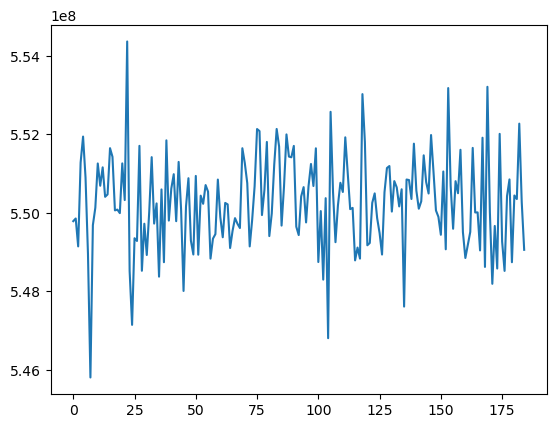

In [8]:


def countData(data_array, plot = False):
    """
    Generates the counts from the given data by summing over the array elements. Returns 2d array of the same dimension as the
    input images.
    
    Arguments:
    
    data_array (numpy.ndarray): Numpy data array containing the diffraction images.
    plot (bool, optional): If set to true, generates a graph of the counts data.
    
    Returns:
    counts (numpy.ndarray): One dimensional numpy array containing the data after summing over each array element.
    
    Example:
    
    data = np.array([[[1, 2, 3], [4, 5, 6]], [[7, 8, 9], [10, 11, 12]]])
    >>>countData(data)
        array([21, 51])
    """
    counts = np.sum(data_array, axis = (1,2))
    if len(data_array) == 0:
        raise ValueError("Input data_array is empty.")
    if data_array.ndim != 3:
        raise ValueError("Input data_array is not 3 dimensional.")
    if plot == True:
        plt.plot(np.arange(len(data_array[:, 0, 0])), counts)
        plt.show()
    return counts
    
counts = countData(data_array, plot = True)

## Lauren's Version

In [11]:
def get_data(file_path, shape = False, file_names = False):
    """
    Generates an array of images of TIFF files.
    
    Arguments:
    
    file_path (string) = Path containing the UED TIFF files. Path can be for a singular image or for a folder containing
                        many files. See examples below for example using //*// format style.
    shape (bool, optional) = Boolean expression. If set to True, function returns the shape of the image data array.
    file_names (bool, optional) = Boolean Expression. If set to true, function returns the list of file names.
    
    Returns: data_array, shape (if True), file_names (if True)
    
    numpy array or tuple: 
            If shape = False, file_names = False: Returns numpy array containing data from tiff files as a n x shape x shape (shape refers to the
                                dimensions of the TIFF file, typically 1024 x 1024).
            If shape = True: returns tuple. First element is a numpy array containing data from tiff files as a n x shape x shape
                                (shape refers to the dimensions of the TIFF file, typically 1024 x 1024). Second element is the dimensions
                                of the data array as a tuple.
            If file_names = True: returns tuple containing data array and list with file names.
            
    
    Examples:
    
    file_path = "Desktop/Folder/Data_Analysis/20034291//*//*//ANDOR1_*.tif"
    
    >>>fileReading(file_path)
        [[data1], ..., [dataN]]
    
    >>>fileReading(file_path)
        [[data1], ..., [dataN]], (220, 1024, 1024)
    
    Notes:
        - All images must be of same dimension. If images of different shapes needed, either group them by shape and run this function for
            each file shape or create it manually by reading files into a numpy array with dtype = object. Be careful as this can lead to 
            later problems
        - Review "*" notation to read in all files of a singular type. Expedites the process.
    
    """
    files = glob.glob(file_path) #read in file name
    if not files:
        FileNotFoundError(f"file_path input does not contain any TIFF files: {file_path}")
    data_array = tf.imread(files) # construct array containing files
    if shape and file_names:
        return data_array, data_array.shape, files
    elif shape:
        return data_array, data_array.shape
    elif file_names:
        return data_array, files
    else:
        return data_array
    
def stagePosition(file_names, idx_start, idx_end, unique_positions = False ):
    """
    Finds the stage position in the string for every file name in the list of all TIFF files. Requires the user to find the
    index of the first digit and last digit of a single file and assumes all files are formatted identically. It uses these indices
    to retrieve the digits from the file names and stores them in a list. All files must have the exact same number of characters before
    the stage position in the name of the file. If this is an issue, group the file names by preceding characters and run this function
    on each list of files.
    
    If unique_positions = False, it returns the stage positions as a numpy array. If unique_positions = True, it returns a tuple
                        containing an array of the stage positions, an array of the unique stage positions, and an array containing
                        the indices of the unique stage positions in the original array.
    Arguments: 
    
    file_names (list containing strings): List of file names
    idxStart (int): the index of the first digit of the stage position in the file name
    idxEnd (int): the index of the last digit of the stage position in the file name
    unique_positions
    
    Returns: stage_pos, uniq_stage (optional), uniq_stage_idx (optional)
    
    stage_pos (array): Default. A numpy array containing the stage positions of the file. The index of each stage position corresponds to
                            the index of the file name in file_names.
    uniq_stage (array): Optional. A numpy array containing the unique stage positions listed in ascending order.
    uniq_stage_idx (array): Optional. A numpy array containing the indices of the unique stage positions in the original input array.
    
    Examples:
    
    file_names = ['image001_10.tif', 'image002_20.tif', 'image004_40.tif', 'image003_30.tif', 'image004_40.tif']
    >>> stagePosition(file_names, 9, 11)
        [10. 20. 40. 30. 40.]
    
    >>> stagePosition(file_names, 9, 11, unique_positions = True)
        (array([10., 20., 40., 30., 40.]), array([10., 20., 30., 40.]), array([0, 1, 3, 2]))

    """
    try:
        try:
            stage_pos = [np.float64(file_name[idx_start:idx_end]) for file_name in file_names]
            stage_pos = np.array(stage_pos)
            if unique_positions == True:
                uniq_stage, uniq_stage_idx = np.unique(stage_pos, return_index = True)
                return stage_pos, uniq_stage, uniq_stage_idx
            else:
                return stage_pos
            return stagePos
        except ValueError:
            raise ValueError("""Failed to convert a file name to a float. Make sure that index positions are correct for all files in file_names.""")
    except IndexError:
        raise ValueError("Invalid index values. Make sure the index values are within the range of the file name strings.")

def get_counts(data_array, plot = False):
    """
    Generates the counts from the given data by summing over the array elements. Returns 2d array of the same dimension as the
    input images.
    
    Arguments:
    
    data_array (numpy.ndarray): Numpy data array containing the diffraction images.
    plot (bool, optional): If set to true, generates a graph of the counts data.
    
    Returns:
    counts (numpy.ndarray): One dimensional numpy array containing the data after summing over each array element.
    
    Example:
    
    data = np.array([[[1, 2, 3], [4, 5, 6]], [[7, 8, 9], [10, 11, 12]]])
    >>>countData(data)
        array([21, 51])
    """
    counts = np.sum(data_array, axis = (1,2))
    if len(data_array) == 0:
        raise ValueError("Input data_array is empty.")
    if data_array.ndim != 3:
        raise ValueError("Input data_array is not 3 dimensional.")
    if plot == True:
        plt.plot(np.arange(len(data_array[:, 0, 0])), counts)
        plt.show()
    return counts

def get_image_details(file_names):
    """
    Returns the time at which each image was saved in order to track any drifts/changes that occur with respect to 
    lab time.
    
    Arguments: 
    data_array (numpy.ndarray): Numpy data array containing the diffraction images.
    file_names = ['image001_10.tif', 'image002_20.tif', 'image004_40.tif', 'image003_30.tif', 'image004_40.tif']
    
    Returns:
    data_array (ndarray): Array of N x 1024 x 1024 where N is the length of tile file_names list. Generated by using tifffile as tf.
    stage_pos (array): Default. A numpy array containing the stage positions of the file. The index of each stage position corresponds to
                            the index of the file name in file_names.
    file_order (array): Returns the image number located in the file name. Reflects the order with which the images are taken. 
    counts(ndarray): One dimensional numpy array of length N containing the data after summing over each array element.

    """
    data_array = tf.imread(file_names) # construct array containing files
    try:
        stage_pos = []
        file_order = []
        try:
            #stage_pos = [np.float64(file_name[idx_start:idx_end]) for file_name in file_names]
            #stage_pos = np.array(stage_pos)
            for file in file_names:
                string = list(map(str, file.split("\\")))
                string = list(map(str, string[-1].split("-")))
                file_order.append(int(string[1]))
                string = list(map(str, string[-1].split("_")))
                stage_pos.append(float(string[0]))
        except ValueError:
            raise ValueError("""Failed to convert a file name to a float. Make sure that index positions are correct for all files in file_names.""")
    except IndexError:
        raise ValueError("Invalid index values. Make sure the index values are within the range of the file name strings.")
    
    stage_pos = np.array(stage_pos)
    file_order = np.array(file_order)
    
    counts = get_counts(data_array)
    
    return data_array, stage_pos, file_order, counts 

In [12]:
dataPath = "D:\\UED_Data\\20180823_0320\\Run"
runPath = "\\*\\*\\ANDOR1_*.tif"
newPath = dataPath + runPath
print(newPath)


files = glob.glob(newPath) 
print(len(files))

D:\UED_Data\20180823_0320\Run\*\*\ANDOR1_*.tif
1998


Load a image to check the signal level: D:\UED_Data\20180823_0320\Run\scan001\images-ANDOR1\ANDOR1_Delay-007-108.8200_0001.tif
Total number of images in the chosen directory is 1998


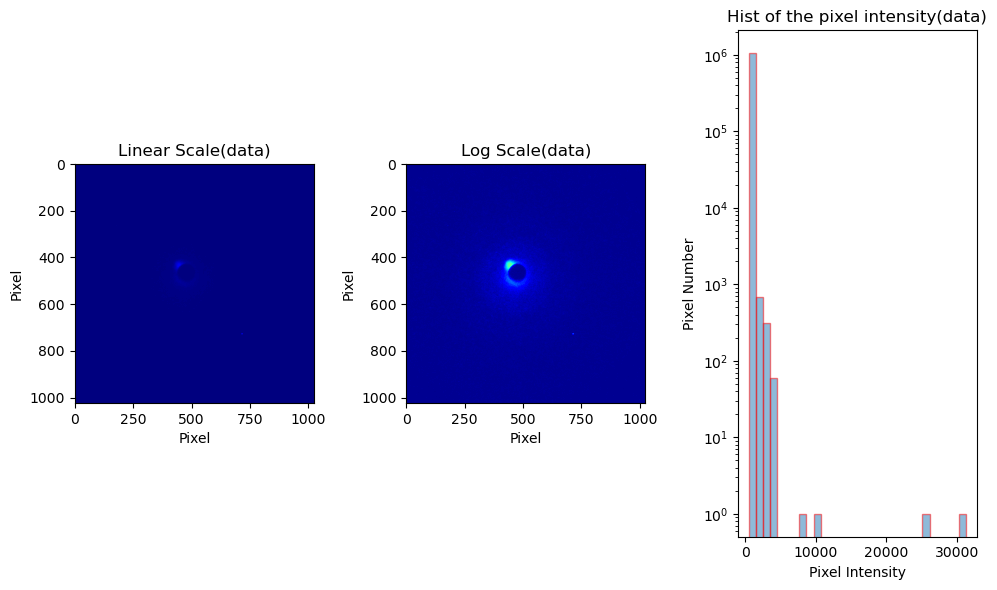

In [13]:
test=tf.imread(files[0]);
bkg_sign='no'
print('Load a image to check the signal level: '+files[0]);
print('Total number of images in the chosen directory is ' + str(len(files)));

if bkg_sign == 'Yes':
    test_bkg_path = bkgpath + '/scan001/images-ANDOR1';
    test_bkg_file = test_bkg_path + '/' +os.listdir(test_bkg_path)[0];
    test_bkg = tiff.imread(test_bkg_file);
    print('Load a bkg image to check the signal level: '+test_bkg_file);

# Plot a testing figure and check the intensity
plt.figure(figsize=(10,6))

if bkg_sign == 'Yes': # Plot both the data and the background images
    plt.subplot(2,3,1);
    plt.imshow(test,cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Linear Scale(data)')
    
    plt.subplot(2,3,2);
    plt.imshow(np.log(test),cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Log Scale(data)')
    
    plt.subplot(2,3,3);
    plt.hist(test.reshape(-1),bins=30,edgecolor="r",histtype="bar",alpha=0.5)
    plt.xlabel('Pixel Intensity');
    plt.ylabel('Pixel Number');
    plt.title('Hist of the pixel intensity(data)');
    plt.yscale('log')
    
    plt.subplot(2,3,4);
    plt.imshow(test_bkg,cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Linear Scale(bkg)')
    
    plt.subplot(2,3,5);
    plt.imshow(np.log(test_bkg),cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Log Scale(bkg)')
    
    plt.subplot(2,3,6);
    plt.hist(test_bkg.reshape(-1),bins=30,edgecolor="r",histtype="bar",alpha=0.5)
    plt.xlabel('Pixel Intensity');
    plt.ylabel('Pixel Number');
    plt.title('Hist of the pixel intensity(bkg)');
    plt.yscale('log')
    
else:
    plt.subplot(1,3,1);
    plt.imshow(test,cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Linear Scale(data)')
    
    plt.subplot(1,3,2);
    plt.imshow(np.log(test),cmap='jet');
    plt.xlabel('Pixel');
    plt.ylabel('Pixel');
    plt.title('Log Scale(data)')
    
    plt.subplot(1,3,3);
    plt.hist(test.reshape(-1),bins=30,edgecolor="r",histtype="bar",alpha=0.5)
    plt.xlabel('Pixel Intensity');
    plt.ylabel('Pixel Number');
    plt.title('Hist of the pixel intensity(data)');
    plt.yscale('log')
plt.tight_layout()
plt.show()

In [23]:
%%time

highvalue = 50000 # The highest value of pixel intensity from the histogram plot
posi_0    = 108.62 # The reference T0
print('Load diffraction signal');
test_data, stage_positions, file_numbers, counts = get_image_details(files[0:100])
counts_mean = np.mean(counts)        # Mean values of Total Counts of all images
counts_std  = np.std(counts)         # the STD of all the tc for all the iamges
uni_stage = np.unique(stage_positions)# Pump-probe stage position

print('Image number read: ', len(counts))
print('Stage positions: ', len(uni_stage))

# Load or not load the bkg signal
if bkg_sign == 'Yes':
    print('Load background signal');
    data_bkg, actime_bkg, posi_bkg, tc_bkg, order_bkg = read_all_data(bkgpath,highvalue) # Load bkg images
    bkg_dlys_ave = np.nanmean(data_bkg,axis=0) # averaging all the images to optain one image

Load diffraction signal
Image number read:  100
Stage positions:  37
CPU times: total: 250 ms
Wall time: 4.41 s


## Removing Errant X-Ray Values- THIS LOOKS DANGEROUS

Here, we utilize a masked array to create nan values for each entry outside of the standard deviation threshold. In this way, we eliminate the need for inputting NaN values, as these are stored as a Boolean. We can then apply normal NumPy operations to it without getting an error.

In [30]:
# #Set a value for the standard deviation
# num_std = 3
# mean_array = np.mean(data_array, axis = 0)


# def mask_data_outside_std(data_array, mean_array, num_std):

#     std_array = np.std(data_array)

#     lower_bound = mean_array - num_std * std_array
#     upper_bound = mean_array + num_std * std_array
#     mask = np.logical_or(data_array < lower_bound, data_array > upper_bound)

#     # Apply the mask to the data array
#     masked_data = np.ma.masked_array(data_array, mask=mask)

#     return masked_data

# masked_data = mask_data_outside_std(data_array, mean_array, num_std)


def cleanMean(data_array, std = 3, return_clean_data = True):
    """
    Takes in a data array and calculate the mean and standard deviation at each index across all images. Then applies a filter
    to the data that masks all values (replaces outliers with nan's) outside a given number of standard deviations. After, the 
    mean is taken, returning a 2 dimensional array with the mean data of non-outlier entries across all images.
    
    If return_clean_data is set to True, the cleaned data is returned as a 3d array without having the mean taken.
    
    Arguments:
    
    data_array (numpy.ndarray): Data array containing diffraction image data.
    std (int or float): Number of standard deviations from the mean allowed. Values outside this number of standard deviations
                        are masked as nan's. Set to 3 by default.
                        
    Returns:
    
    clean_mean_data (numpy.ndarray): Default. Returns a 2 dimensional array containing the mean values of the cleaned data.
    clean_data (numpy.ndarray): Other option. Returns the raw 3 dimensional array containing the cleaned data.
    
    Examples:
    
    example_array = np.array([[[8.,2],[1,2]], [[1.,2],[1,2]], [[1.,2],[1,2]], [[1., 2], [1,2]]])
    
    >>> cleanMean(example_array, std=1)
        np.array([[1.,2],[1.,2]])
    
    >>> cleanMean(example_array, std=1, return_clean_data = True)
        np.array([[[np.nan, 2],[1,2]], [[1.,2],[1,2]], [[1.,2],[1,2]], [[1.,2],[1,2]]])
    """
    if len(data_array) == 0:
        raise ValueError("Input data array is empty.")
    if data_array.ndim != 3:
        raise ValueError("Input data array is not 3 dimensional.")
    if std <= 0:
        raise ValueError("Number of standard deviations (std) must be non-negative.")
    if not isinstance(return_clean_data, bool):
        raise TypeError("return_clean_data must be a boolean value.")
   
    mean = np.mean(data_array, axis = 0)
    stDev = np.std(data_array, axis = 0)
    upper_threshold = mean + std*stDev
    #lower_threshold = mean - std*stDev
    clean_data = ma.masked_greater_equal(data_array, upper_threshold)
    #clean_data = ma.masked_outside(data_array, lower_threshold, upper_threshold)
    pct_rmv = []
    for i in range(len(clean_data)):
        no_rmv = sum(sum(clean_data[i].mask))
        pct_rmv.append(no_rmv/(1024*1024) * 100)

    pct_rmv = np.array(pct_rmv)
    plt.figure()
    plt.plot(pct_rmv)
    plt.title("Percent Pixels Removed")
    plt.xlabel("Image Number")
    plt.ylabel("Percent")
    plt.show()

    if return_clean_data == True:
        return clean_data
    else:
        clean_mean_data = np.mean(clean_data, axis = (0))
        return clean_mean_data


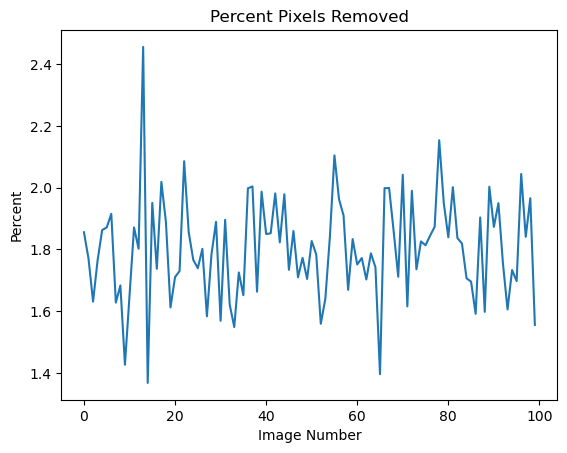

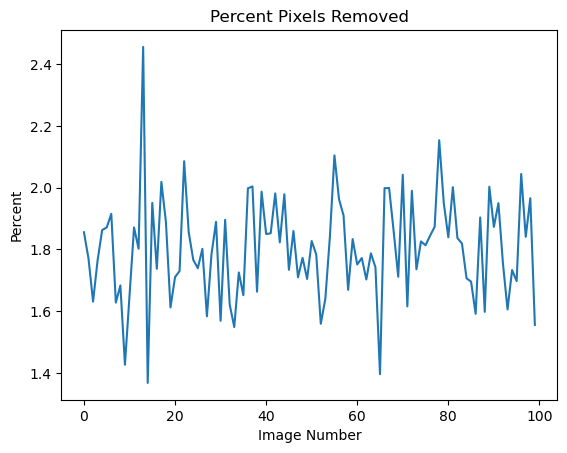

CPU times: total: 5.06 s
Wall time: 12.5 s


In [32]:
%%time
data_array = test_data
clean_data = cleanMean(data_array)
#clean_mean_data = cleanMean(data_array)

## Unique Values and Removing Background

In [29]:


def medianFilter(data_array, center_top_left_corner, center_border_length, med_filter_range = 3):
    """
    Takes in a data array and applies scipy.signal's median filter. Then replaces the boundary and center values with the
    original values from the input array as to not lose precision in these parts. 
    
    Arguments:
    
    data_array (np.array): 2d Numpy array containing diffraction image data.
    center_top_left_corner (tuple): Tuple containing the row index (integer) and column index (integer) of the top left corner
                                    (lowest_index_row, lowest_index_column)
    center_border_length (int): Length of one side of the square. Must be an integer.
    med_filter_range (int): Must be odd. Initially set to 3. Shape of the square array for median filtering. Using an odd values makes it so that the 
                            median filter is centered around the individual point.
    
    Returns:
    
    med_filt_data (2d-array): Array containing the median filtered data.
            
    """
    if not isinstance(data_array, np.ndarray):
        raise ValueError("Input data_array must be a numpy array.")
    if not isinstance(center_top_left_corner, tuple) or len(center_top_left_corner) != 2:
        raise ValueError("Center top left corner must be a tuple of length 2 that contains two integers.")
    if not isinstance(center_border_length, int):
        raise ValueError("center_border_length must be an integer.")
    #if not isinstance(center_top_left_corner[0] + center_border_length < data_array[0,-1]  
    if not (0 <= center_top_left_corner[0] < data_array.shape[0] and
        0 <= center_top_left_corner[1] < data_array.shape[1] and
        center_top_left_corner[0] + center_border_length <= data_array.shape[0] and
        center_top_left_corner[1] + center_border_length <= data_array.shape[1]):
        raise ValueError("""center_top_left_corner is out of bounds or adding center_border_length goes beyond the array.
                     Check that the tuple values are positive integers within the bounds of the data array and that 
                     adding the border length does not result in a value beyond the size of the array.""")
    if not isinstance(med_filter_range, int) and med_filter_range % 2 == 1:
        raise ValueError("med_filter_range must be an odd integer.")

    med_filt_data = ss.medfilt2d(data_array, med_filter_range)
    med_filt_data[0:med_filter_range//2,:] = data_array[0:med_filter_range//2,:]
    med_filt_data[-(med_filter_range//2):0,:] = data_array[-(med_filter_range//2):0,:]
    med_filt_data[:,0:med_filter_range//2] = data_array[:,0:med_filter_range//2]
    med_filt_data[:,-(med_filter_range//2):] = data_array[:,-(med_filter_range//2):]
    row_s, col_s = center_top_left_corner
    row_e, col_e = row_s+center_border_length, col_s+center_border_length
    med_filt_data[row_s:row_e,col_s:col_e] = data_array[row_s:row_e,col_s:col_e]
    return med_filt_data

med_filt_data = medianFilter(clean_mean_data, (425,425), 100)

In [33]:
med_filt_data = []
for data in clean_data:
    filt_data = medianFilter(data, (425, 425), 100)
    med_filt_data.append(np.array(filt_data))

### Check this method here, could be faster if need be

In [11]:
# #Possible method for noise, far more efficient but less accurate
# cornerMean = (np.mean(medFiltData[0:20,0:20])+np.mean(medFiltData[-20:-1,0:20])+np.mean(medFiltData[0:20,-20:-1])+np.mean(medFiltData[-20:-1,-20:-1]))/4
# noiseArray1 = cornerMean * np.ones(1024)

In [12]:
def backgroundNoise(data_array, bkg_range = 20, remove_noise = False):
    """
    Takes in a 2d data array (using the mean array is recommended) and calculatees the means of the corners. Linearly interpolates values across 2d array to generate
    of background noise values using pandas.DataFrame.interpolate. Returns a two dimensional numpy array with the linearly interpolated
    background noise.

    Arguments:

    data_array (2d np.ndarray): Data array used to generate the corner values of the background noise.
    bkg_range (int): Side length of square in each corner used for generating mean value. Initially set to 20.
    remove_noise (Bool): If set to true, generated background values are subtracted from the initial input array. Returns cleaned data.
    
    Returns:
    
    bkg_data (2d np.ndarray): Data array containing the linearly interpolated background noise for the image. If remove_noise = True,
                                returned data has background noise removed from original input.
    """
    if not isinstance(data_array, np.ndarray):
        raise ValueError("Input data_array must be a numpy array.")
    if not isinstance(bkg_range, int) and bkg_range > 0:
        raise ValueError("bkg_range must be an integer > 0.")
    if not isinstance(remove_noise, bool):
        raise ValueError("remove_noise must be a boolean.")
    if not (2 * bkg_range < len(data_array[0,:]) and
            2 * bkg_range < len(data_array[:,0])):
        raise ValueError("2 * bkg-range must be less than both the number of rows and the number of columns.")

    empty_array = np.empty(np.shape(data_array))
    empty_array = (ma.masked_array(empty_array, mask = True))
    empty_array[0,0] = np.mean(data_array[0:20,0:20])
    empty_array[-1,0] = np.mean(data_array[-20:,0:20])
    empty_array[0,-1] = np.mean(data_array[0:20,-20:])
    empty_array[-1,-1] = np.mean(data_array[-20:,-20:])
    empty_array = pd.DataFrame(empty_array).interpolate(axis = 0)
    empty_array = pd.DataFrame(empty_array).interpolate(axis = 1)
    bkg_data = pd.DataFrame.to_numpy(empty_array)
    if remove_noise == True:
        return data_array - bkg_data
    else:
        return bkg_data

noise_data = backgroundNoise(med_filt_data)
noiseless_data = backgroundNoise(med_filt_data, remove_noise = True)

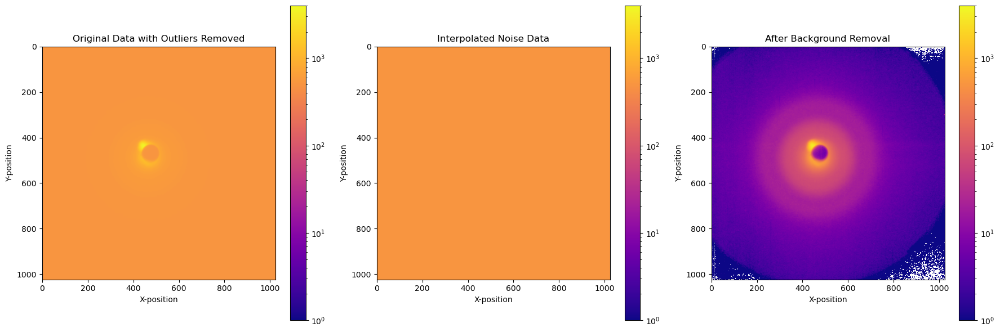

In [ ]:


fig, axes = plt.subplots(1, 3, figsize=(18, 6))
vmin_1_1, vmax_1_1 = 10**-0, 4000 

#Before
img1 = axes[0].imshow(med_filt_data, cmap='plasma', norm=matplotlib.colors.LogNorm(vmin=vmin_1_1, vmax=vmax_1_1))
axes[0].set_title('Original Data with Outliers Removed')
axes[0].set_xlabel('X-position')
axes[0].set_ylabel('Y-position')
colorbar1 = fig.colorbar(img1, ax=axes[0])  # Add colorbar to the first subplot

#Noise
img2 = axes[1].imshow(noise_data, cmap='plasma',  norm=matplotlib.colors.LogNorm(vmin=vmin_1_1, vmax=vmax_1_1))  # Use the same normalization as img1
axes[1].set_title('Interpolated Noise Data')
axes[1].set_xlabel('X-position')
axes[1].set_ylabel('Y-position')
colorbar2 = fig.colorbar(img2, ax=axes[1])  # Add colorbar to the second subplot

# Noise Removed
img4 = axes[2].imshow(noiseless_data, cmap='plasma',  norm=matplotlib.colors.LogNorm(vmin=vmin_1_1, vmax=vmax_1_1))  # Logarithmic scaling
axes[2].set_title('After Background Removal')
axes[2].set_xlabel('X-position')
axes[2].set_ylabel('Y-position')
colorbar4 = fig.colorbar(img4, ax=axes[2])  # Add colorbar to the third subplot



# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


## Detector Mask

Pretty proud of this one, it looks very clean.

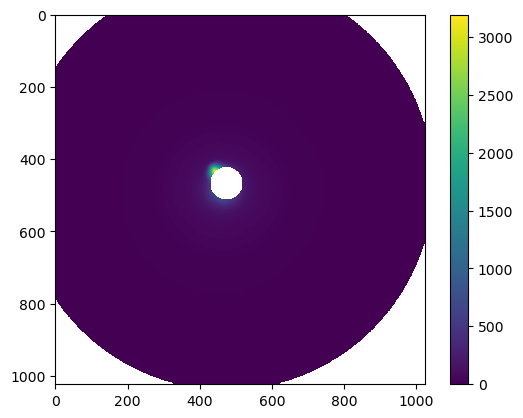

In [16]:
def detectorMask(data_array, hole_center, inner_radius, outer_radius, plot_image = False):
    """
    Takes in a 2d data array and applies a circular (donut shaped) detector mask to it, replacing the masked values with np.nan's.
    Returns the masked, 2d data array.

    Arguments:
    
    data_array (2d np.ndarray): 2d data array to be masked.
    hole_center (tuple): Tuple containing the x and y coordinates of the center of the image, each one of which an int.
    inner_radius (float): Inner radius. Values within the radius of this drawn from the center are masked.
    outer_radius (float): Outer radius of the donut. Values outside the radius of this drawn from the center are masked.
    plot_image (bool, optional): If True, plots the masked image. Default is False.

    Returns:
    ring_data (2d np.ndarray): Data array with the circular detector mask applied.
    """
    if not isinstance(data_array, np.ndarray) or data_array.ndim != 2:
        raise ValueError("data_array must be a 2D numpy array.")
    if not isinstance(hole_center, tuple) or len(hole_center) != 2:
        raise ValueError("hole_center must be a tuple of length 2 containing the x and y coordinates of the hole center.")
    if not (isinstance(inner_radius, (int, float)) and inner_radius > 0):
        raise ValueError("inner_radius must be a positive float or integer.")
    if not (isinstance(outer_radius, (int, float)) and outer_radius > 0):
        raise ValueError("outer_radius must be a positive float or integer.")
    if inner_radius >= outer_radius:
        raise ValueError("inner_radius must be smaller than outer_radius.")


    hole_cx, hole_cy = hole_center
    x_idx, y_idx = np.meshgrid(np.arange(data_array.shape[1]), np.arange(data_array.shape[0]))
    dist = np.sqrt(((x_idx - hole_cx)**2 + (y_idx-hole_cy)**2))
    mask = np.logical_and(dist<=outer_radius, dist>= inner_radius)
    ring_data = np.where(mask, data_array, np.nan)
    if plot_image == True:
        img3 = plt.imshow(ring_data)
        plt.colorbar(img3)
    return(ring_data)

ring_mask_data = detectorMask(noiseless_data, (474,468), 42, 575, plot_image = True)

## Find Centers Start

This one is gonna be tough

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from timeit import default_timer as timer
from PIL import Image
from skimage.filters import threshold_otsu
from skimage.morphology import closing, square
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops_table
from skimage import util
import cv2

### Laplace Gaussian

<class 'numpy.ndarray'>
[[[437.5 433.5  40.5]
  [440.5 392.5  10.3]
  [485.5 459.5  47.2]
  [357.5 444.5  49.2]
  [478.5 410.5  23. ]
  [405.5 494.5  43.6]
  [471.5 361.5  45.9]
  [463.5 499.5  49.4]
  [419.5 356.5  48.3]
  [372.5 403.5  39.7]
  [397.5 444.5   5.5]]]


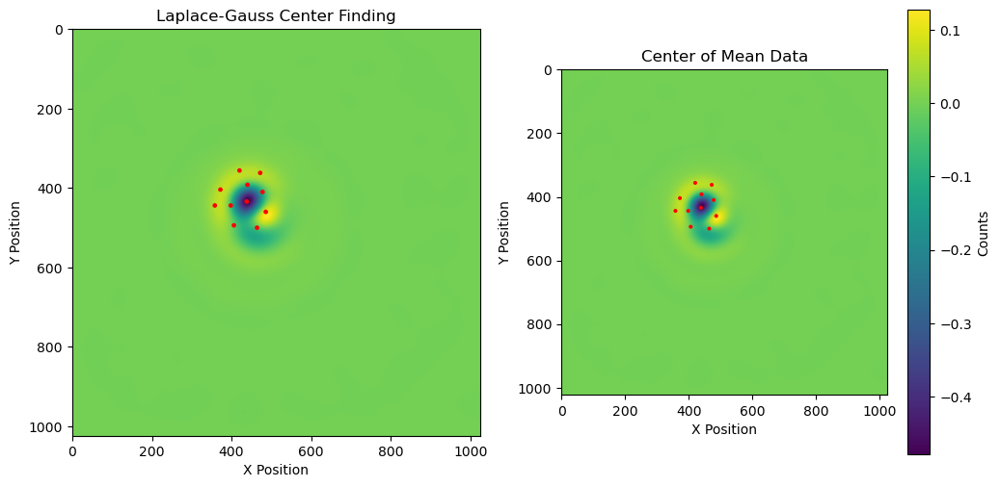

1.48374605178833


In [70]:
import scipy.ndimage
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt

LaplaceGauss = scipy.ndimage.gaussian_laplace(mean_tester[18], 33)
print(type(LaplaceGauss))
sigma = 3
threshold_min = 1000
threshold_max = 3000
radius_min = 50
radius_max = 150
radius_step = 1
num_of_peaks = 10

t0 = time.time()
LaplaceGauss.astype(np.uint8)
normalized_image = cv2.normalize(LaplaceGauss, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=40, param1=30, param2=5, minRadius=5, maxRadius=50)
print(circles)
#print(np.mean(circles, axis = 1))
if circles is not None:
    circles = np.round(circles[0, :]).astype(int)

    # Create subplots with titles and axis labels
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot the 2nd image (LaplaceGauss) with detected circles
    ax = axes[0]
    ax.imshow(LaplaceGauss)
    ax.set_title('Laplace-Gauss Center Finding')
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    for (x, y, r) in circles:
        ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))

    
    # Plot the 3rd image (cleanerData) with detected circles
    ax = axes[1]
    im = ax.imshow(LaplaceGauss)
    ax.set_title('Center of Mean Data')
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    plt.colorbar(im, ax=ax, label='Counts')
    for (x, y, r) in circles:
        ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))


# Display the subplots
plt.show()

print(time.time() - t0)


[[[442.5 433.5  28.8]
  [422.5 416.5  47.7]
  [399.5 397.5  77.4]
  [524.5 520.5  98. ]
  [427.5 449.5  11.1]
  [455.5 417.5   8.8]
  [481.5 482.5  40.8]
  [466.5 467.5  20.1]
  [366.5 357.5  78.8]]]


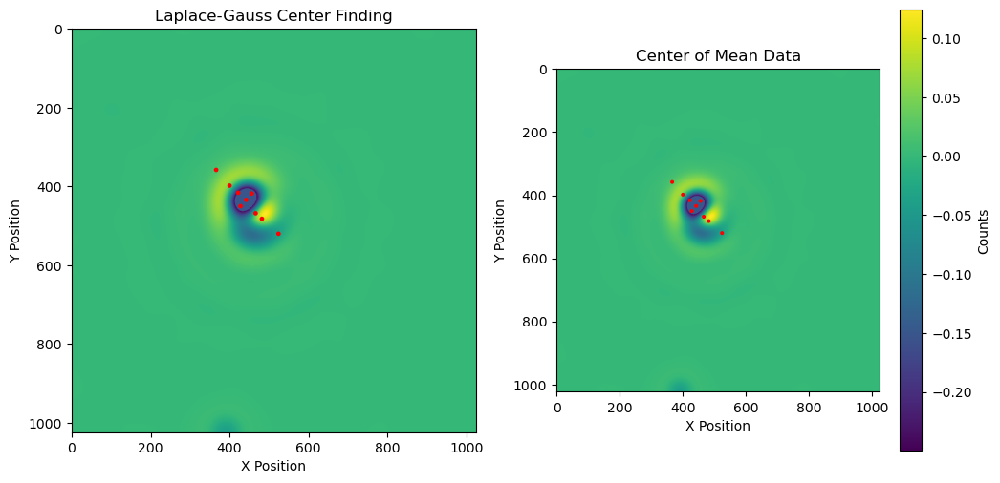

0.7950007915496826
[[[445.5 436.5  32.9]
  [428.5 423.5  37.8]
  [397.5 389.5  83.9]
  [429.5 448.5  13. ]
  [451.5 416.5  10.2]
  [476.5 471.5  30.4]
  [408.5 407.5  14.7]]]


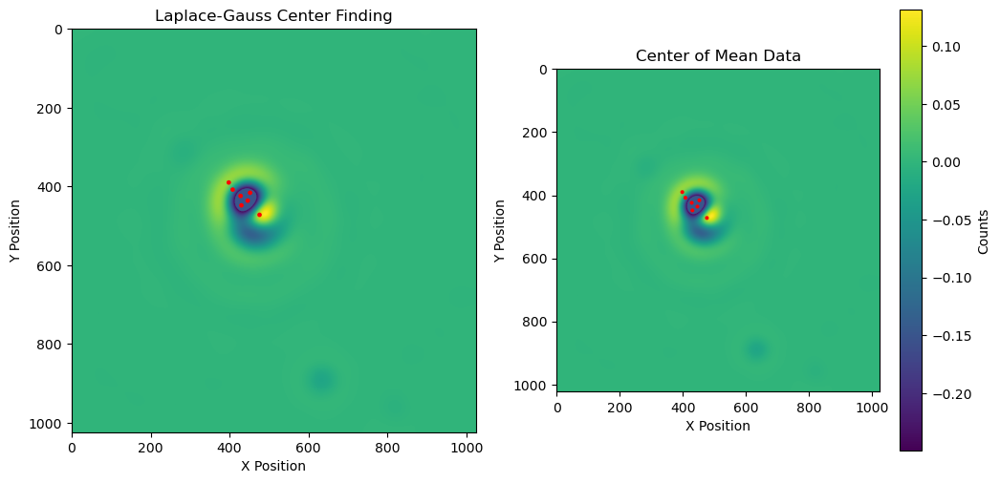

0.5191390514373779
[[[442.5 433.5  28.8]
  [390.5 382.5  93.9]
  [481.5 470.5  33.5]
  [354.5 346.5  95.1]
  [427.5 449.5  10.2]
  [463.5 460.5  13.2]
  [414.5 399.5  16. ]
  [451.5 415.5   9.4]
  [422.5 428.5   8.2]]]


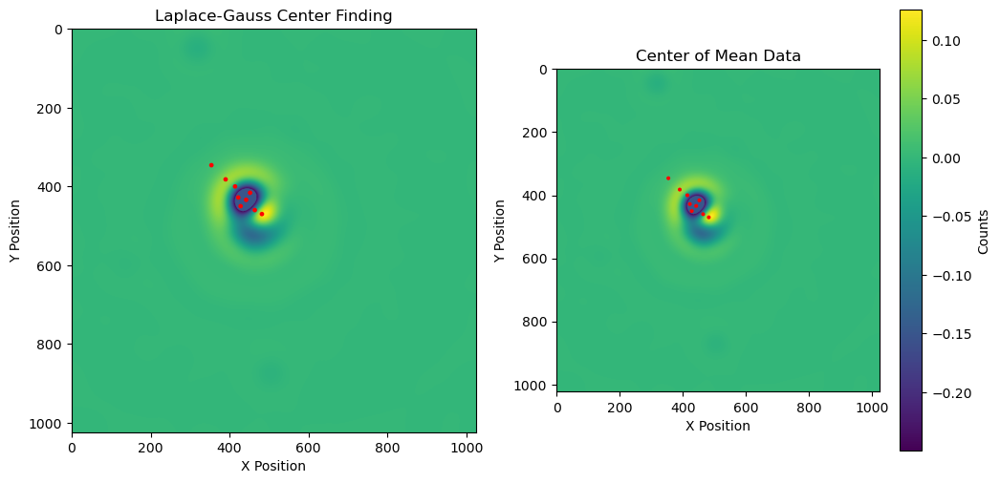

0.5092997550964355
[[[443.5 434.5  30. ]
  [423.5 420.5  43.6]
  [357.5 348.5  91.6]
  [532.5 341.5  99.4]
  [427.5 449.5  11.1]
  [372.5 363.5  71.1]
  [389.5 378.5  48.5]
  [403.5 394.5  26.6]
  [466.5 460.5  15.8]
  [456.5 417.5   9.1]]]


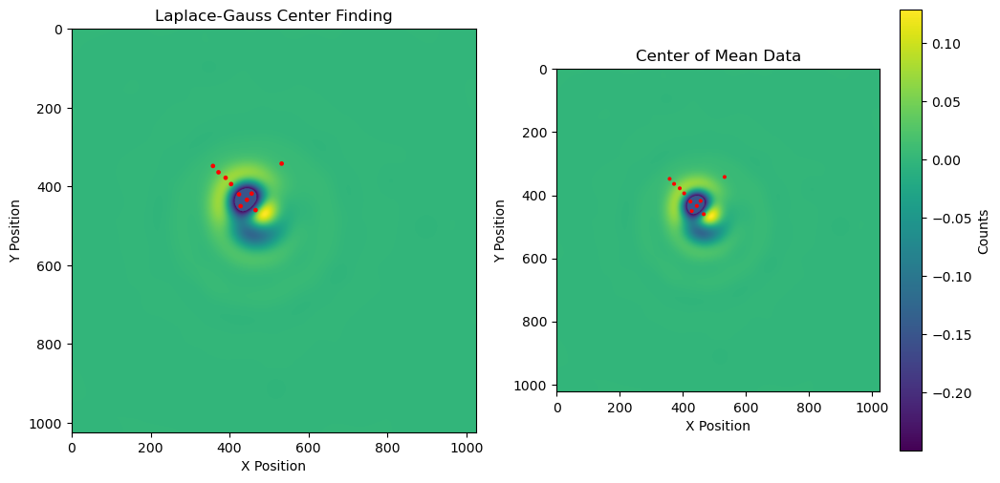

0.5324721336364746
[[[443.5 434.5  29.6]
  [350.5 526.5  99.4]
  [429.5 451.5   9.4]
  [532.5 341.5  99.4]
  [353.5 343.5  98. ]
  [476.5 466.5  26.4]
  [451.5 415.5   9.4]
  [424.5 425.5   9.1]
  [399.5 385.5  36.3]
  [485.5 386.5  35. ]
  [406.5 408.5  15.6]]]


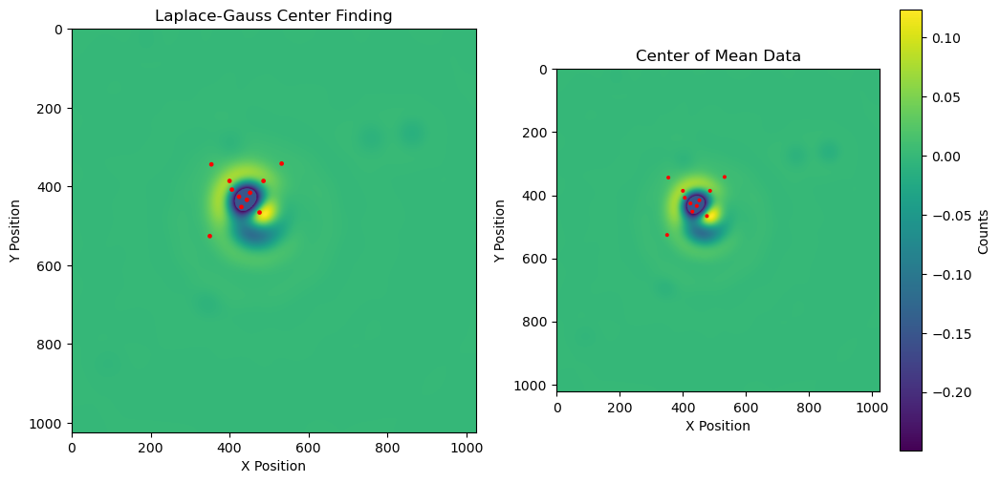

0.4849050045013428
[[[444.5 436.5  32.2]
  [427.5 423.5  39.1]
  [532.5 341.5  99.4]
  [427.5 449.5  11.1]
  [456.5 419.5   9.6]
  [356.5 348.5  92.2]
  [390.5 384.5  43.6]
  [479.5 466.5  28. ]
  [404.5 403.5  20.2]
  [463.5 450.5   5.9]]]


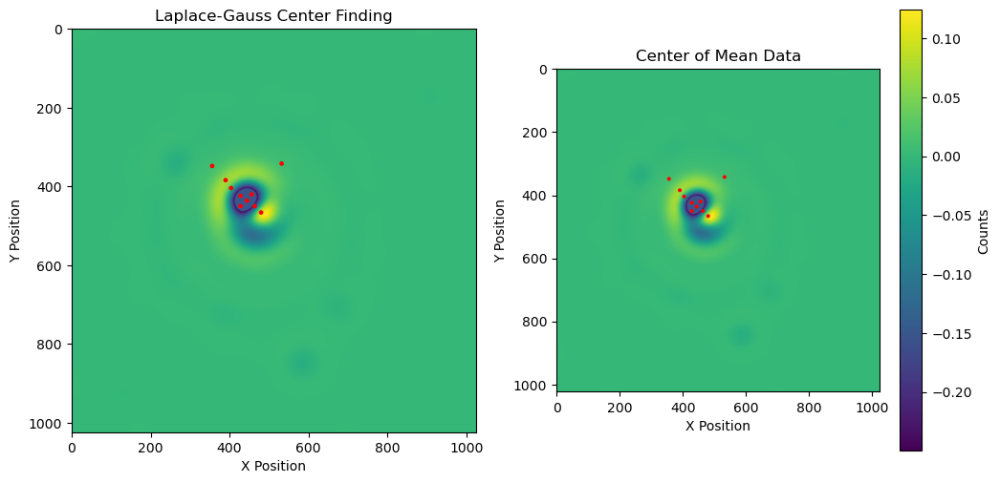

0.5001108646392822
[[[446.5 426.5  21.6]
  [402.5 391.5  79.6]
  [431.5 444.5  16.6]
  [350.5 526.5  99.4]
  [532.5 341.5  99.4]
  [375.5 501.5  64.1]
  [485.5 492.5  51.1]
  [470.5 464.5  22.1]
  [485.5 386.5  34.9]
  [425.5 417.5   6. ]
  [451.5 447.5   6. ]]]


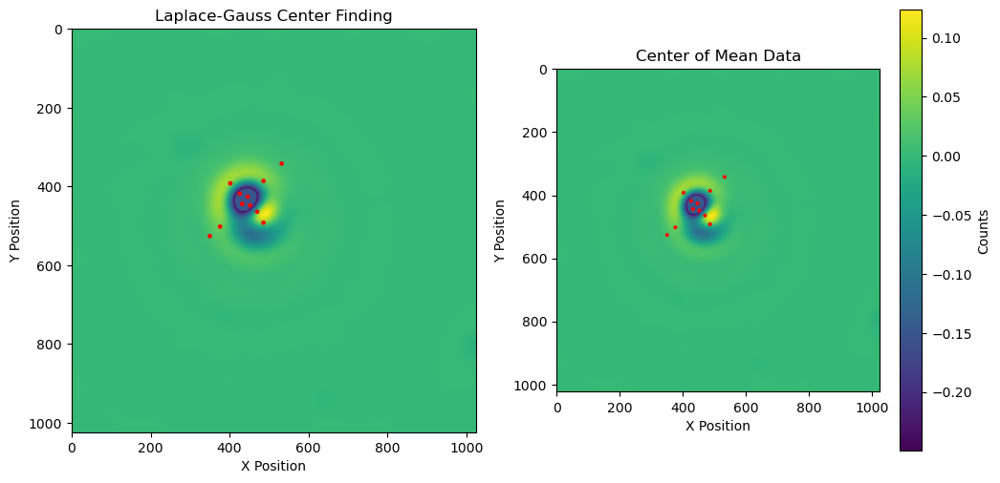

0.49482202529907227
[[[445.5 436.5  32.9]
  [426.5 422.5  40.2]
  [353.5 343.5  98. ]
  [427.5 449.5  11.1]
  [480.5 481.5  40. ]
  [532.5 341.5  99.4]
  [454.5 418.5  11.1]
  [399.5 385.5  36.3]
  [404.5 408.5  16.9]
  [466.5 453.5  10.2]]]


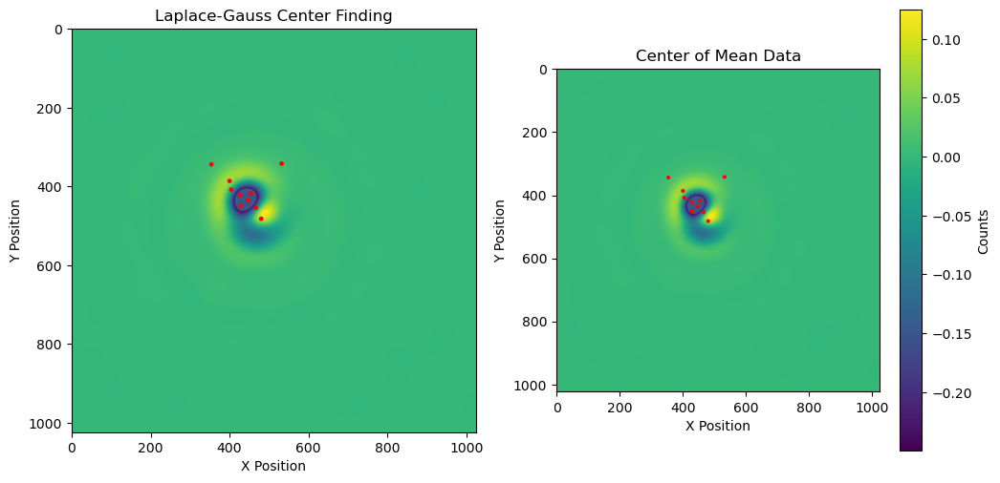

0.5223879814147949
[[[443.5 434.5  29.9]
  [424.5 419.5  44.2]
  [351.5 525.5  97.3]
  [427.5 447.5  12.2]
  [532.5 341.5  99.4]
  [479.5 482.5  40.2]
  [409.5 392.5  24.4]
  [356.5 348.5  93.1]
  [471.5 461.5  19.9]
  [456.5 417.5   9.1]]]


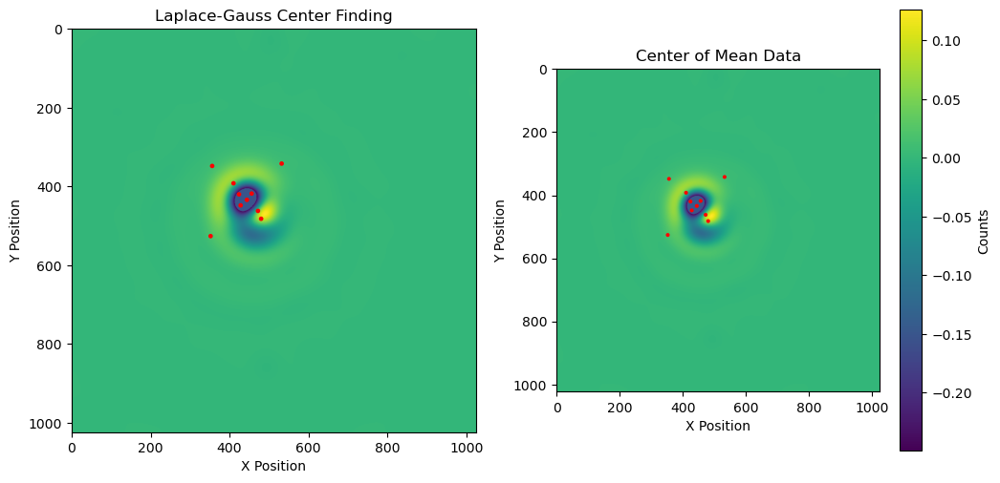

0.6039590835571289
[[[444.5 436.5  32.2]
  [427.5 423.5  39.3]
  [402.5 394.5  77.5]
  [530.5 342.5  97.3]
  [350.5 527.5  99.4]
  [512.5 360.5  71.9]
  [426.5 445.5  12.4]
  [385.5 383.5  47.1]
  [476.5 466.5  26.3]
  [447.5 416.5  11.6]
  [456.5 463.5  10.3]
  [421.5 403.5   8.4]]]


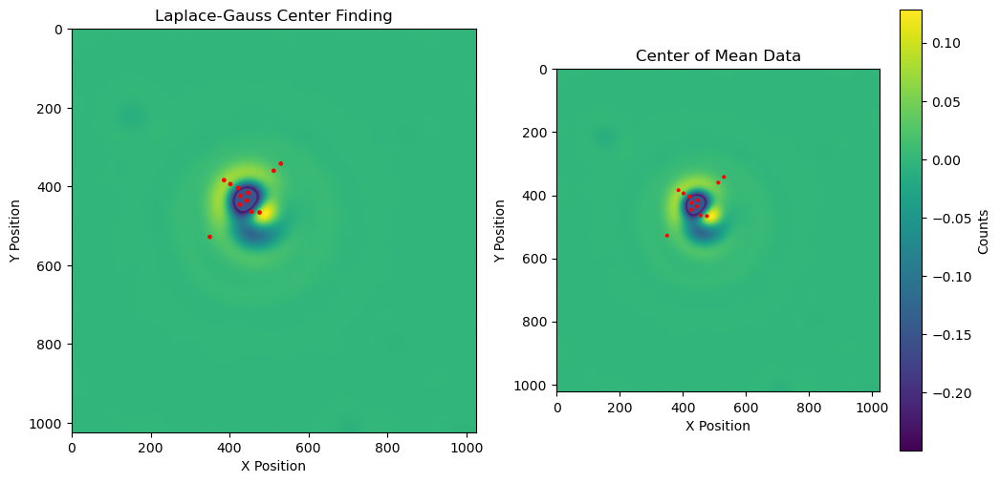

0.5119099617004395
[[[442.5 433.5  28.8]
  [527.5 346.5  92.3]
  [429.5 450.5  11.8]
  [353.5 343.5  98.9]
  [465.5 454.5  10.2]
  [406.5 390.5  27.7]
  [456.5 417.5   9.1]
  [422.5 428.5   8.2]]]


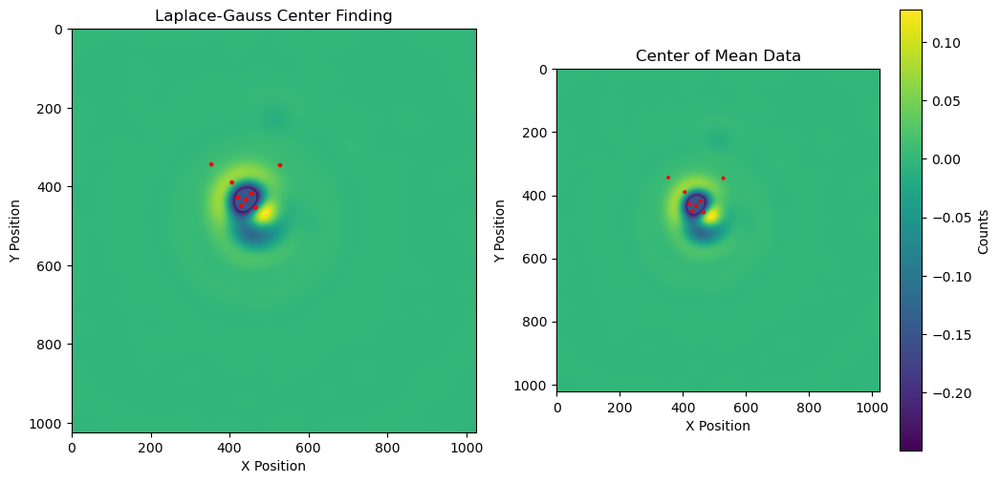

0.45464611053466797
[[[443.5 434.5  29.7]
  [387.5 377.5  99.4]
  [354.5 346.5  95.2]
  [428.5 450.5  10.2]
  [470.5 464.5  21. ]
  [531.5 341.5  99.4]
  [403.5 391.5  28.8]
  [427.5 420.5   8.8]
  [455.5 417.5   8.8]
  [512.5 360.5  72.7]]]


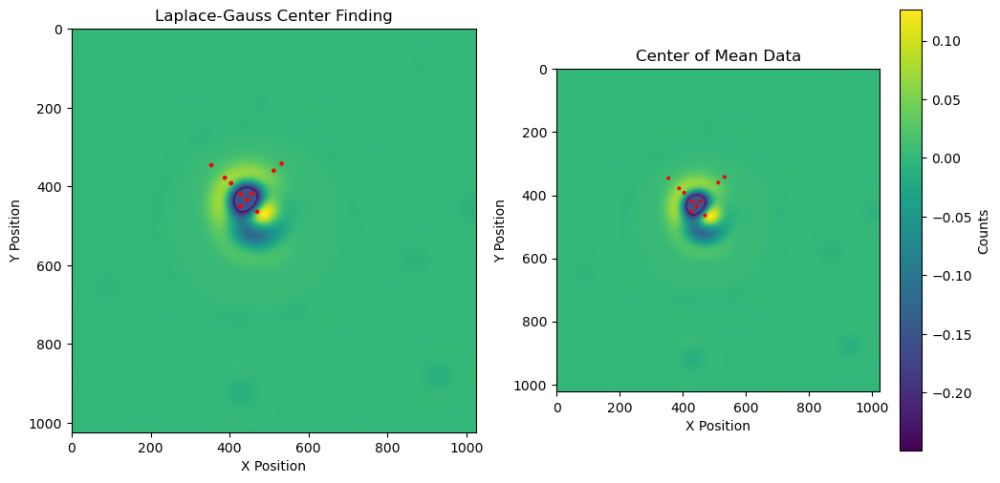

0.4742920398712158
[[[441.5 434.5  28.6]
  [474.5 469.5  27.2]
  [428.5 450.5  10.2]
  [356.5 348.5  92.2]
  [390.5 382.5  44.2]
  [455.5 419.5  10.3]
  [410.5 404.5  14.6]
  [425.5 422.5   9.1]
  [460.5 454.5   6.9]]]


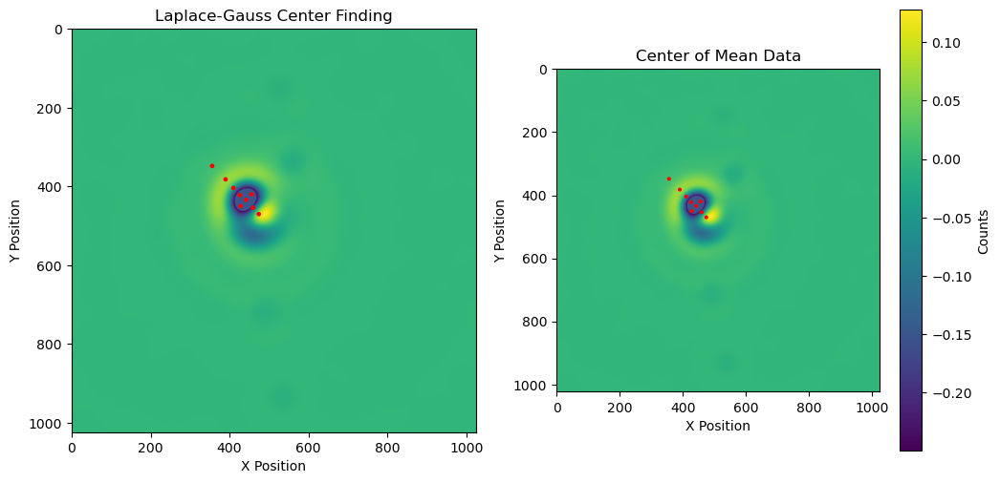

0.46813011169433594
[[[443.5 434.5  30.2]
  [417.5 423.5  49.9]
  [351.5 343.5  99.4]
  [431.5 450.5  11.8]
  [524.5 520.5  98. ]
  [350.5 526.5  99.4]
  [386.5 380.5  48.6]
  [402.5 394.5  28. ]
  [477.5 478.5  36.5]
  [529.5 344.5  95.8]
  [468.5 455.5  13.7]
  [460.5 422.5   7.4]
  [436.5 415.5  10.6]]]


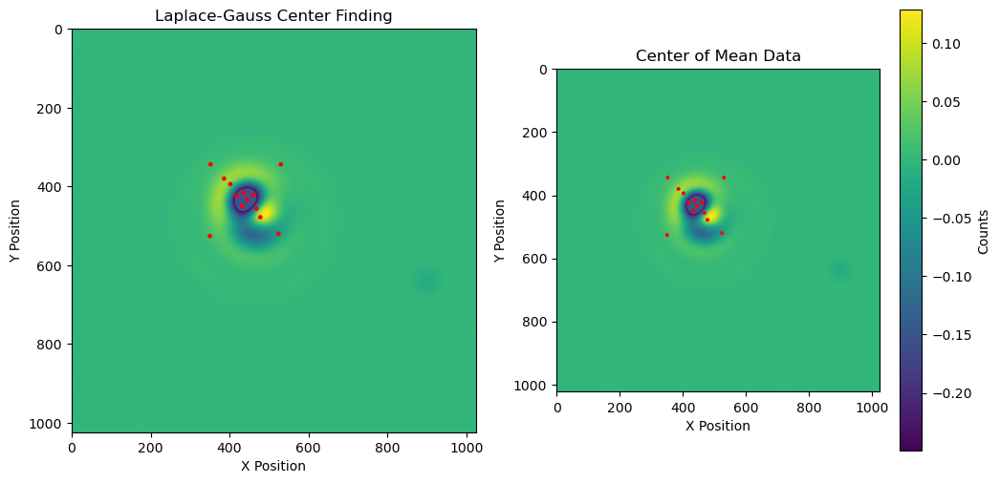

0.5303201675415039
[[[445.5 436.5  32.9]
  [425.5 422.5  41.2]
  [426.5 444.5  12.4]
  [356.5 348.5  92.2]
  [387.5 379.5  48.5]
  [532.5 341.5  99.4]
  [461.5 466.5  16.3]
  [454.5 418.5  11.1]
  [411.5 403.5  14.6]]]


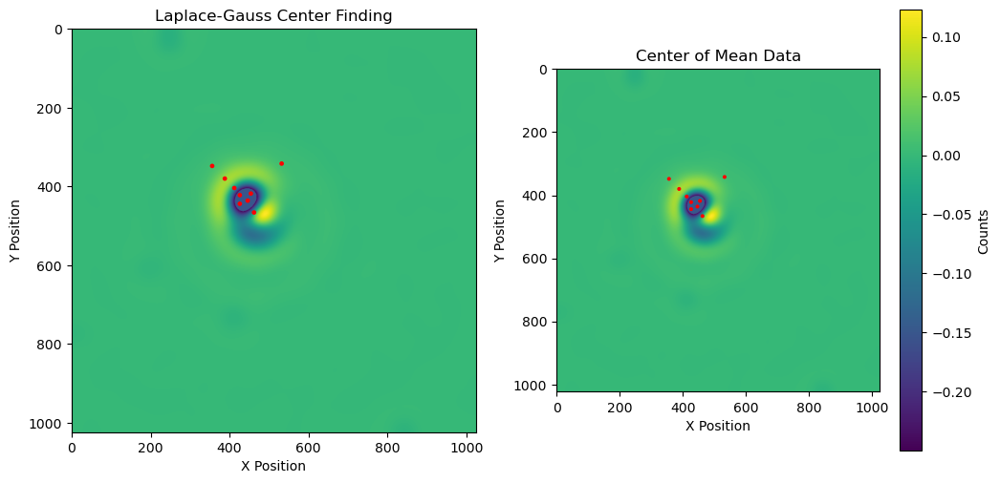

0.47847700119018555
[[[443.5 434.5  29.9]
  [424.5 419.5  44.4]
  [532.5 341.5  99.4]
  [394.5 384.5  40. ]
  [481.5 462.5  27.9]
  [517.5 355.5  79. ]
  [474.5 483.5  37.1]
  [410.5 404.5  14.6]
  [427.5 447.5  11.4]
  [455.5 417.5   8.8]]]


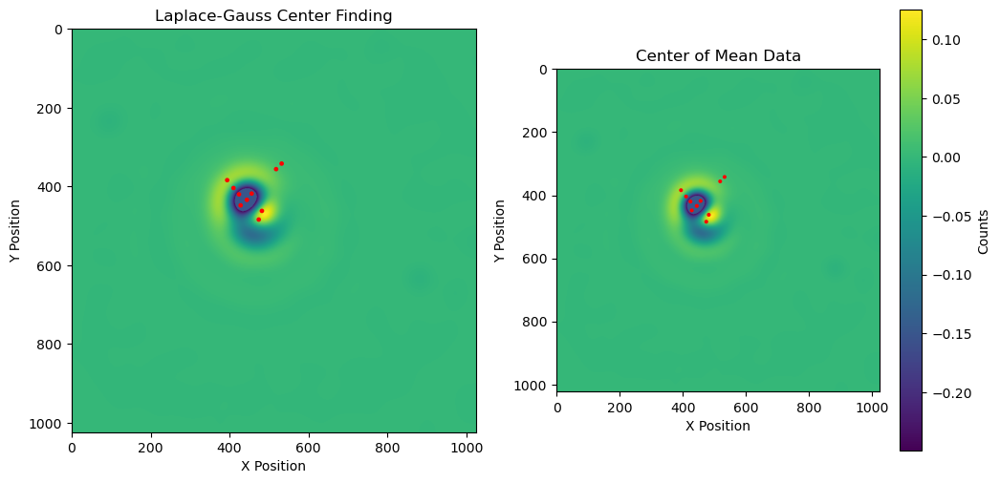

0.5012691020965576
[[[443.5 434.5  30. ]
  [427.5 422.5  40.1]
  [352.5 524.5  95.9]
  [358.5 349.5  90.2]
  [479.5 482.5  40. ]
  [426.5 445.5  12.1]
  [401.5 396.5  26.6]
  [469.5 463.5  20.3]
  [456.5 417.5   9.1]]]


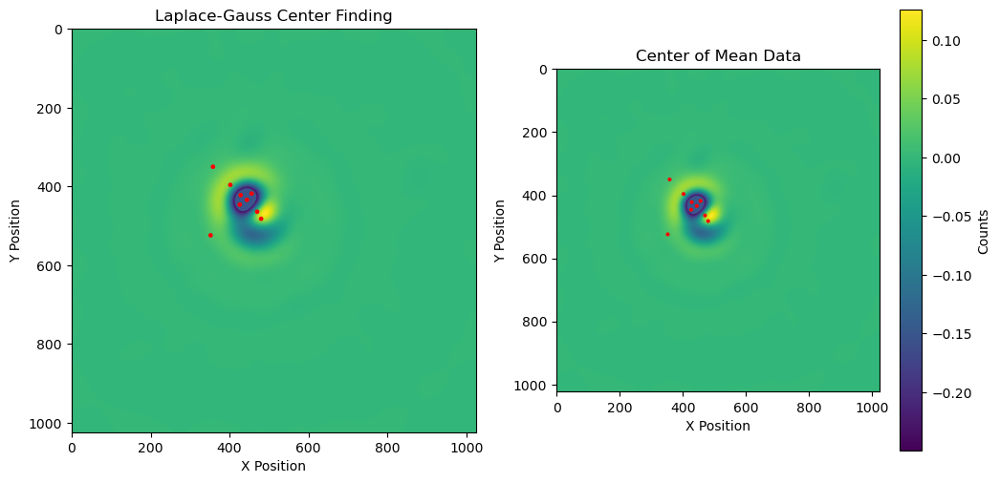

0.7513680458068848
[[[443.5 434.5  29.9]
  [424.5 419.5  44.2]
  [532.5 341.5  99.4]
  [473.5 482.5  35.7]
  [409.5 392.5  24.4]
  [390.5 384.5  43.6]
  [425.5 444.5  11.6]
  [455.5 418.5  10.1]
  [465.5 459.5  13.6]
  [490.5 406.5  26.8]]]


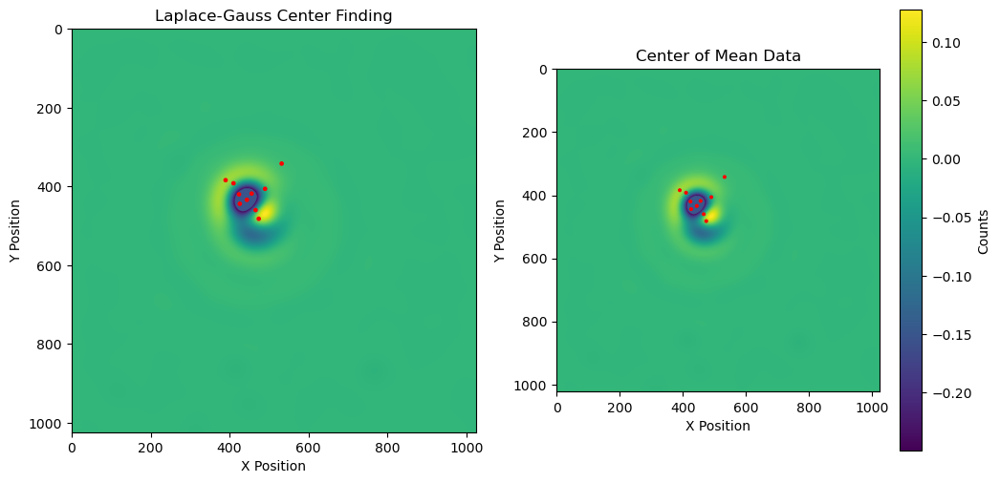

0.481126070022583
[[[443.5 435.5  30.3]
  [426.5 421.5  41.2]
  [401.5 400.5  73.4]
  [480.5 481.5  40. ]
  [354.5 346.5  95.1]
  [427.5 449.5  11.1]
  [392.5 382.5  42.8]
  [470.5 462.5  19.9]
  [531.5 342.5  99.4]]]


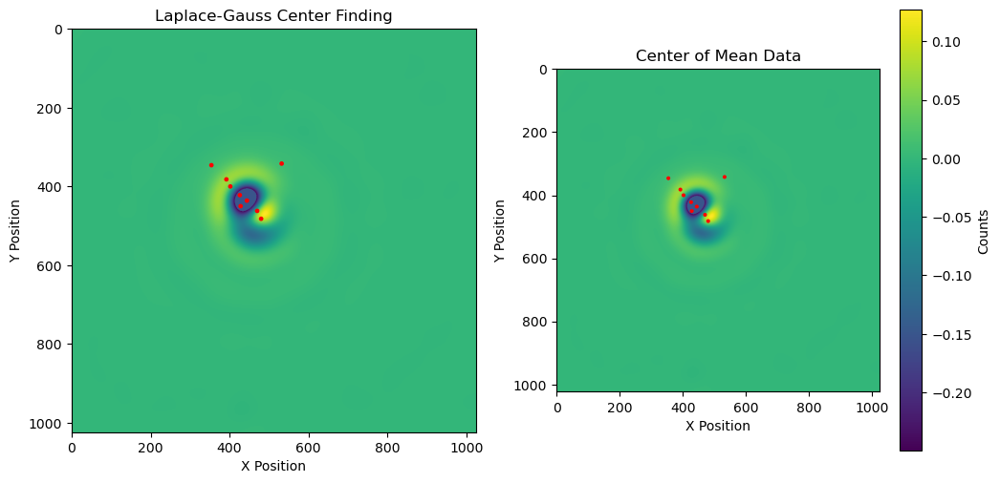

0.5436978340148926
[[[445.5 436.5  33. ]
  [429.5 422.5  38.6]
  [386.5 381.5  96.7]
  [532.5 341.5  99.4]
  [429.5 448.5  13. ]
  [456.5 419.5   9.6]
  [482.5 485.5  44.4]
  [404.5 390.5  28.6]
  [475.5 462.5  22.9]]]


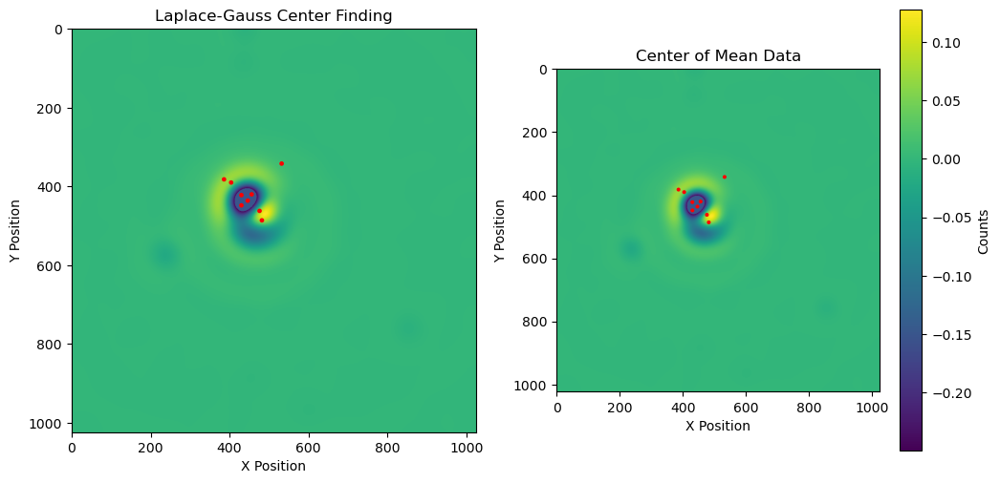

0.47409582138061523
[[[443.5 434.5  29.9]
  [354.5 346.5  95.1]
  [527.5 346.5  92.3]
  [427.5 449.5  11.1]
  [392.5 382.5  42.8]
  [403.5 402.5  21.6]
  [473.5 453.5  16. ]
  [427.5 420.5   8.8]]]


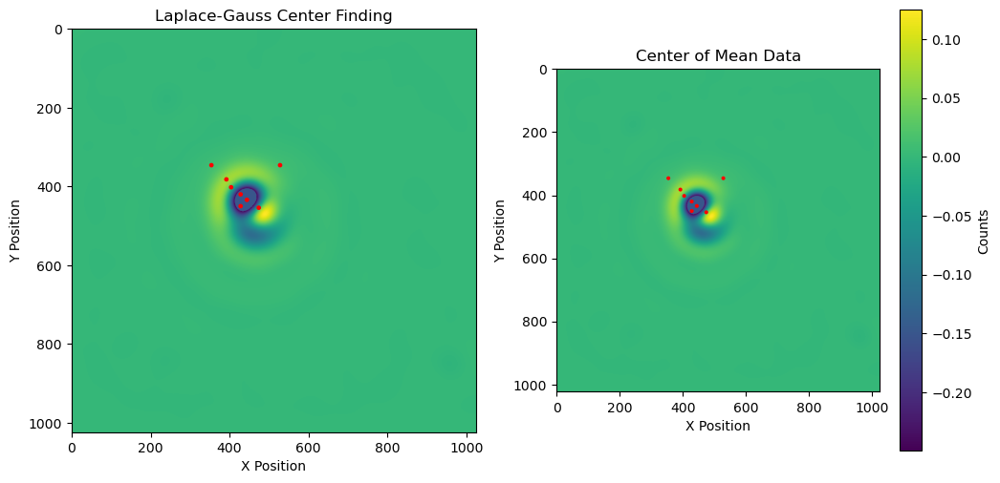

0.4824960231781006
[[[442.5 433.5  28.6]
  [422.5 416.5  47.4]
  [480.5 481.5  40. ]
  [354.5 346.5  95.1]
  [470.5 463.5  20.8]
  [527.5 346.5  92.3]
  [429.5 451.5   9.6]
  [399.5 385.5  36.3]
  [451.5 415.5   9.4]
  [391.5 480.5  38.5]]]


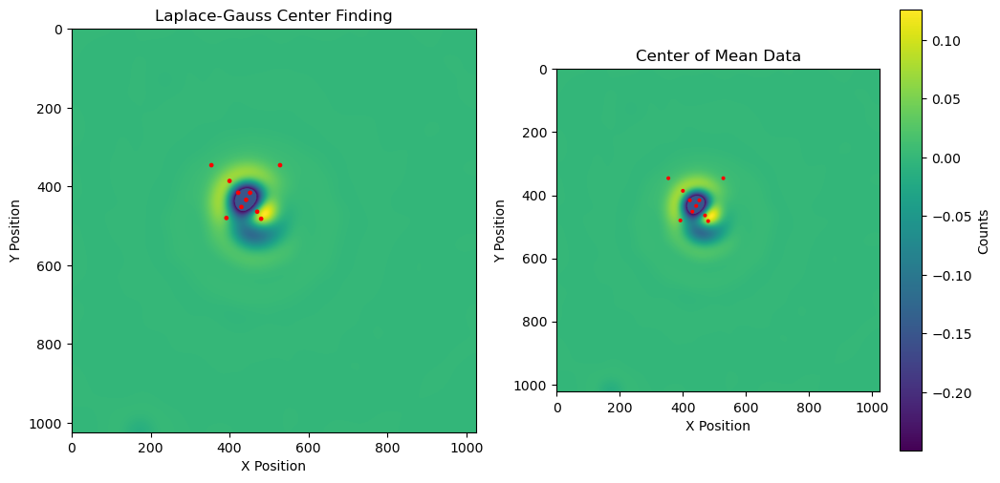

0.5129499435424805
[[[444.5 436.5  31.9]
  [351.5 342.5  99.4]
  [428.5 450.5  10.2]
  [469.5 476.5  29.3]
  [430.5 421.5  12.8]
  [454.5 418.5  11.1]
  [397.5 388.5  34.3]
  [412.5 407.5  10.9]
  [527.5 346.5  92.1]
  [463.5 455.5   9.4]]]


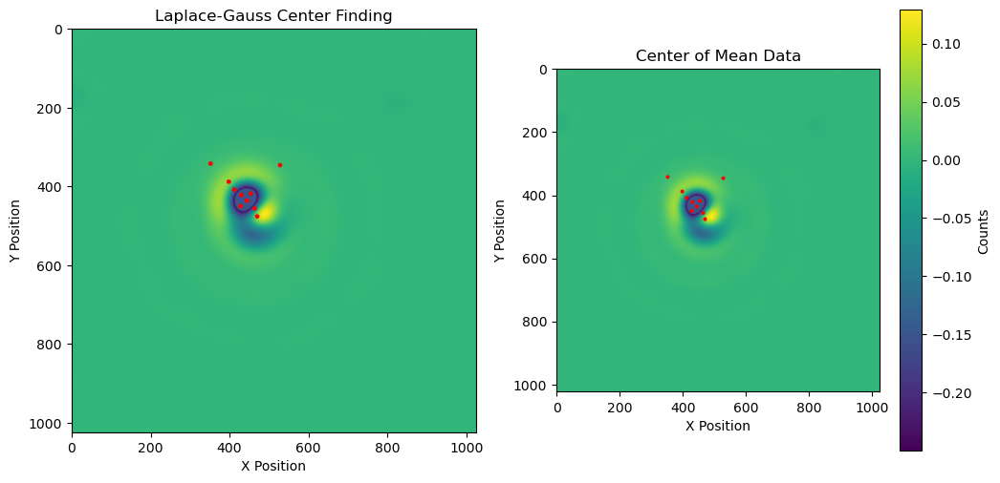

0.49708008766174316
[[[443.5 434.5  30. ]
  [421.5 416.5  48.1]
  [386.5 380.5  98. ]
  [351.5 343.5  99.4]
  [530.5 342.5  97.3]
  [477.5 478.5  36.2]
  [512.5 360.5  71.9]
  [427.5 448.5  11. ]
  [403.5 391.5  28.8]
  [478.5 394.5  23.8]
  [400.5 475.5  27.4]
  [462.5 458.5  11.4]
  [458.5 417.5   6.9]]]


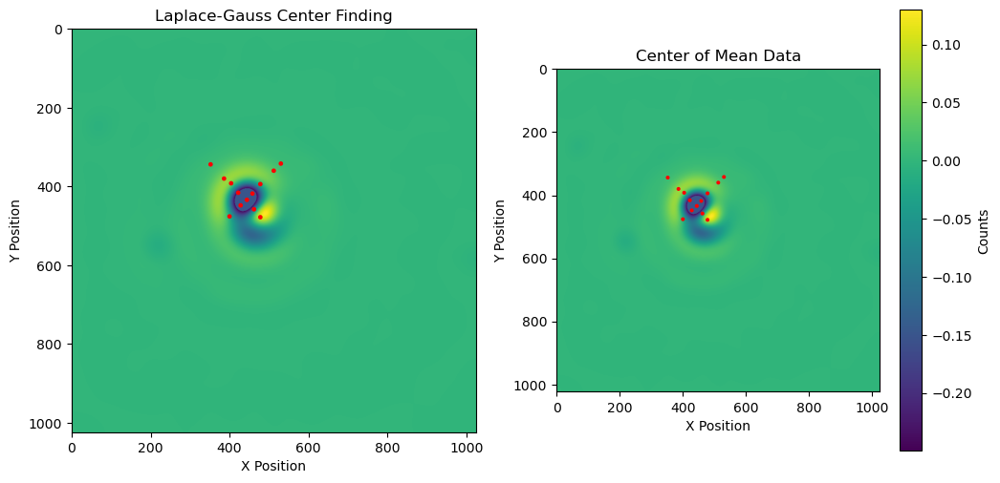

0.5410828590393066
[[[442.5 435.5  30.2]
  [422.5 416.5  47.7]
  [532.5 341.5  99.4]
  [351.5 525.5  97.3]
  [386.5 381.5  48.5]
  [409.5 392.5  24.4]
  [482.5 485.5  43.8]
  [426.5 448.5  10.2]
  [456.5 417.5   9.1]
  [468.5 462.5  17.7]]]


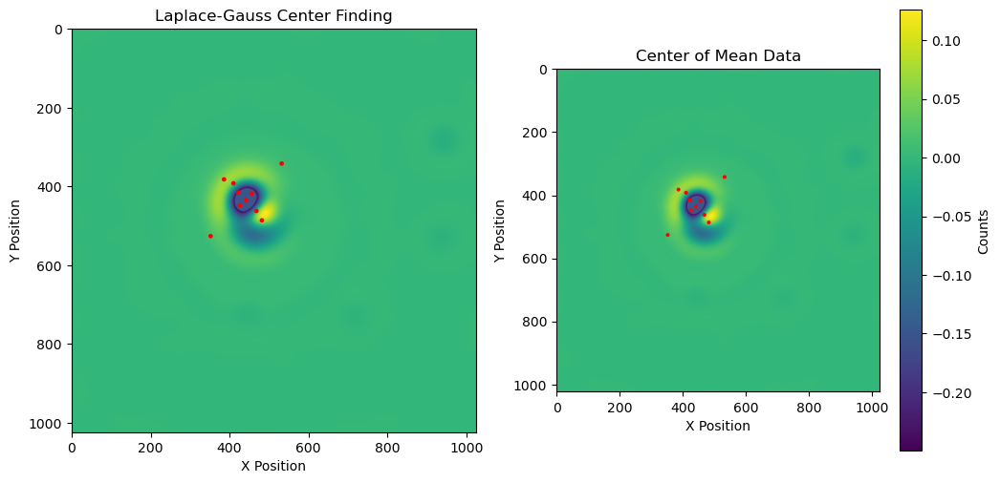

0.7894949913024902
[[[443.5 434.5  29.4]
  [525.5 520.5  99.4]
  [359.5 516.5  86. ]
  [429.5 451.5  10. ]
  [532.5 341.5  99.4]
  [406.5 392.5  26.6]
  [352.5 344.5  98.9]
  [451.5 415.5   9.4]
  [427.5 420.5   8.8]
  [470.5 464.5  20.2]
  [475.5 396.5  20.4]]]


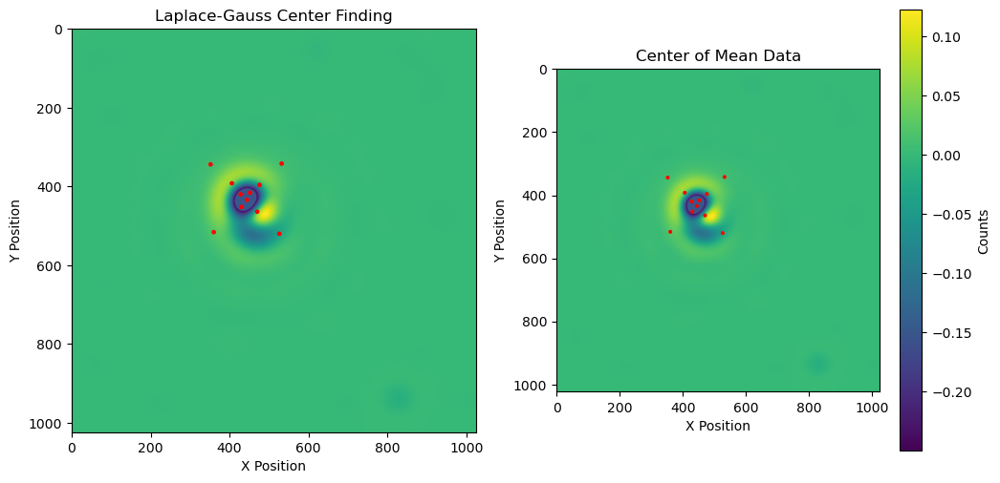

0.503087043762207
[[[443.5 434.5  29.9]
  [426.5 422.5  40. ]
  [395.5 389.5  85.2]
  [525.5 518.5  98.3]
  [530.5 342.5  97.2]
  [427.5 449.5  11.1]
  [490.5 473.5  41.6]
  [470.5 464.5  21.3]
  [353.5 343.5  98.9]
  [393.5 482.5  37.8]
  [418.5 401.5  11.6]
  [455.5 417.5   8.8]
  [512.5 360.5  71.6]
  [412.5 463.5  10.5]
  [470.5 444.5   8.8]]]


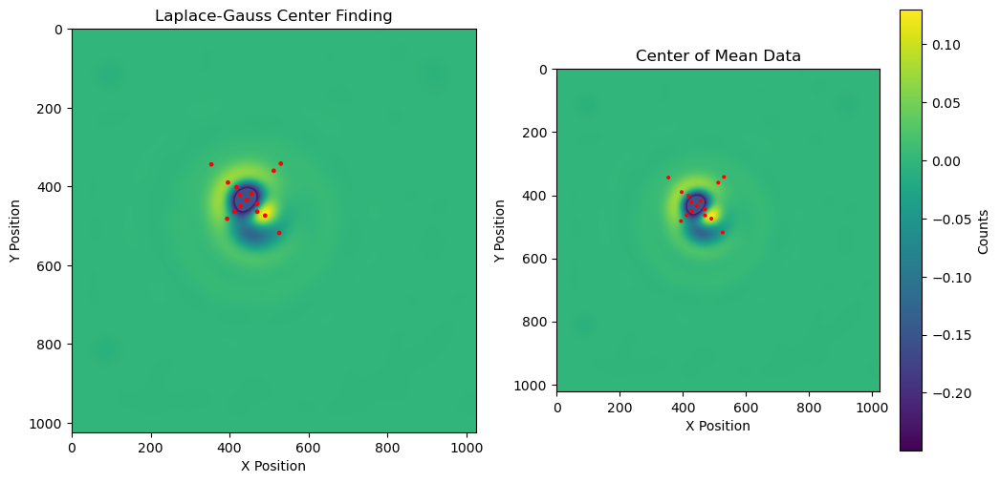

0.551276683807373
[[[443.5 436.5  31.5]
  [476.5 472.5  30.8]
  [391.5 381.5  44.9]
  [427.5 449.5  11.1]
  [426.5 425.5  11. ]
  [529.5 344.5  95.1]
  [407.5 400.5  20.8]
  [454.5 418.5  11.1]
  [459.5 457.5   8.7]]]


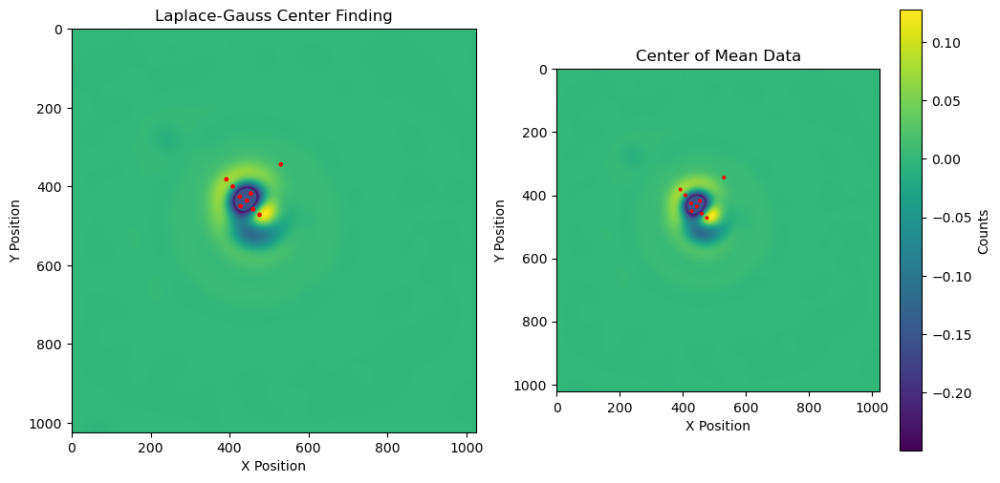

0.48596668243408203
[[[443.5 434.5  29.7]
  [424.5 421.5  42.2]
  [406.5 398.5  71.1]
  [532.5 341.5  99.4]
  [384.5 381.5  49.9]
  [488.5 478.5  43.5]
  [453.5 416.5   9.6]
  [472.5 466.5  23.6]
  [425.5 447.5  10. ]
  [472.5 445.5  10.8]]]


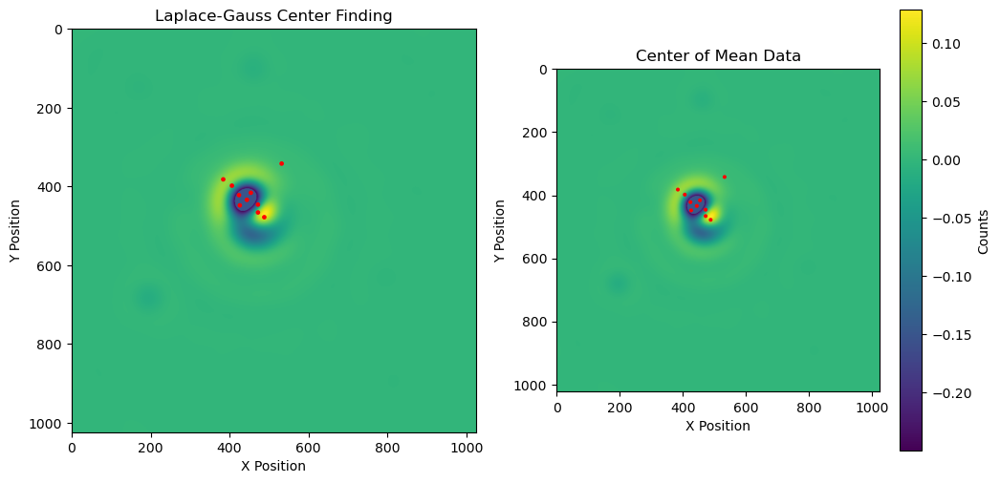

0.5613722801208496
[[[443.5 434.5  30.2]
  [424.5 417.5  44.9]
  [399.5 395.5  78.3]
  [529.5 343.5  95.9]
  [429.5 450.5  11.8]
  [476.5 463.5  25.2]
  [460.5 421.5   6.9]
  [356.5 348.5  93.1]]]


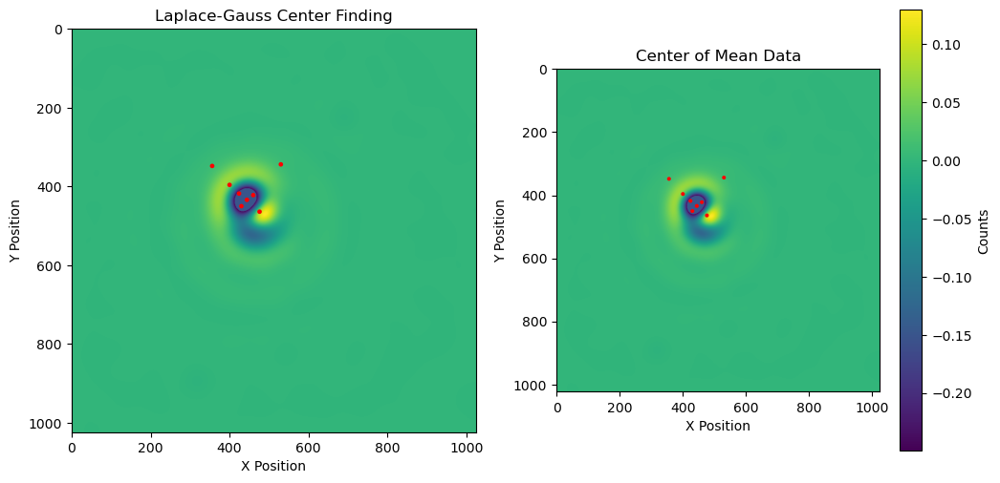

0.4788551330566406
[[[443.5 434.5  29.9]
  [427.5 422.5  40.1]
  [390.5 389.5  89.1]
  [351.5 525.5  97.3]
  [425.5 448.5  10. ]
  [406.5 407.5  16. ]
  [462.5 458.5  11.4]]]


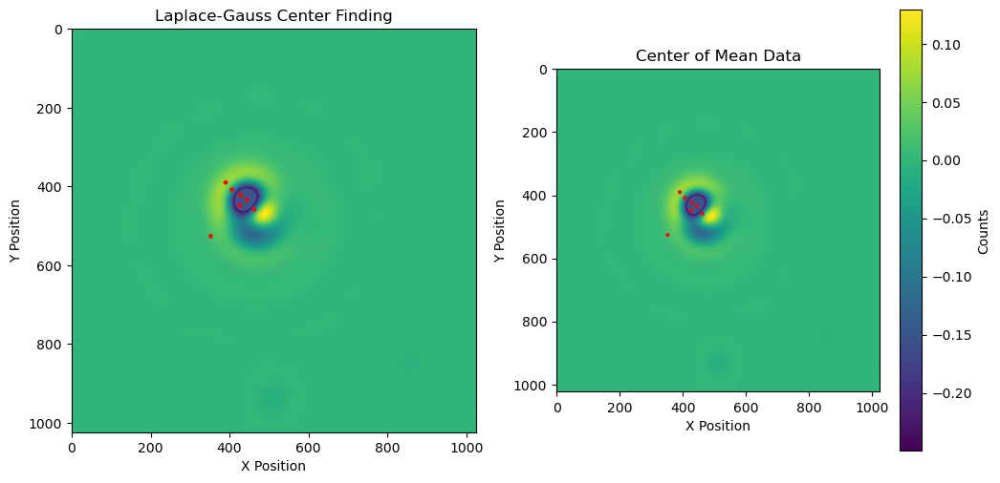

0.47116994857788086
[[[443.5 434.5  30. ]
  [424.5 419.5  44.2]
  [532.5 341.5  99.4]
  [351.5 525.5  97.3]
  [427.5 447.5  12.2]
  [386.5 381.5  48.5]
  [479.5 482.5  40.2]
  [408.5 396.5  21.6]
  [466.5 454.5  11. ]
  [456.5 417.5   9.1]
  [405.5 470.5  20.4]]]


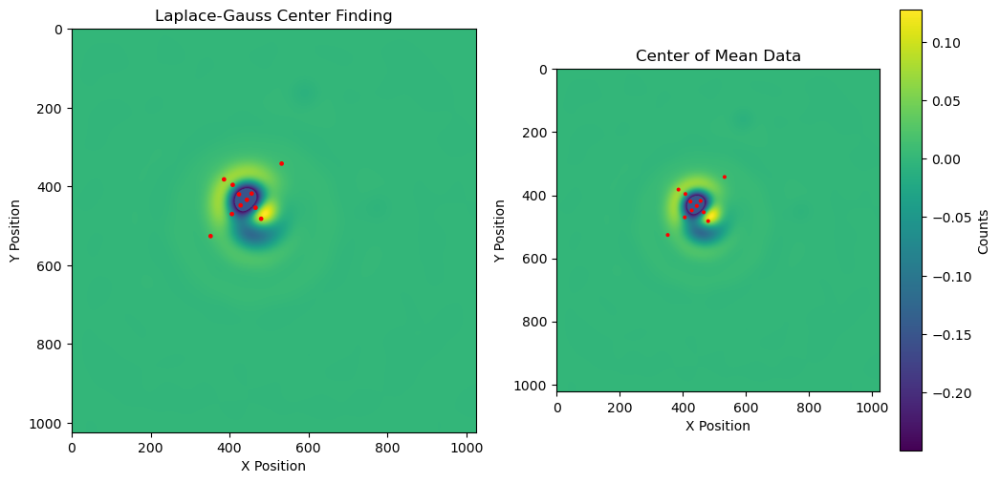

0.49852633476257324
[[[443.5 434.5  30. ]
  [474.5 471.5  29. ]
  [427.5 449.5  11.1]
  [390.5 389.5  39.4]
  [412.5 402.5  14.6]
  [431.5 418.5  10.3]
  [456.5 417.5   9.1]]]


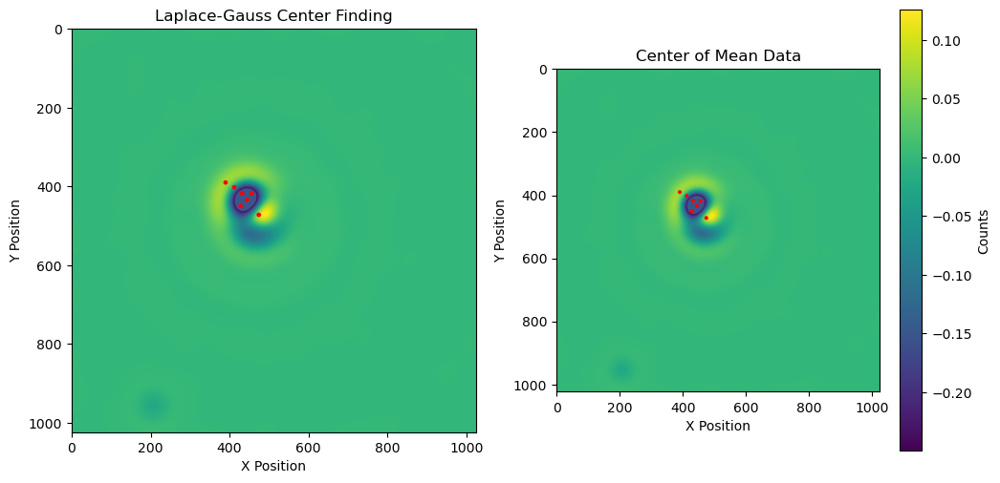

0.5686109066009521
[[[443.5 434.5  29.4]
  [422.5 416.5  47.6]
  [532.5 341.5  99.4]
  [360.5 517.5  86.7]
  [390.5 384.5  43.5]
  [409.5 392.5  24.3]
  [425.5 447.5  10. ]
  [473.5 467.5  26.1]
  [451.5 415.5   9.4]
  [456.5 456.5   5.5]]]


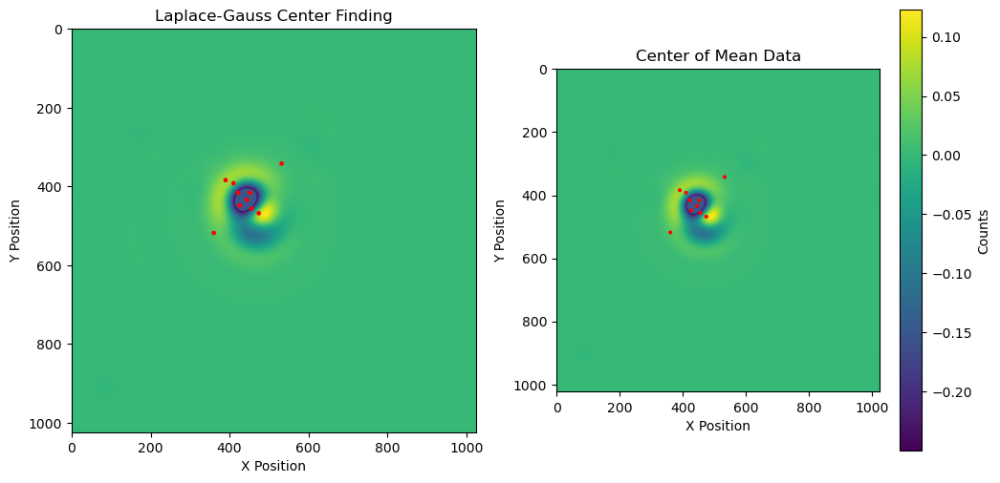

0.48390793800354004
[[[443.5 434.5  30. ]
  [426.5 421.5  41.4]
  [351.5 343.5  99.4]
  [479.5 474.5  34.4]
  [351.5 525.5  97.3]
  [427.5 447.5  12.2]
  [390.5 389.5  39.4]
  [464.5 455.5  10.9]
  [406.5 407.5  16. ]
  [456.5 417.5   8. ]]]


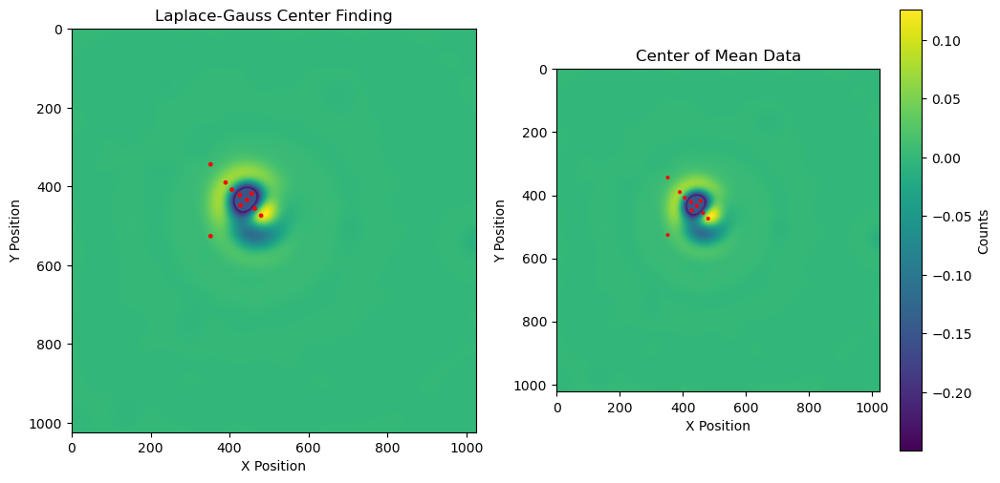

0.4708871841430664
[[[443.5 435.5  30.5]
  [426.5 422.5  40.2]
  [394.5 386.5  88.7]
  [524.5 520.5  98. ]
  [356.5 348.5  92.2]
  [454.5 418.5  11.1]
  [425.5 448.5  10. ]
  [470.5 464.5  20.2]
  [407.5 406.5  16. ]]]


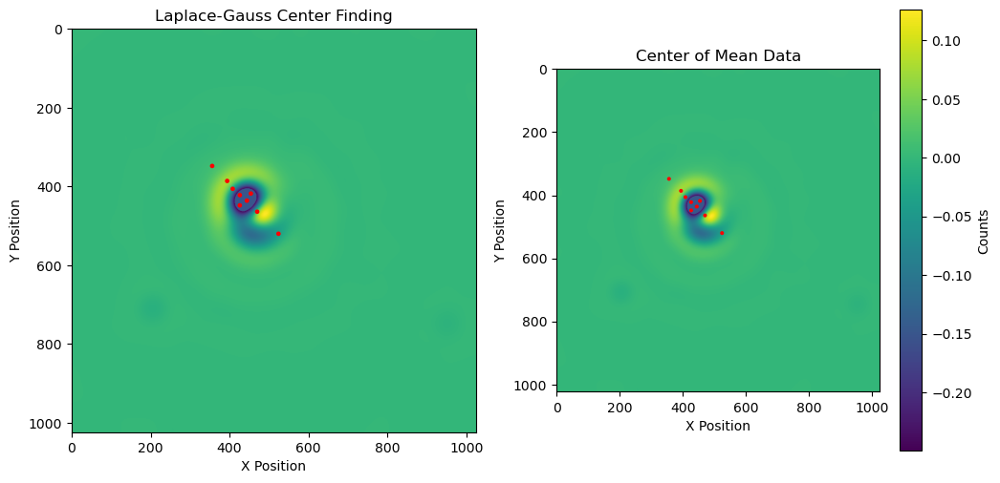

0.4844810962677002
[[[442.5 433.5  28.8]
  [422.5 416.5  47.6]
  [398.5 392.5  81.1]
  [526.5 346.5  92.3]
  [352.5 524.5  95.9]
  [475.5 467.5  26.6]
  [354.5 346.5  95.1]
  [428.5 448.5  11.8]
  [408.5 469.5  17.4]
  [458.5 418.5   6.9]]]


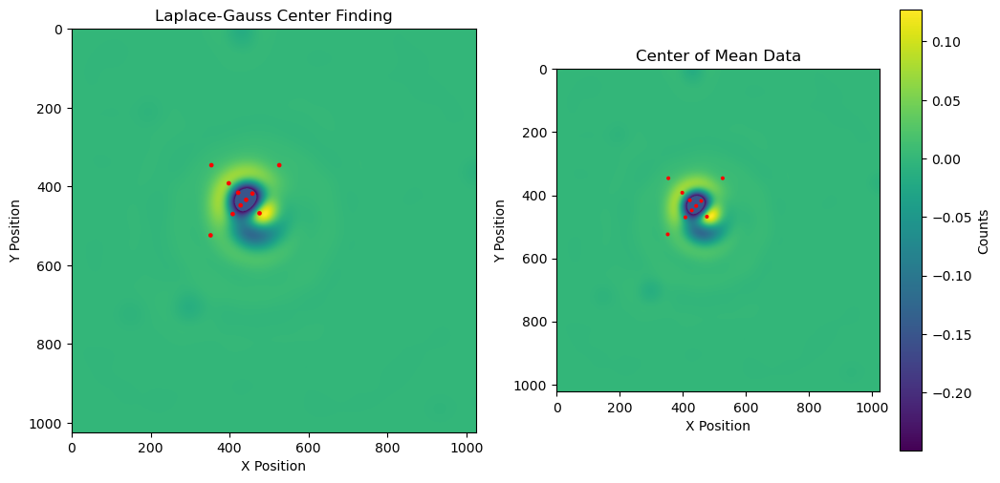

0.4865548610687256


In [84]:
for i in range(len(mean_tester)):


    LaplaceGauss = scipy.ndimage.gaussian_laplace(mean_tester[i], 33)
    
    mask = np.where(LaplaceGauss < -0.25)
    
#     patch_region_x = [380, 450]
    
#     patch_region_y = [380, 500]

#     mask[patch_region_x[0]:patch_region_x[1], patch_region_y[0]:patch_region_y[1]] = False

    LaplaceGauss[mask] = -0.15

    sigma = 3
    threshold_min = 1000
    threshold_max = 3000
    radius_min = 50
    radius_max = 150
    radius_step = 1
    num_of_peaks = 10

    t0 = time.time()
    LaplaceGauss.astype(np.uint8)
    normalized_image = cv2.normalize(LaplaceGauss, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=150, param2=5, minRadius=5, maxRadius=100)
    print(circles)
    if circles is not None:
        circles = np.round(circles[0, :]).astype(int)
    
        # Create subplots with titles and axis labels
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
        # Plot the 2nd image (LaplaceGauss) with detected circles
        ax = axes[0]
        ax.imshow(LaplaceGauss)
        ax.set_title('Laplace-Gauss Center Finding')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        for (x, y, r) in circles:
            ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))

    
        # Plot the 3rd image (cleanerData) with detected circles
        ax = axes[1]
        im = ax.imshow(LaplaceGauss)
        ax.set_title('Center of Mean Data')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        plt.colorbar(im, ax=ax, label='Counts')
        for (x, y, r) in circles:
            ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))


        # Display the subplots
        plt.show()
    print(time.time() - t0)



In [97]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'mean_tester' is an array containing your grayscale images



(468, 468)
Rough Center: (468, 468)


Rough Center: (466, 468)
477.3333333333333
481.06666666666666
0.8346438407897949


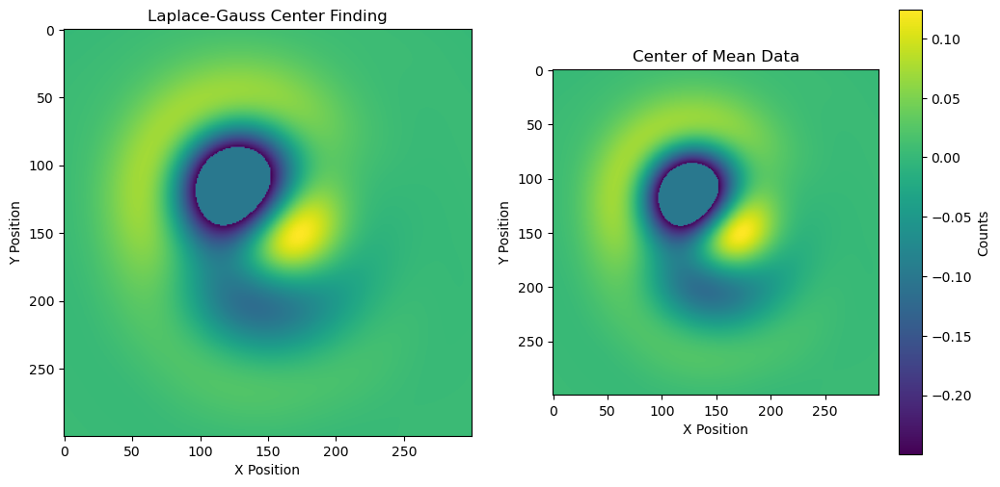

Rough Center: (468, 474)
477.7894736842105
483.1578947368421
0.8492081165313721


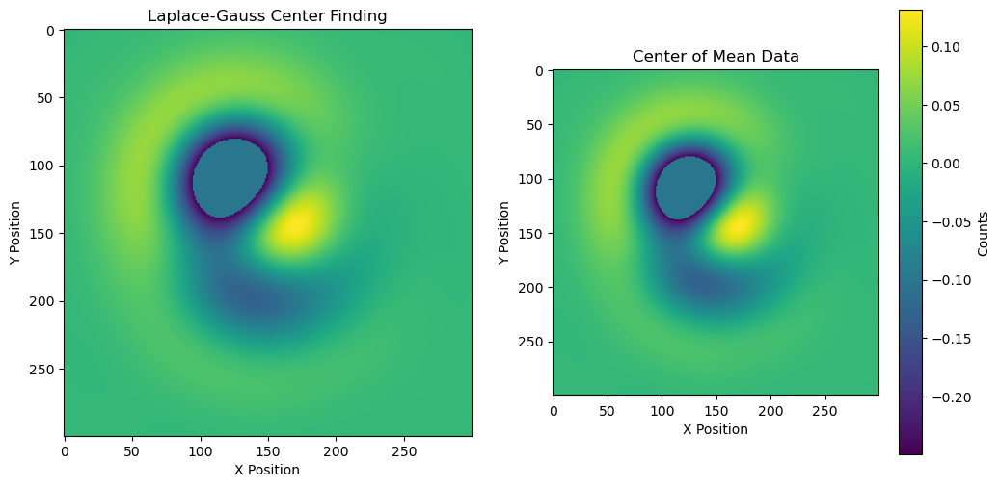

Rough Center: (474, 470)
483.09090909090907
478.8181818181818
0.8245723247528076


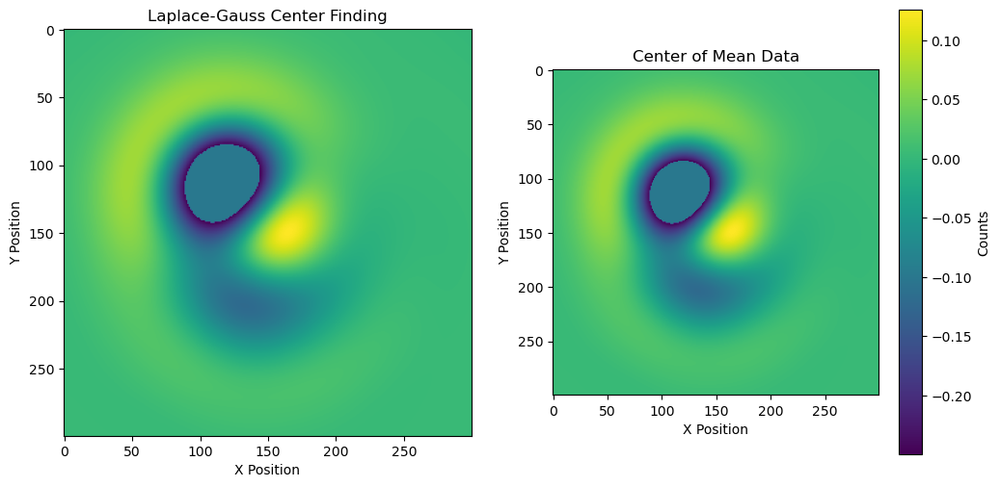

Rough Center: (468, 462)
482.3157894736842
474.5263157894737
0.8351762294769287


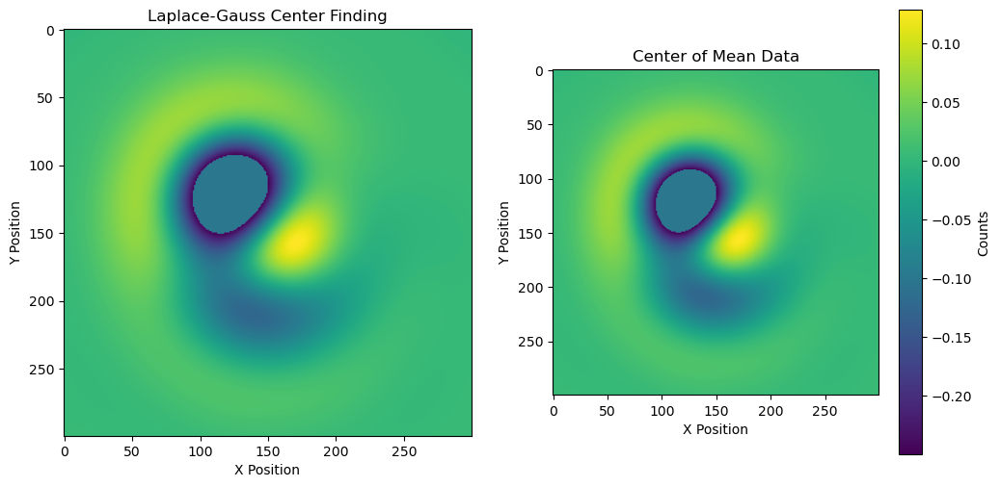

Rough Center: (478, 470)
483.6
476.6
1.0026328563690186


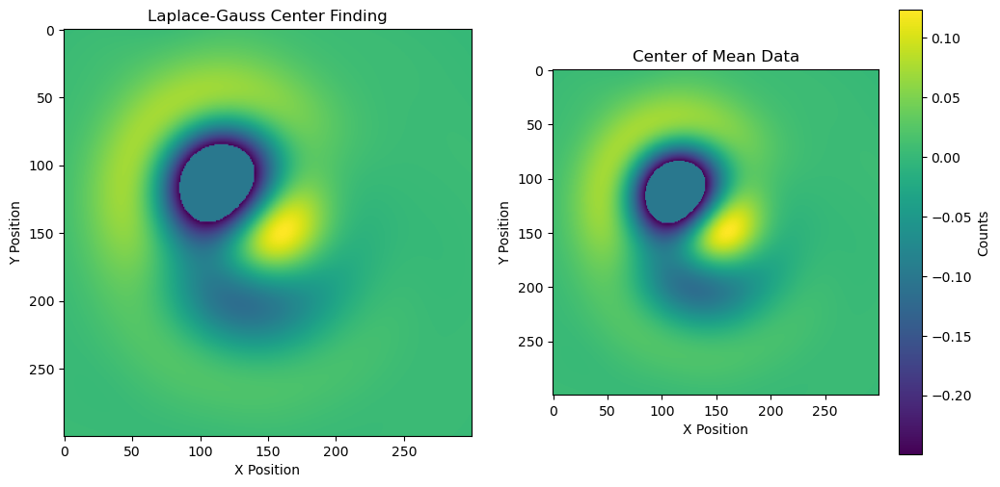

Rough Center: (478, 470)
485.22222222222223
473.55555555555554
0.9491500854492188


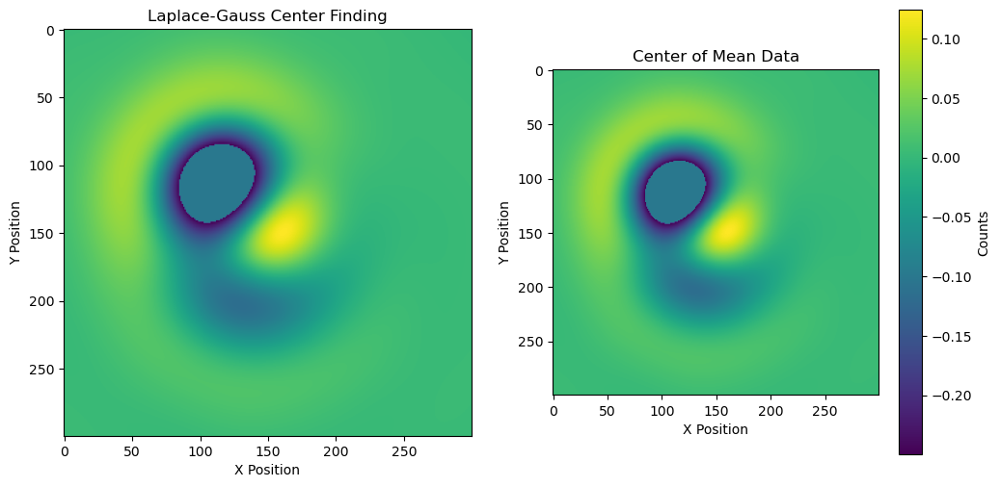

Rough Center: (476, 464)
485.09090909090907
475.6363636363636
0.8614230155944824


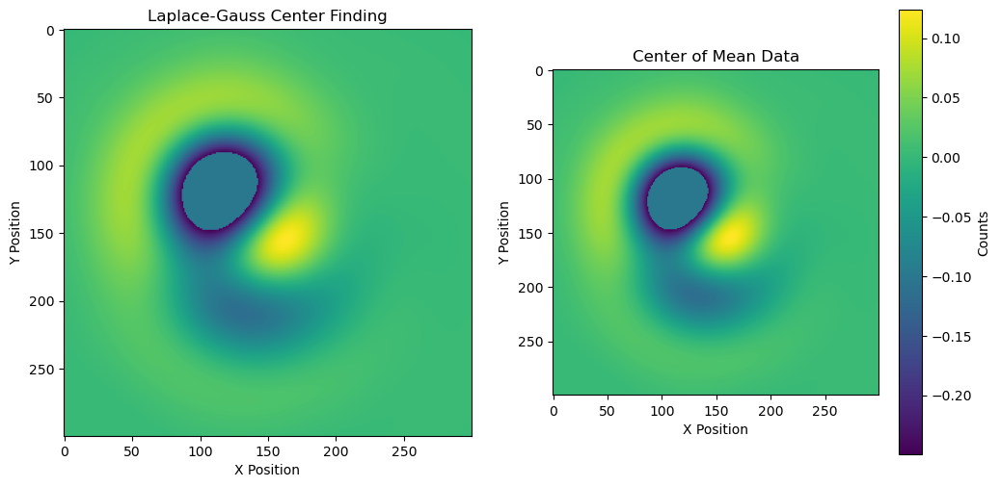

Rough Center: (470, 468)
481.3
478.4
0.8399691581726074


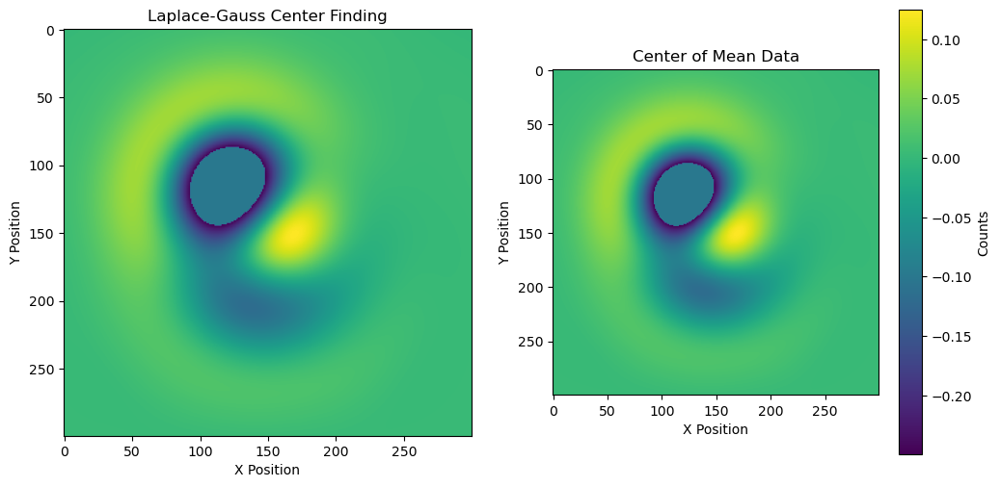

Rough Center: (476, 470)
483.05263157894734
477.1578947368421
1.2702648639678955


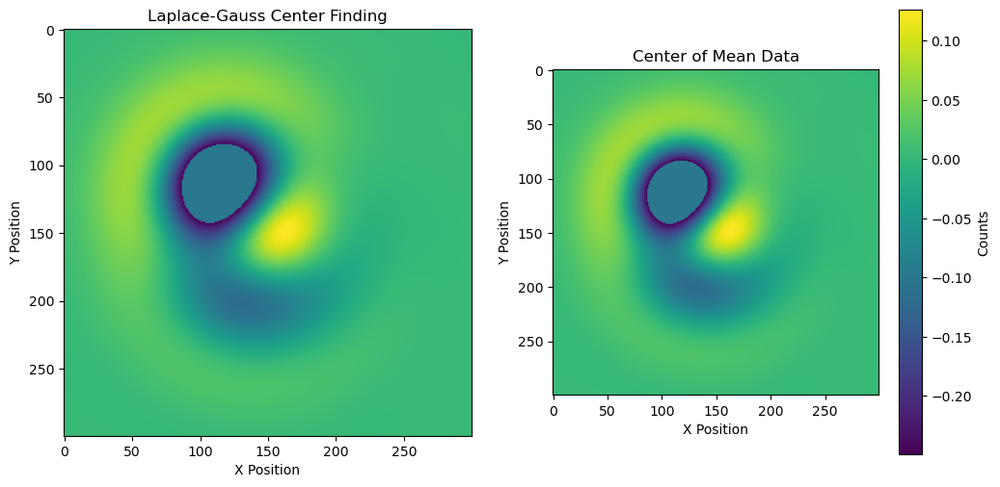

Rough Center: (474, 464)
487.2
478.08
0.8942131996154785


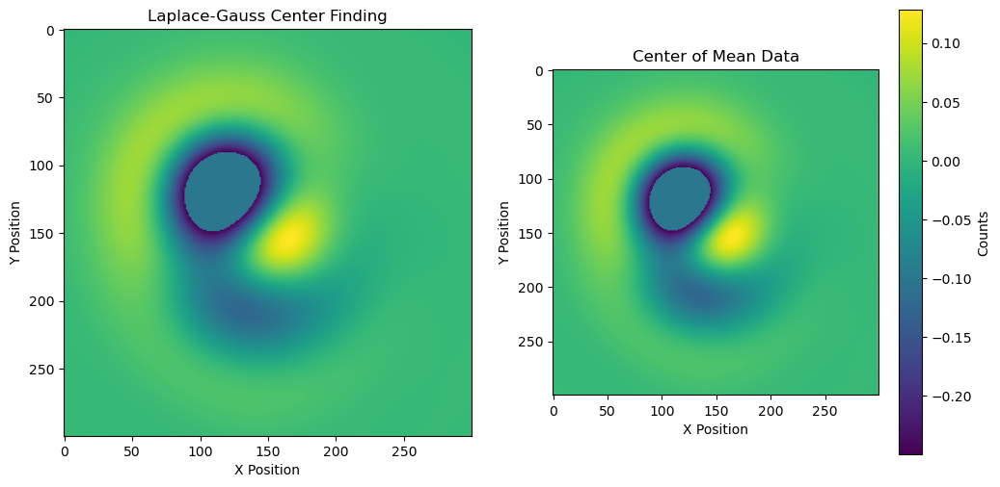

Rough Center: (470, 472)
479.05263157894734
481.1578947368421
0.8194286823272705


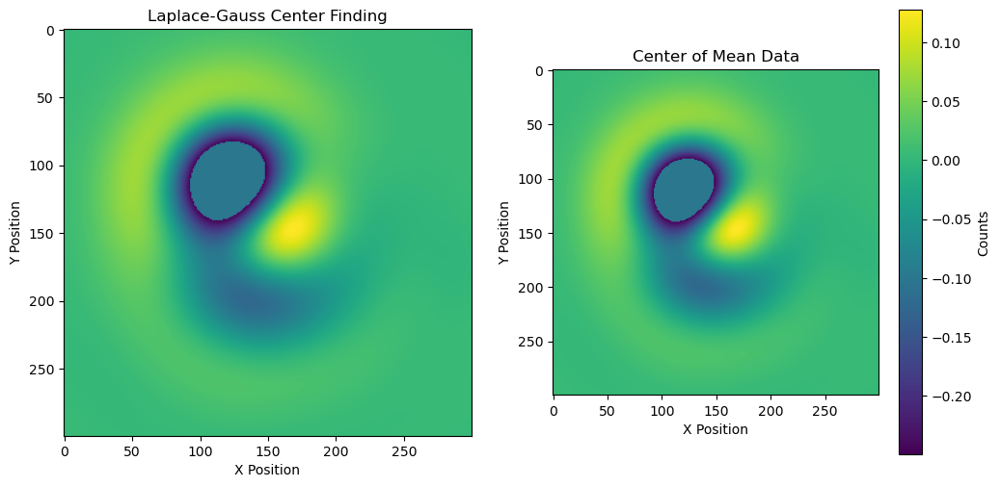

Rough Center: (480, 527)
484.2
495.6
0.8553159236907959


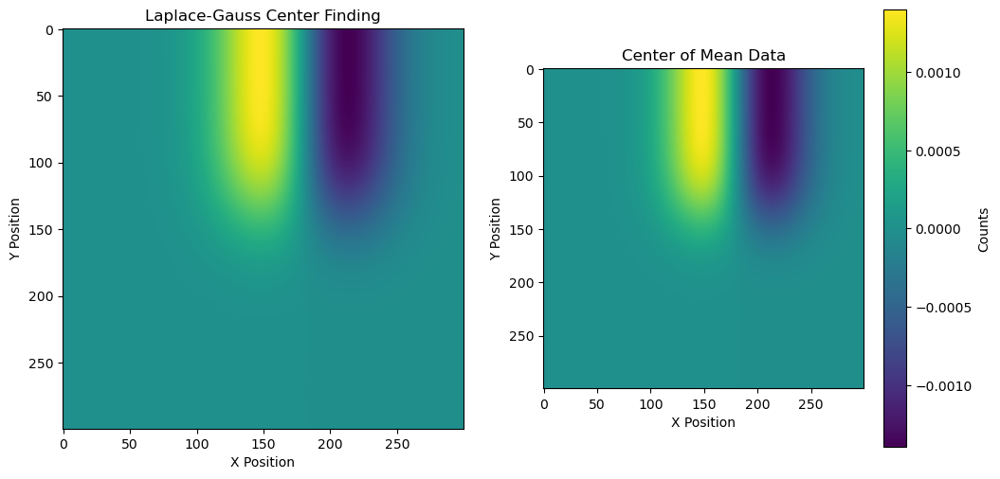

Rough Center: (464, 474)
474.5882352941176
488.94117647058823
0.8876090049743652


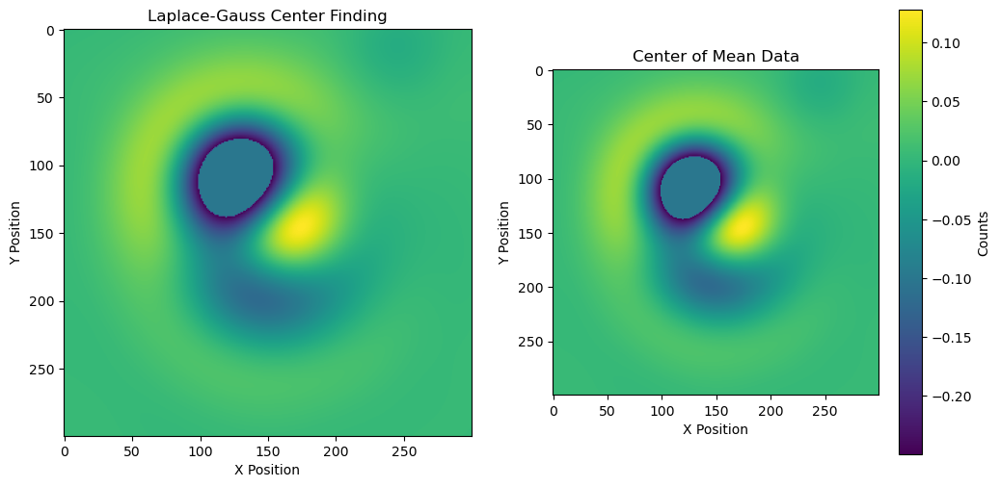

Rough Center: (470, 462)
485.8
474.1
1.0546486377716064


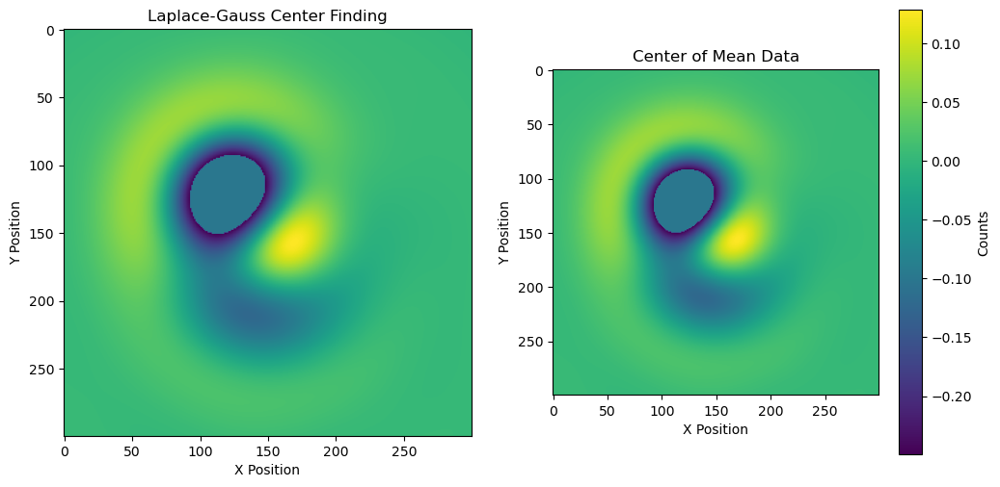

Rough Center: (468, 468)
483.88235294117646
478.5882352941176
0.9800910949707031


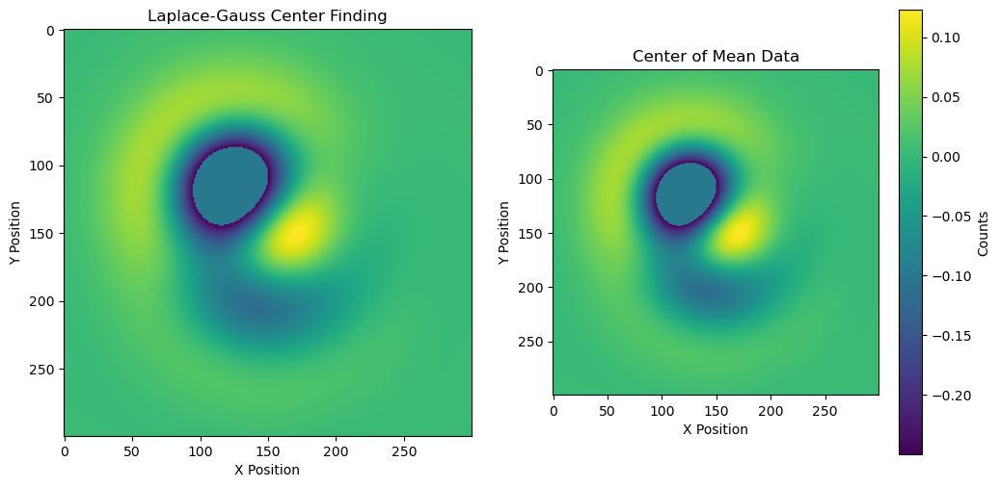

Rough Center: (468, 472)
475.84615384615387
482.61538461538464
1.205744981765747


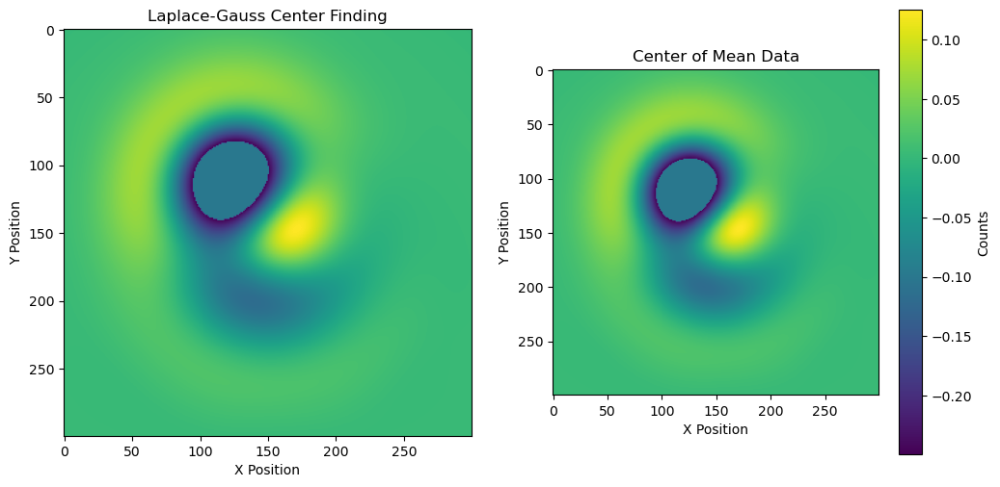

Rough Center: (464, 470)
472.3333333333333
485.22222222222223
0.8505089282989502


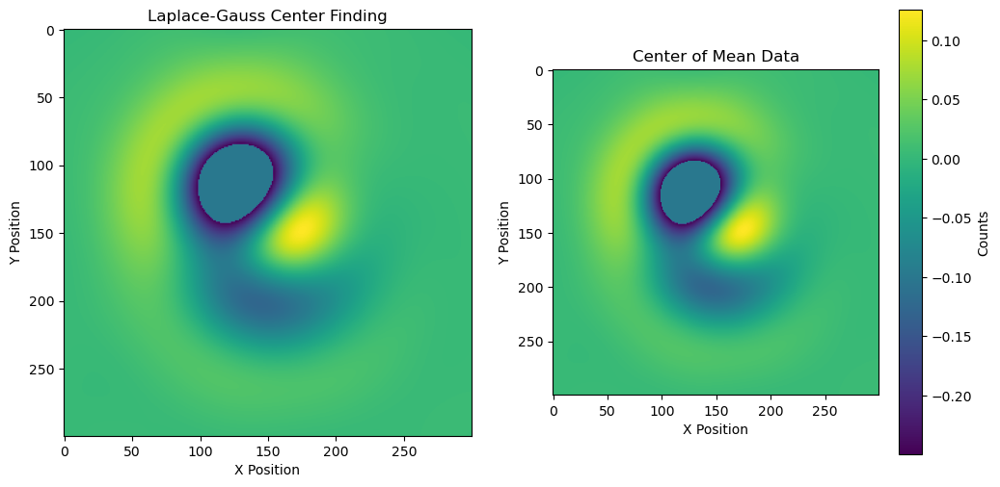

Rough Center: (464, 474)
472.3157894736842
490.8421052631579
0.8406667709350586


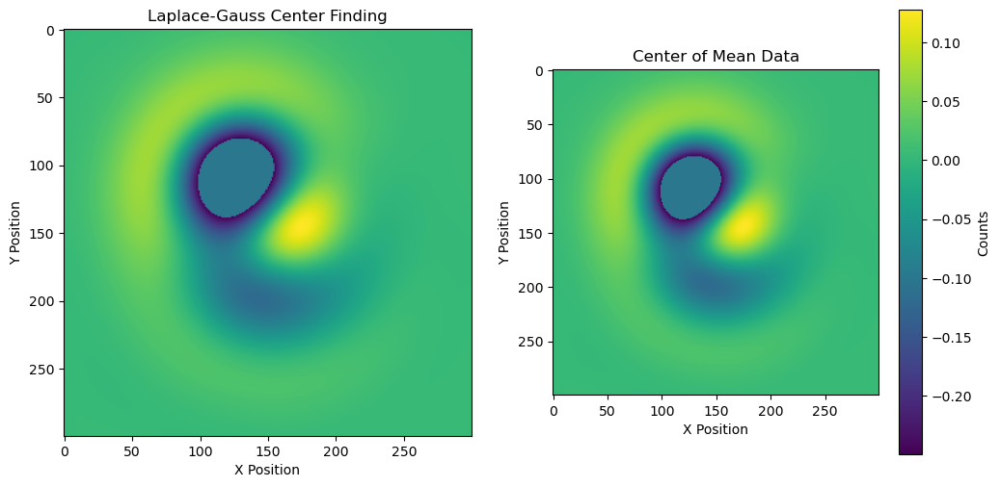

Rough Center: (476, 464)
488.5
474.0833333333333
0.9372632503509521


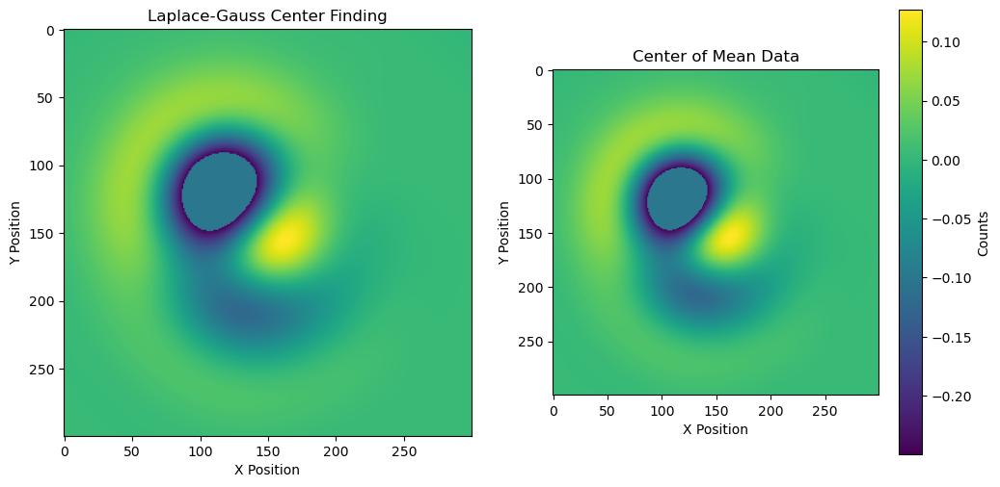

Rough Center: (470, 470)
481.9
482.0
0.8462698459625244


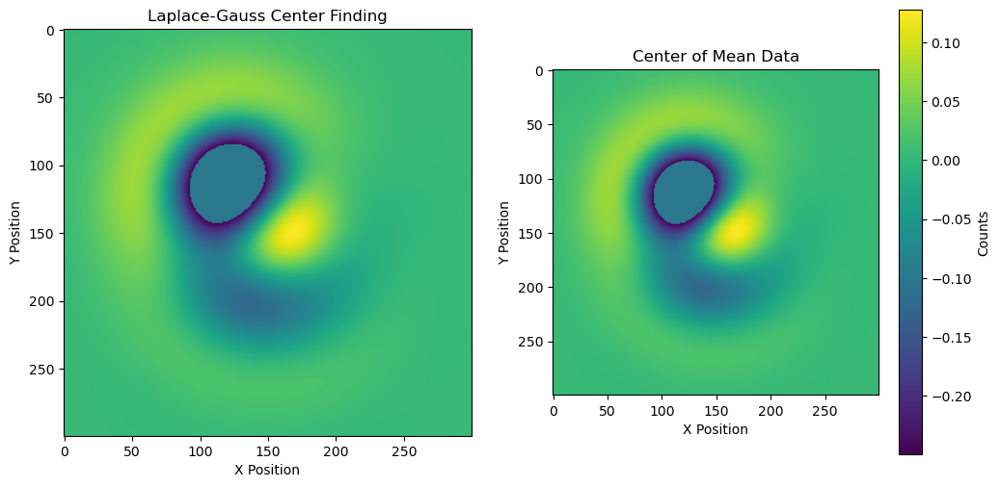

Rough Center: (474, 468)
482.3
475.4
0.8287532329559326


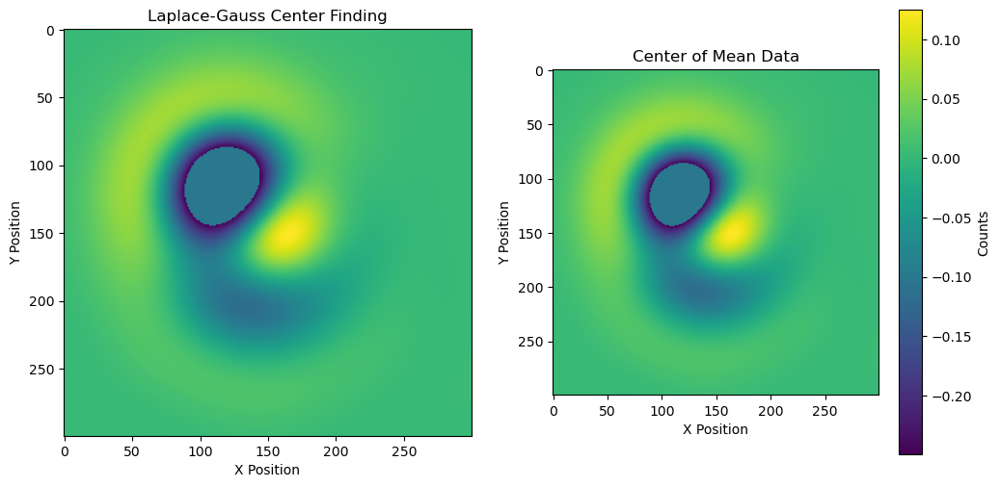

Rough Center: (476, 462)
488.45454545454544
470.72727272727275
0.8233380317687988


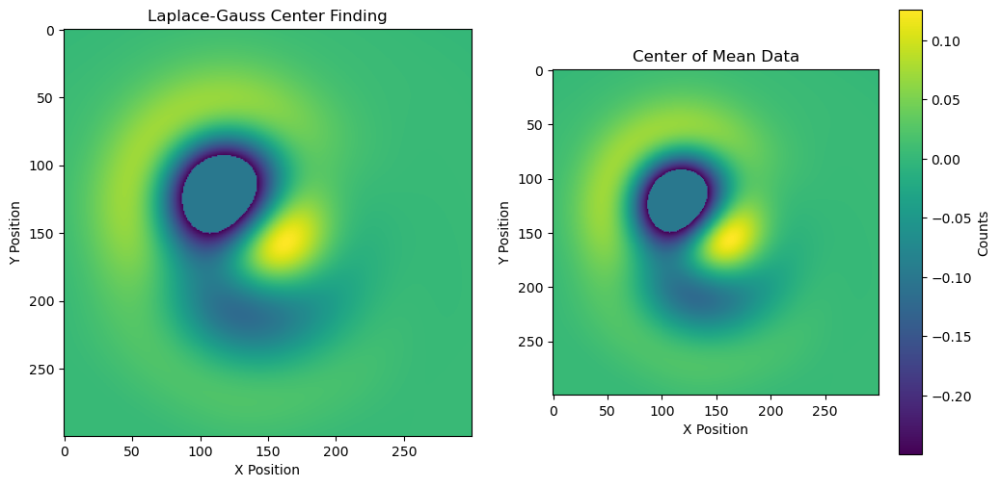

Rough Center: (476, 464)
488.24
471.92
0.8335089683532715


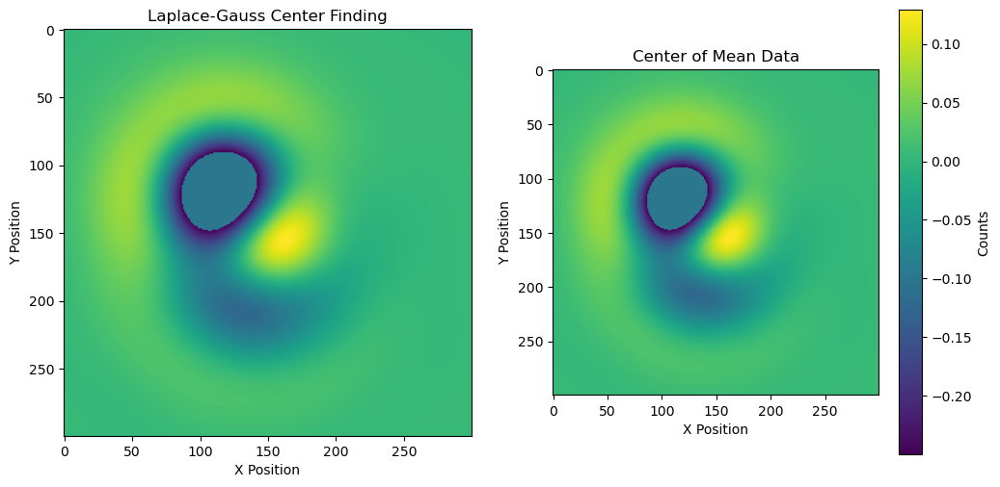

Rough Center: (476, 464)
486.2105263157895
471.7894736842105
0.8134441375732422


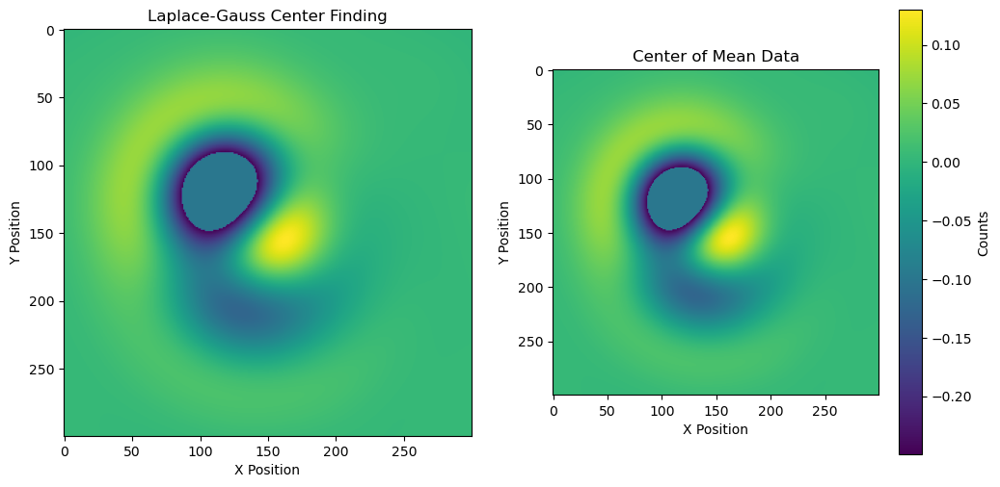

Rough Center: (470, 472)
477.875
480.875
0.8400628566741943


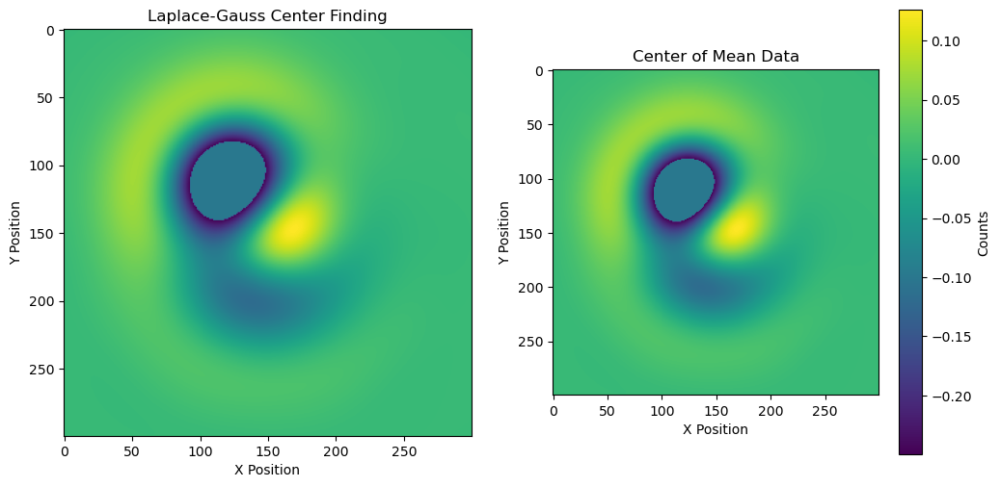

Rough Center: (468, 468)
476.8235294117647
481.4117647058824
0.8332388401031494


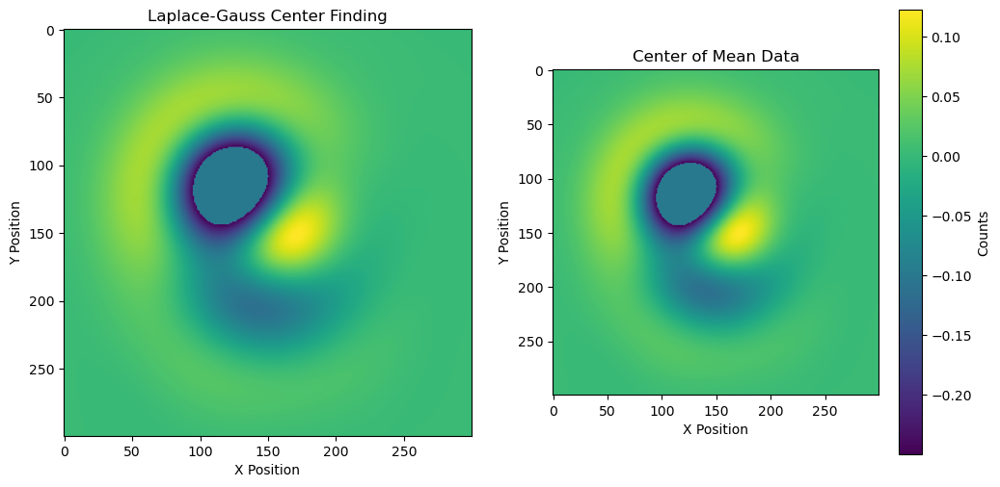

Rough Center: (474, 462)
484.5
470.625
0.8257961273193359


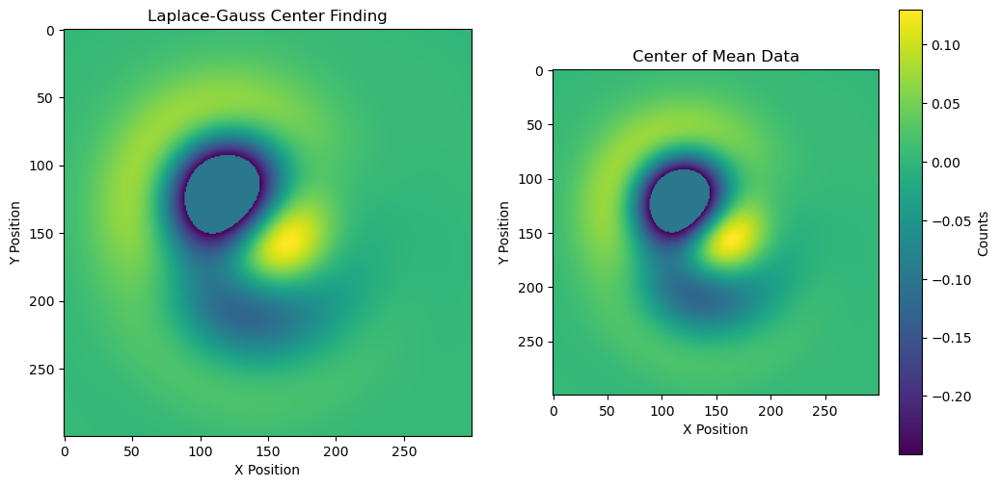

Rough Center: (474, 466)
484.76190476190476
477.42857142857144
0.941450834274292


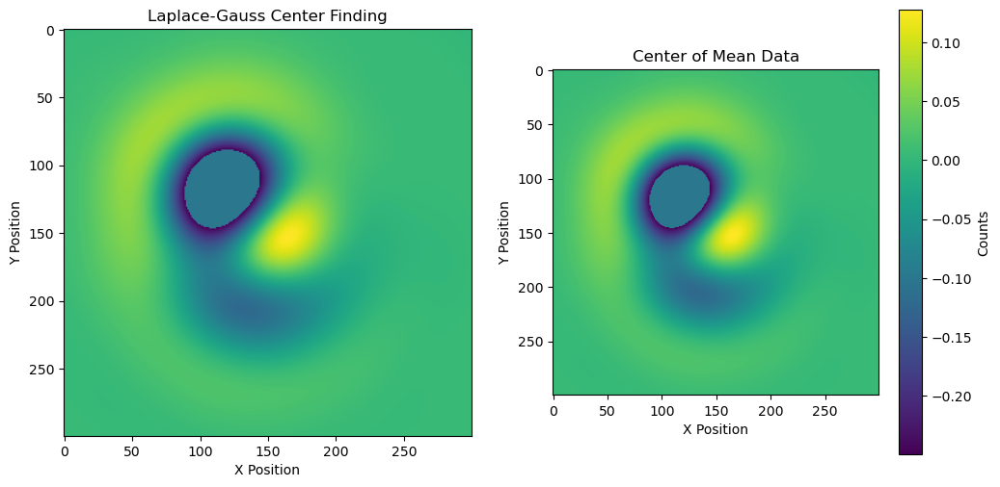

Rough Center: (466, 470)
474.5925925925926
484.6666666666667
0.8550257682800293


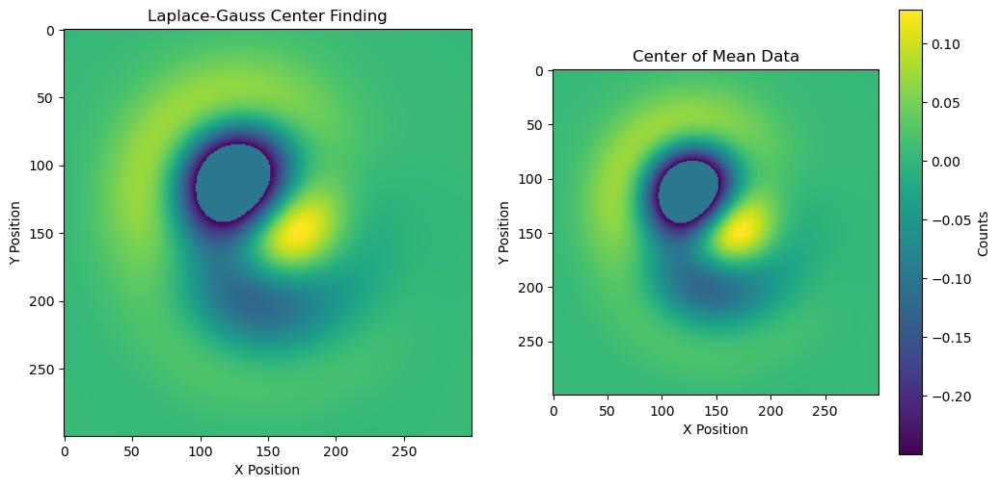

Rough Center: (468, 468)
479.82608695652175
480.95652173913044
0.8308470249176025


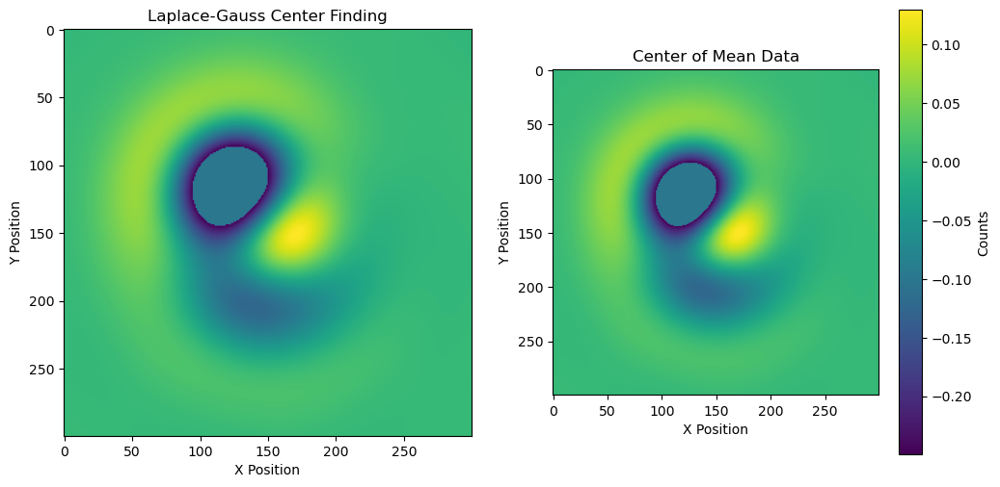

Rough Center: (470, 468)
481.57894736842104
478.3157894736842
0.8121681213378906


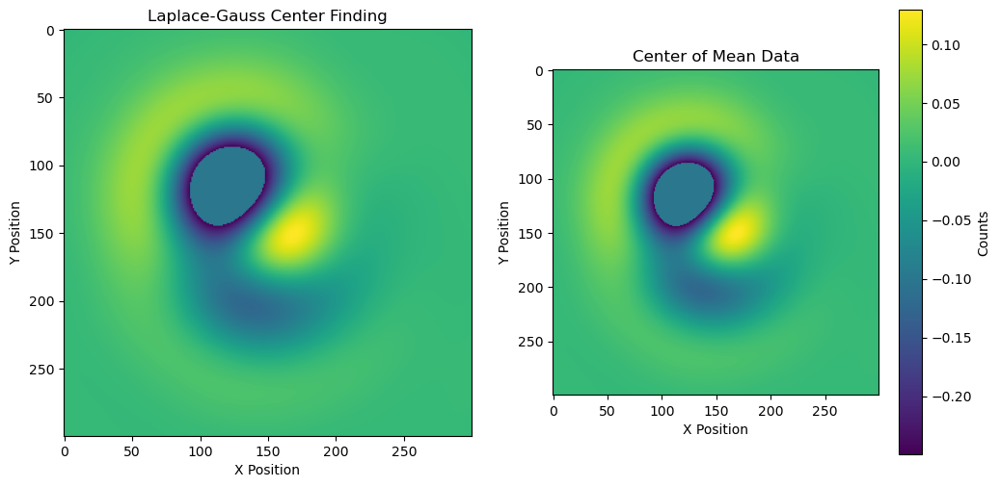

Rough Center: (476, 466)
488.0869565217391
476.60869565217394
0.843759298324585


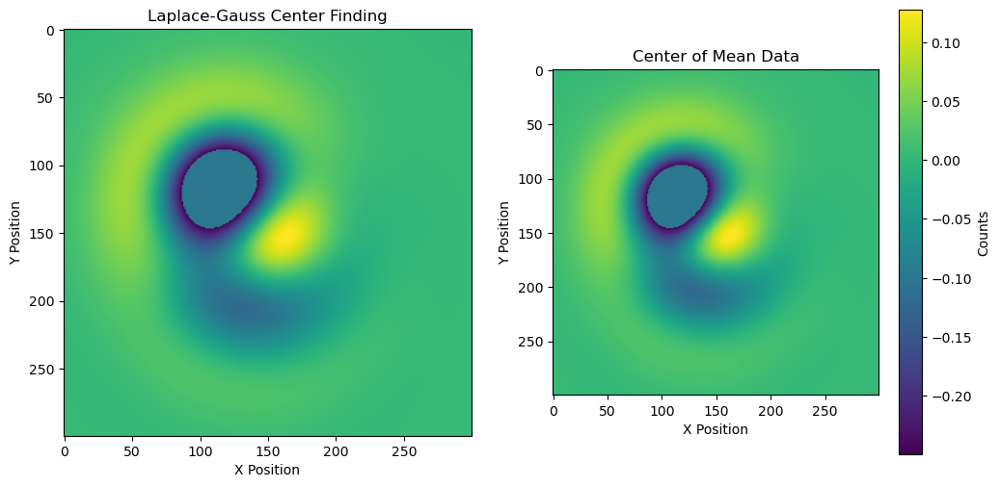

Rough Center: (472, 462)
486.2857142857143
470.85714285714283
1.0876350402832031


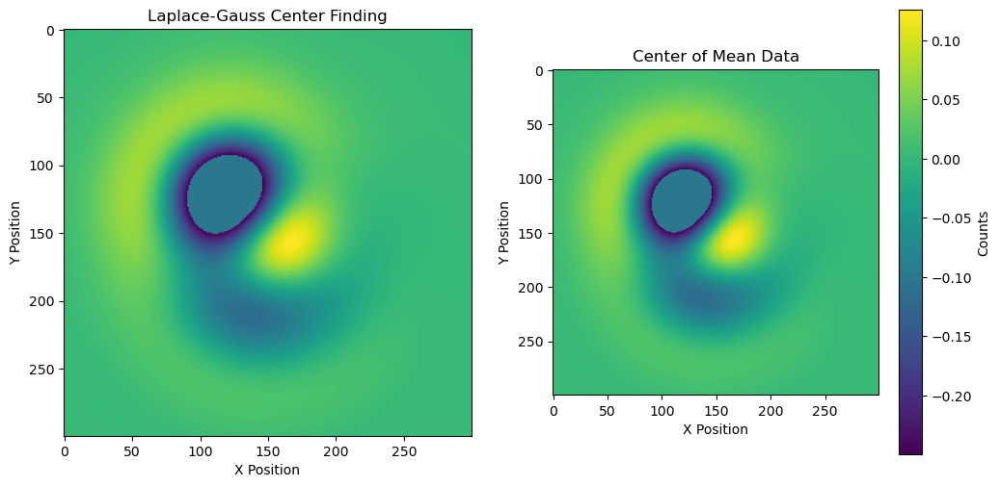

Rough Center: (472, 464)
483.4
476.4
1.126884937286377


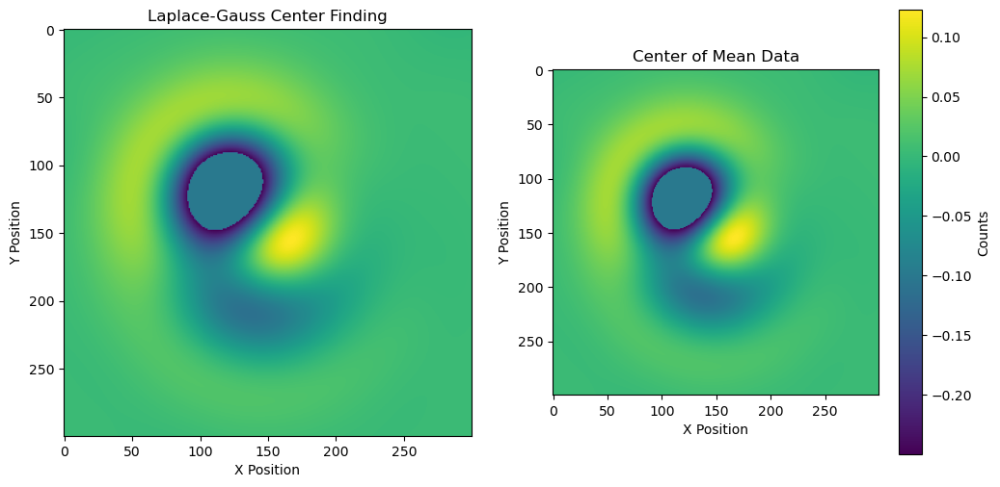

Rough Center: (474, 464)
486.9
471.0
0.8551759719848633


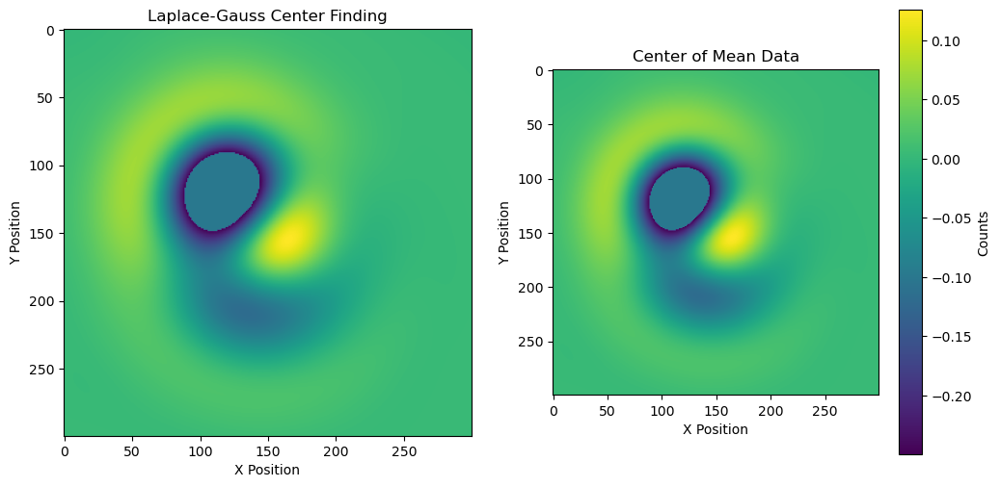

Rough Center: (464, 470)
481.7142857142857
482.57142857142856
0.8797767162322998


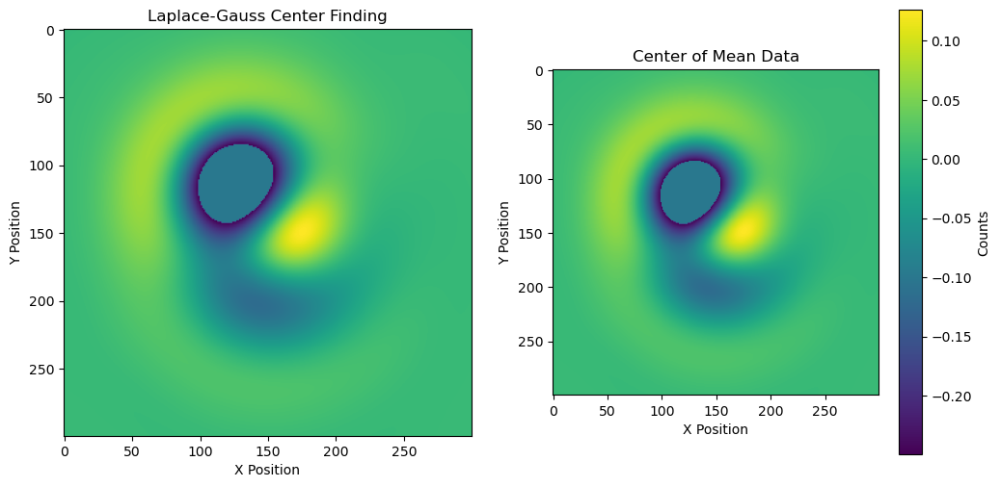

Rough Center: (476, 468)
485.30434782608694
476.2608695652174
0.8477659225463867


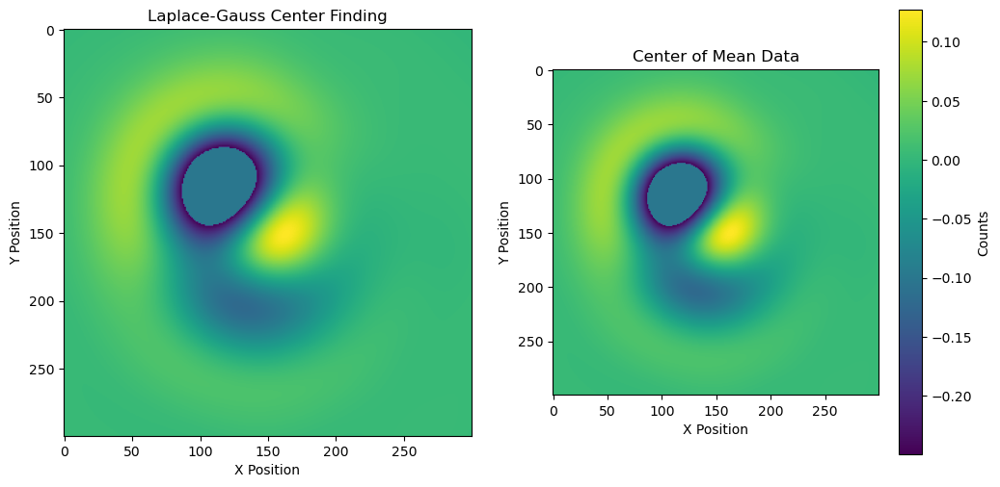

In [182]:

for i in range(len(mean_tester)):
    t0 = time.time()
    diffraction_image = mean_tester[i]
    diffraction_image = diffraction_image.astype(np.uint8)

    blurred_image = cv2.medianBlur(diffraction_image, ksize=51)

    normalized_image = cv2.normalize(blurred_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=5, maxRadius=100)

    if circles is not None:
        circles = np.round(circles[0]).astype(int)
        rough_center = (circles[0][0], circles[0][1])
    else:
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours) > 0:
            contour = max(contours, key=cv2.contourArea)
            moments = cv2.moments(contour)
            center_x = int(moments["m10"] / moments["m00"])
            center_y = int(moments["m01"] / moments["m00"])
            rough_center = (center_x, center_y)
        else:
            print("No contours found.")

    print("Rough Center:", rough_center)

    
    
    
    # PART 2- MODIFIES WORK
    delta = 150
    LaplaceGauss = scipy.ndimage.gaussian_laplace(mean_tester[i], 33)[rough_center[1] - delta : rough_center[1] + delta,rough_center[0] - delta : rough_center[0] + delta,]
    sigma = 3
    threshold = -0.25
    masked_coordinates = np.column_stack(np.where(LaplaceGauss < threshold))
    LaplaceGauss[LaplaceGauss < threshold] = -0.1

    LaplaceGauss.astype(np.uint8)
    normalized_image = cv2.normalize(LaplaceGauss, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=5, param1=30, param2=10, minRadius=5, maxRadius=100)

    if circles is not None:
        circles = np.round(circles[0, :]).astype(int)
        filtered_circles = []
        for (circle_x, circle_y, rad) in circles:
            is_center_in_mask = np.any((circle_x, circle_y) == masked_coordinates, axis=1)
            if not np.any(is_center_in_mask):
                filtered_circles.append((circle_x, circle_y, rad))
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        ax = axes[0]
        ax.imshow(LaplaceGauss)
        ax.set_title('Laplace-Gauss Center Finding')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        #for (x, y, r) in filtered_circles:
            #ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))
            
            
        distances = np.sqrt((np.array(filtered_circles)[:, 0] - (delta)) ** 2 +
                        (np.array(filtered_circles)[:, 1] - delta) ** 2)

        within_40_pixels_indices = np.where(distances < 40)[0]

        original_image_coordinates = np.array(filtered_circles)[within_40_pixels_indices] + np.array([rough_center[0] - delta, rough_center[1] - delta, 0])

        within_40_pixels_values = [mean_tester[i][int(y), int(x)] for (x, y, _) in original_image_coordinates]
        
        x_values = original_image_coordinates[:, 0]
        y_values = original_image_coordinates[:, 1]
        mean_x_values = np.mean(x_values)
        mean_y_values = np.mean(y_values)
        print(mean_x_values)
        print(mean_y_values)
        #ax.add_patch(plt.Circle((mean_x_values, mean_y_values), 10, color='orange', fill=True, linewidth=1))
        # Add the orange circle to axes[1]
    ax = axes[1]
    ax.add_patch(plt.Circle((mean_x_values, mean_y_values), 10, color='orange', fill=True, linewidth=1))

    print(time.time() - t0)
    ax = axes[1]
    im = ax.imshow(LaplaceGauss)
    ax.set_title('Center of Mean Data')
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    plt.colorbar(im, ax=ax, label='Counts')
    plt.draw()
    plt.show()


(466, 468)
477 481
0.680182933807373


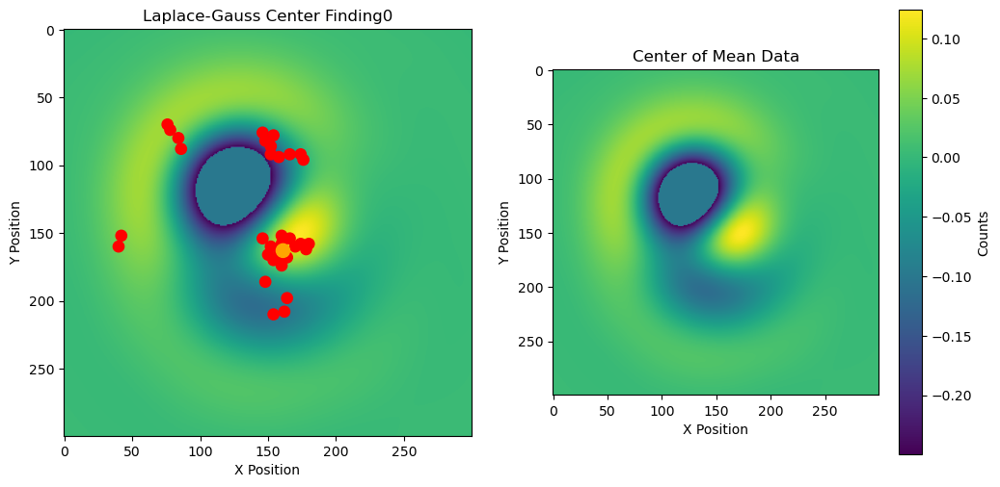

(468, 474)
477 483
0.5707392692565918


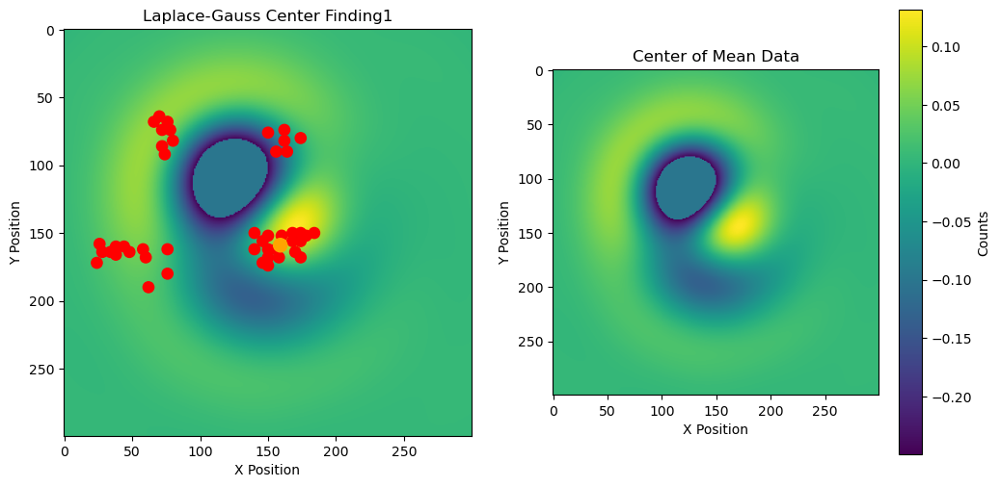

(474, 470)
483 478
0.5247578620910645


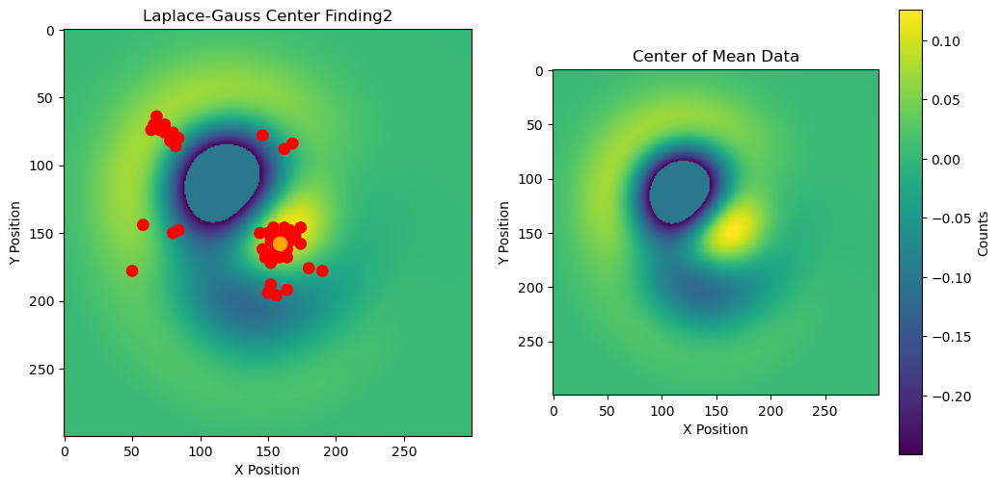

(468, 462)
482 474
0.5410208702087402


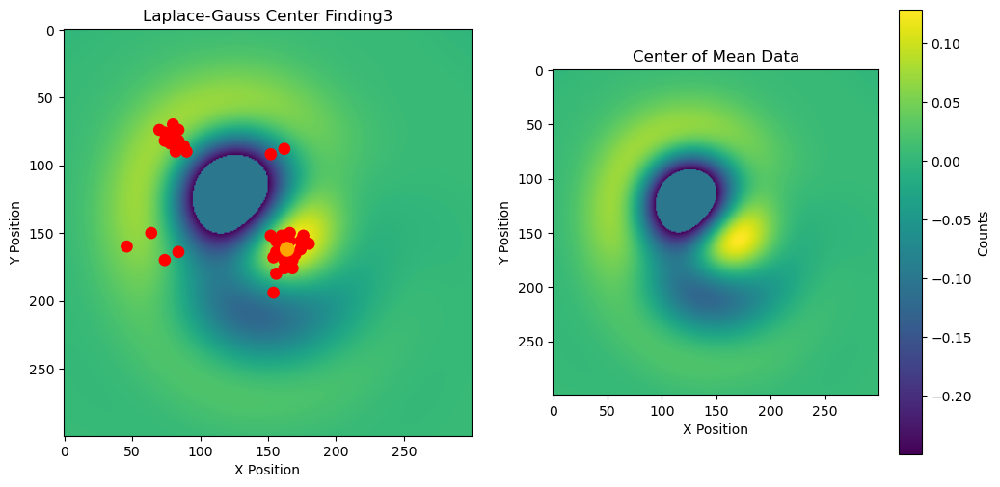

(478, 470)
483 476
0.5161128044128418


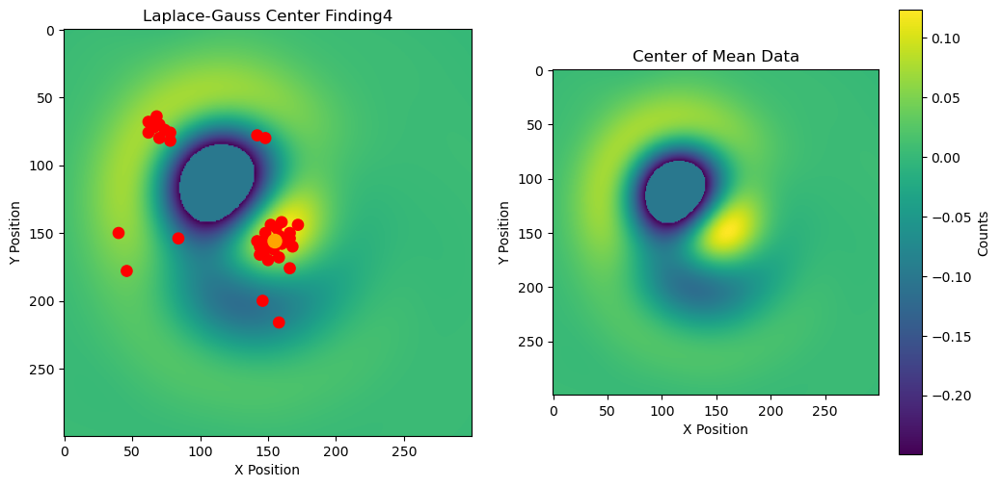

(478, 470)
485 473
0.5364658832550049


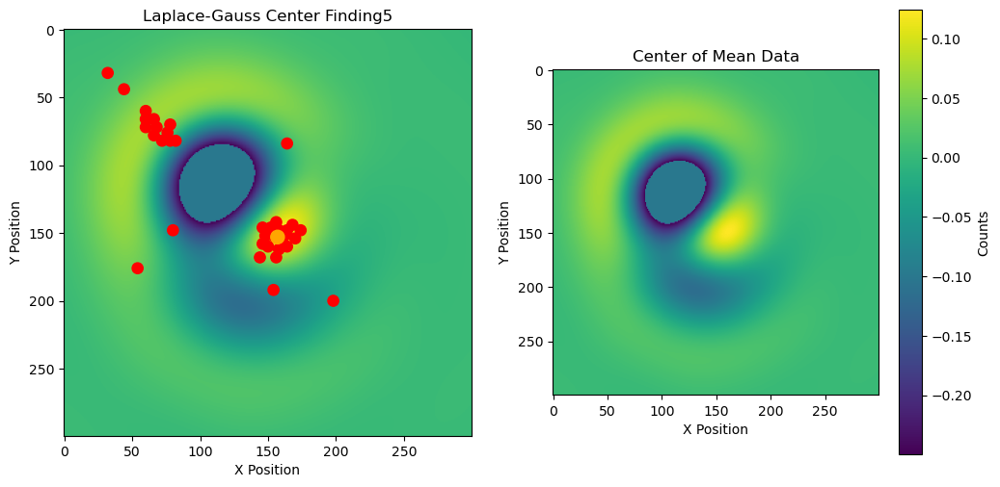

(476, 464)
485 475
0.519888162612915


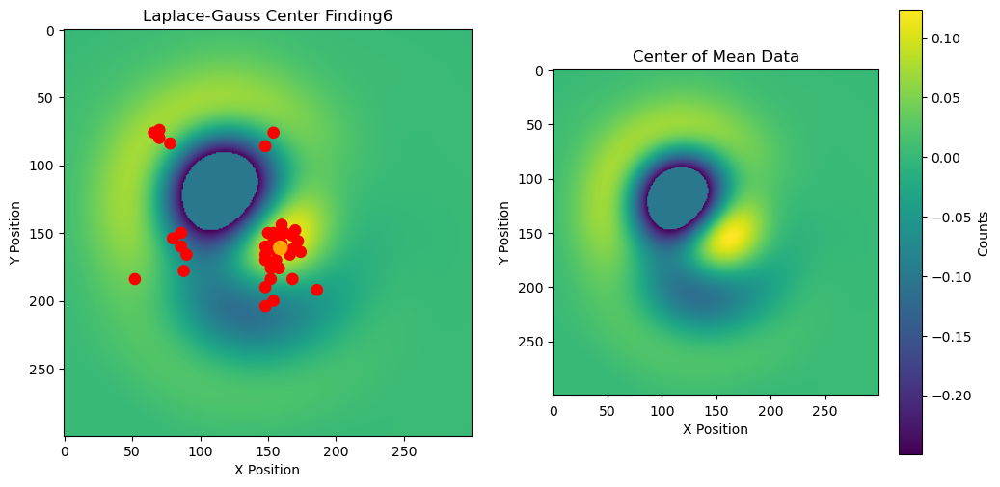

(470, 468)
481 478
0.7719910144805908


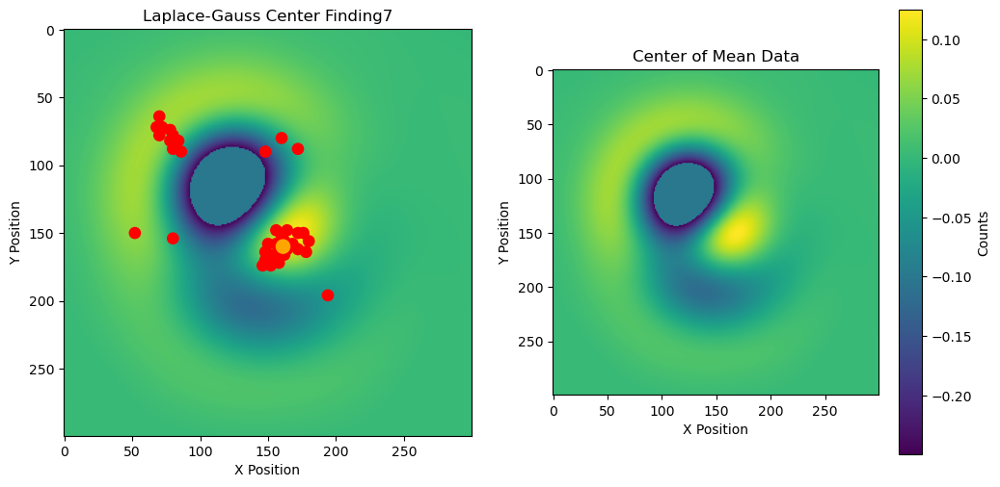

(476, 470)
483 477
0.5479540824890137


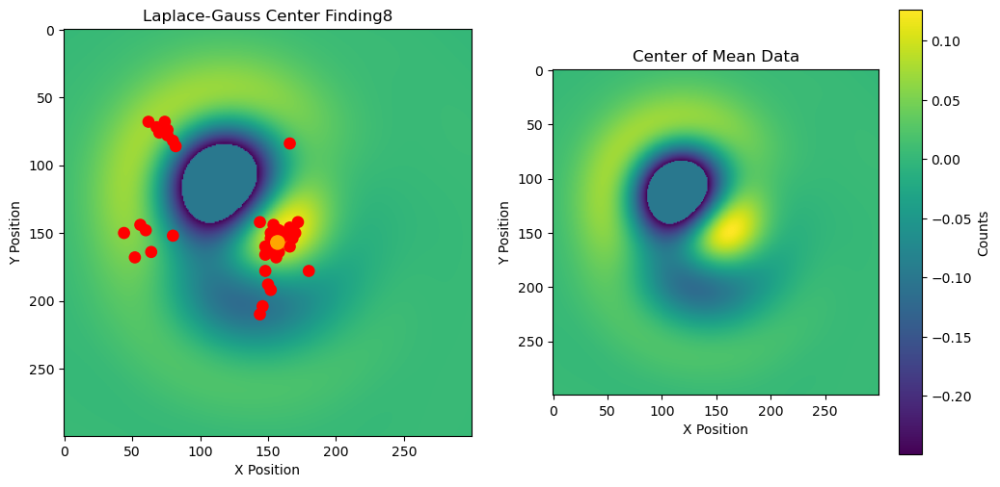

(474, 464)
487 478
0.5407030582427979


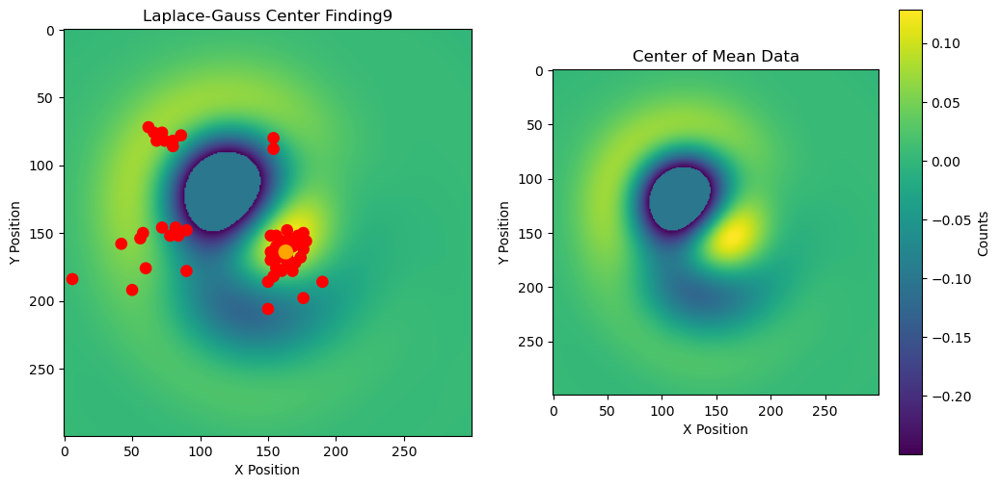

(470, 472)
479 481
0.522860050201416


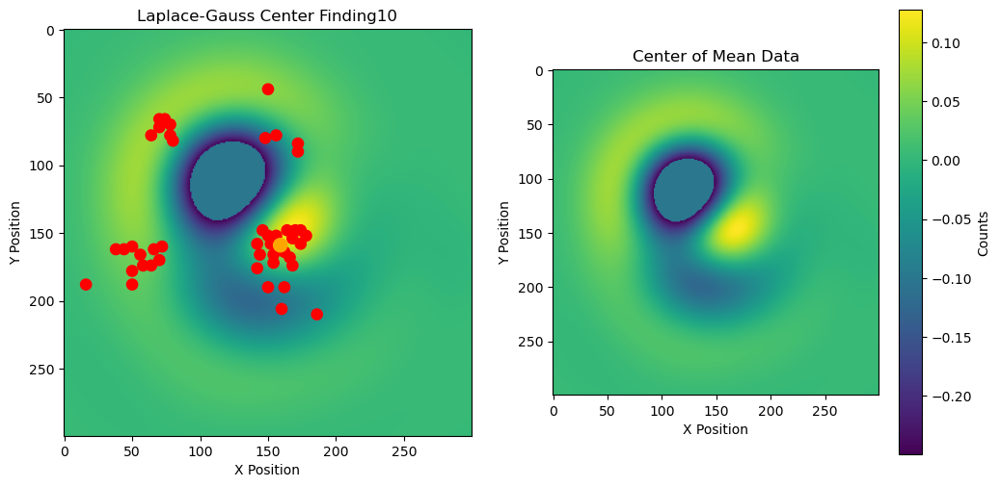

(480, 527)
484 495
0.5184550285339355


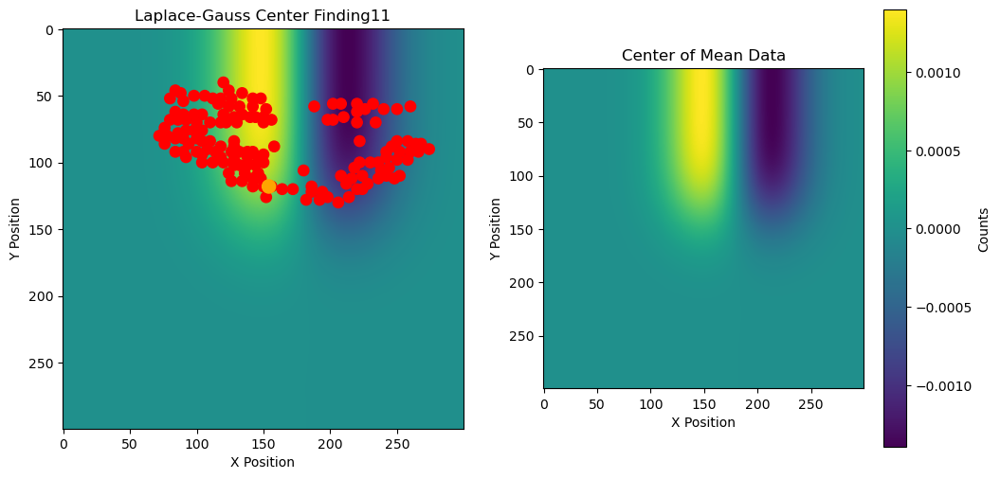

(464, 474)
474 488
0.5223658084869385


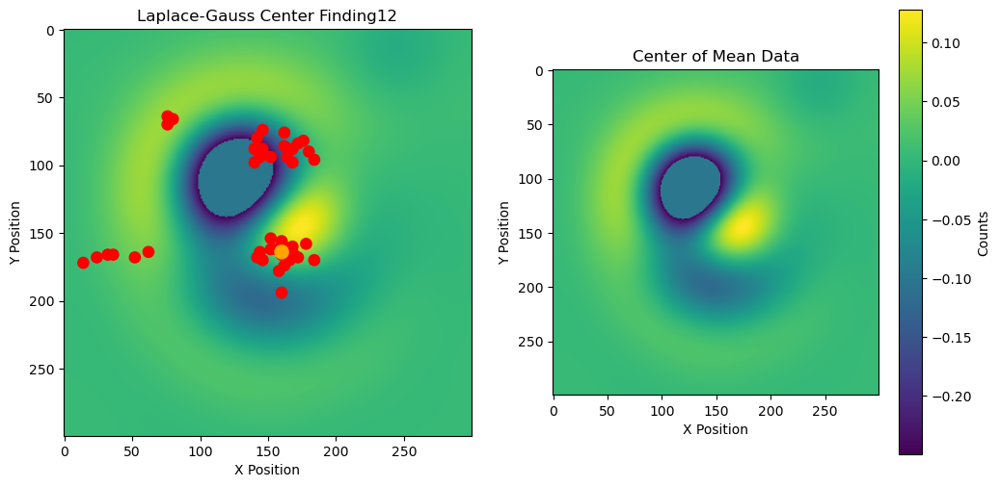

(470, 462)
485 474
0.5196149349212646


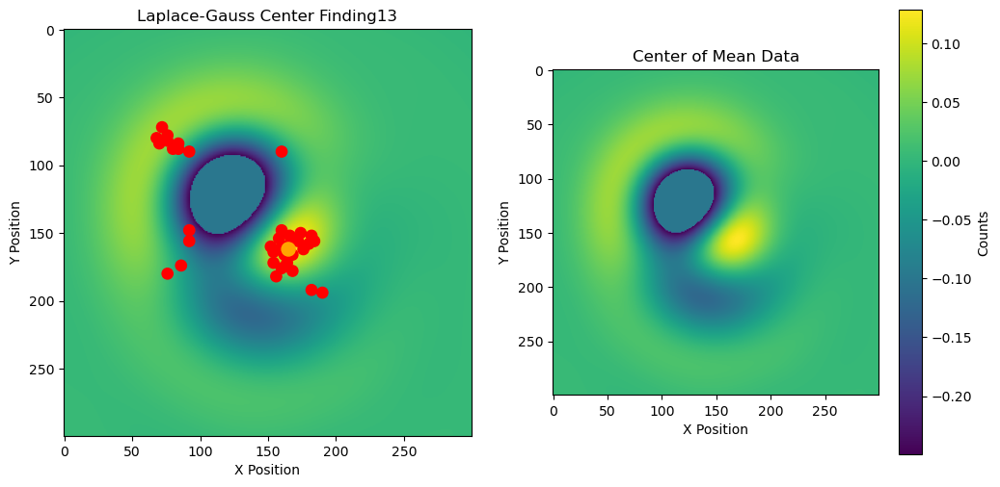

(468, 468)
483 478
0.5178377628326416


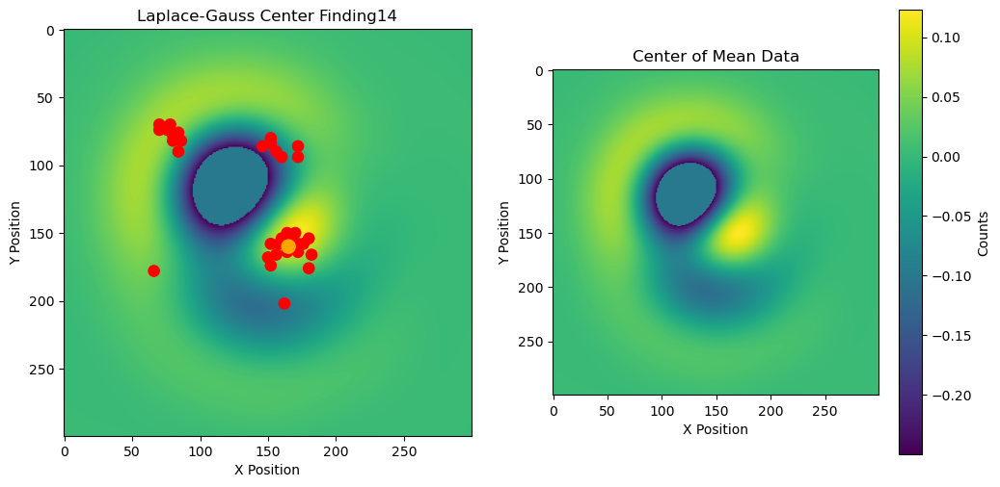

(468, 472)
475 482
0.5127589702606201


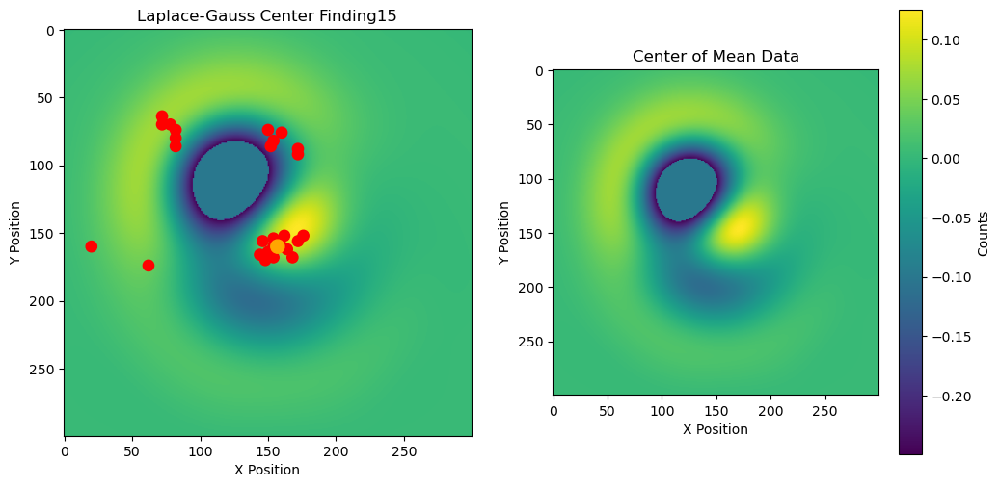

(464, 470)
472 485
0.5102992057800293


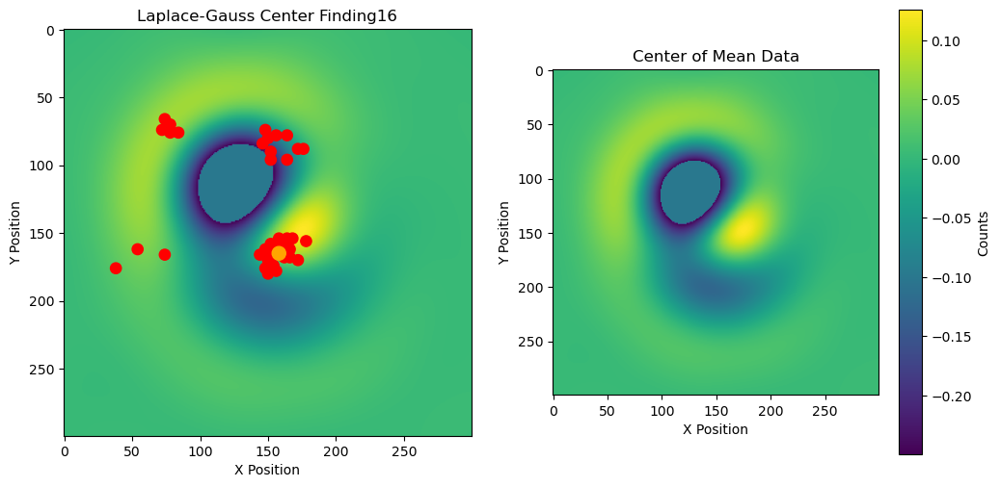

(464, 474)
472 490
0.5493612289428711


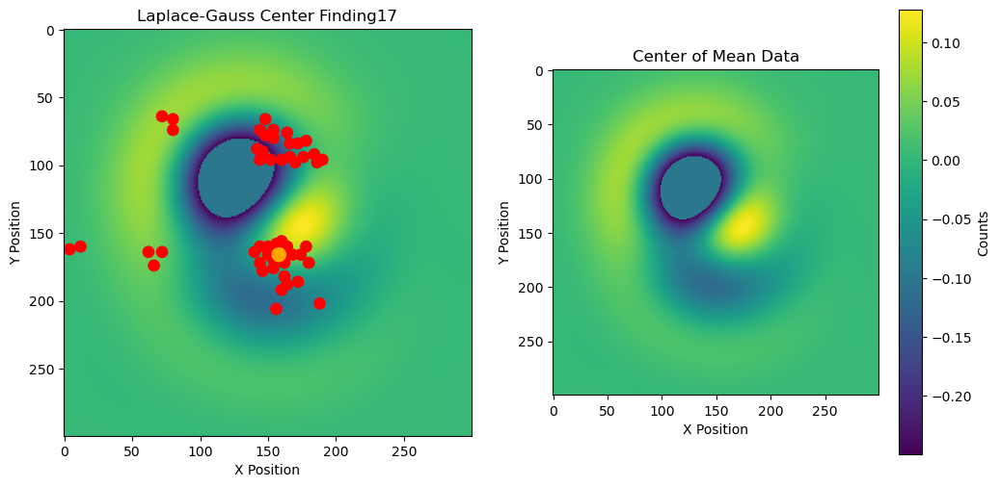

(476, 464)
488 474
0.5386738777160645


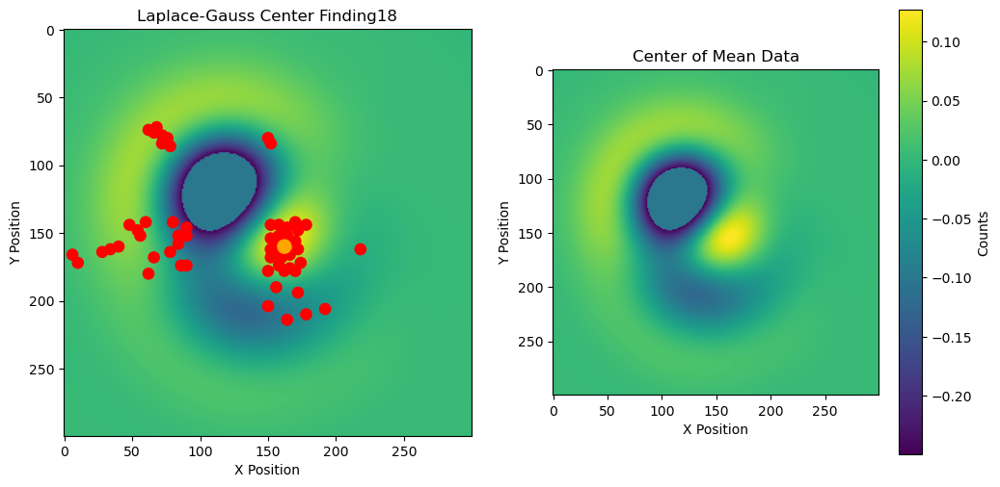

(470, 470)
481 482
0.5041840076446533


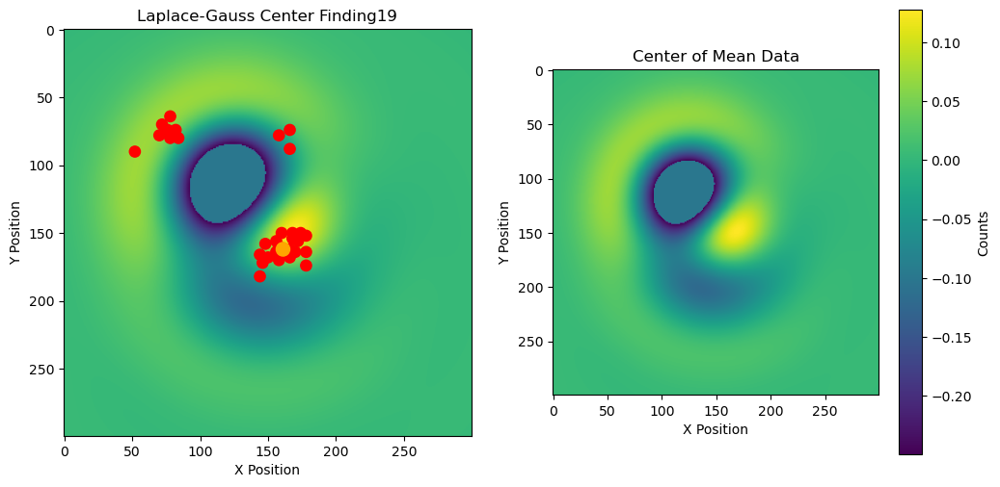

(474, 468)
482 475
0.5039811134338379


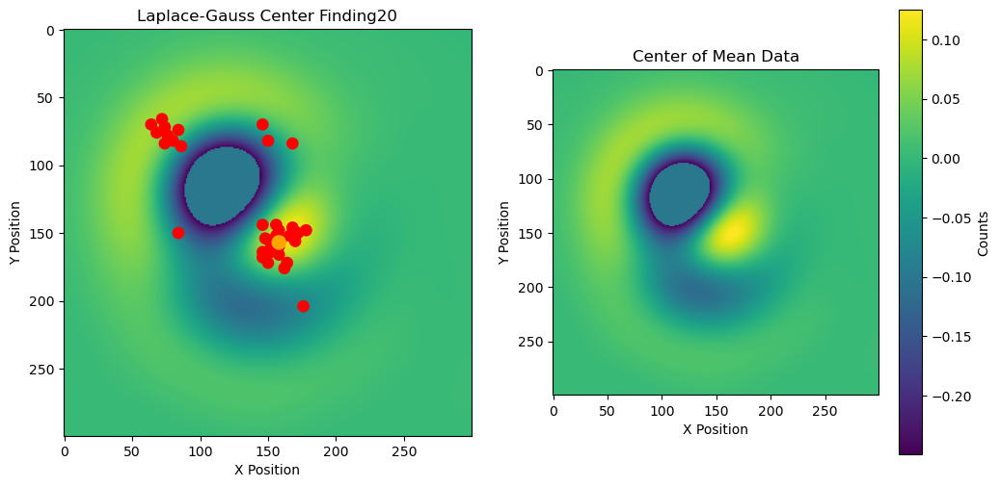

(476, 462)
488 470
0.5242390632629395


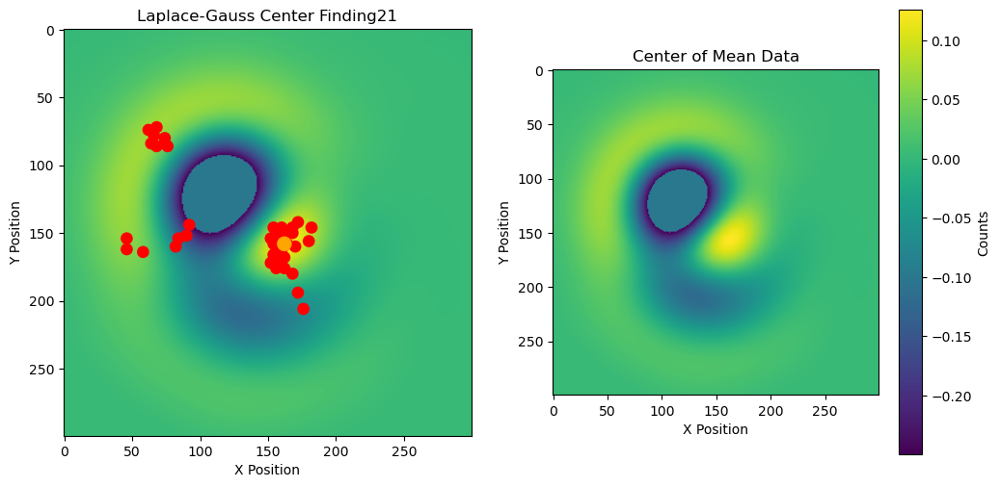

(476, 464)
488 471
0.5088069438934326


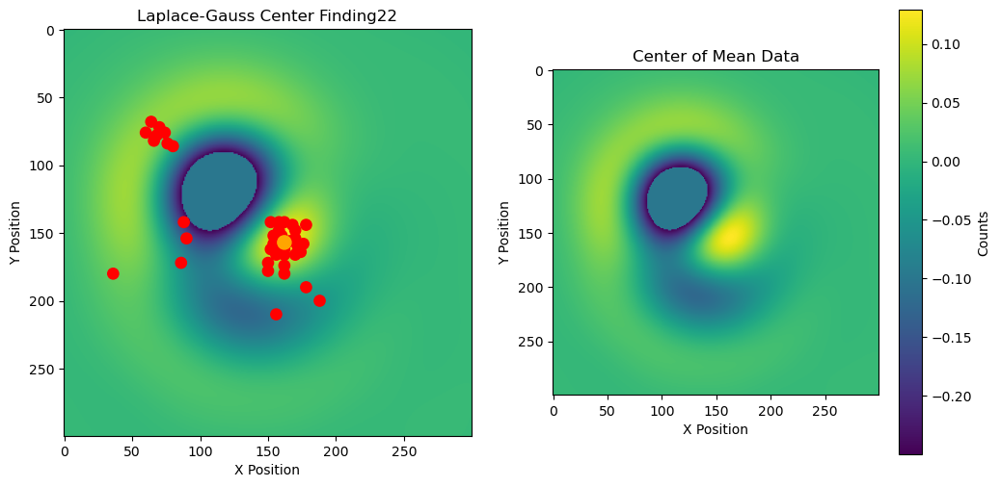

(476, 464)
486 471
0.5600051879882812


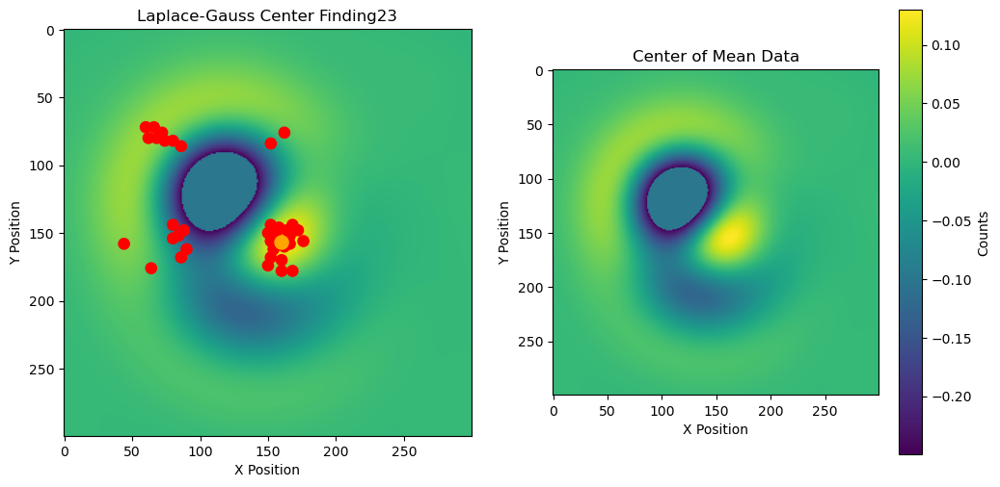

(470, 472)
477 480
0.5231800079345703


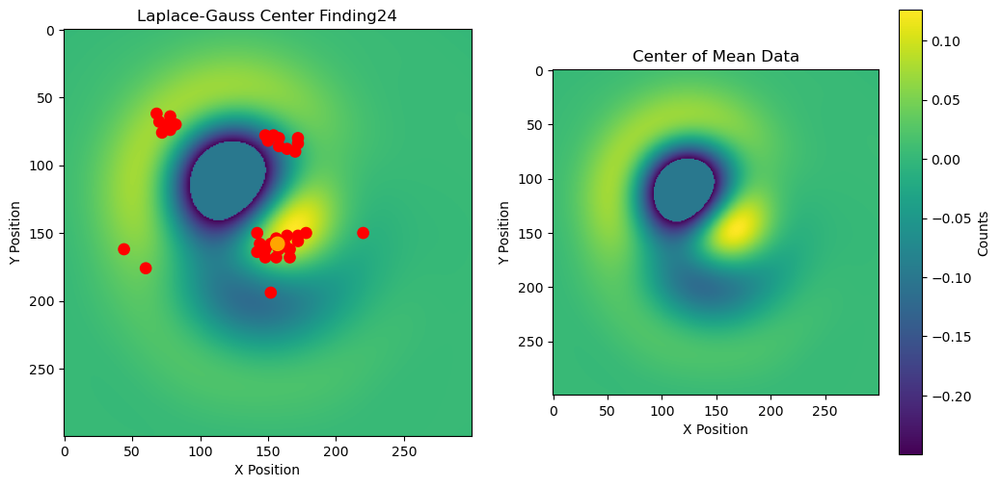

(468, 468)
476 481
0.5238580703735352


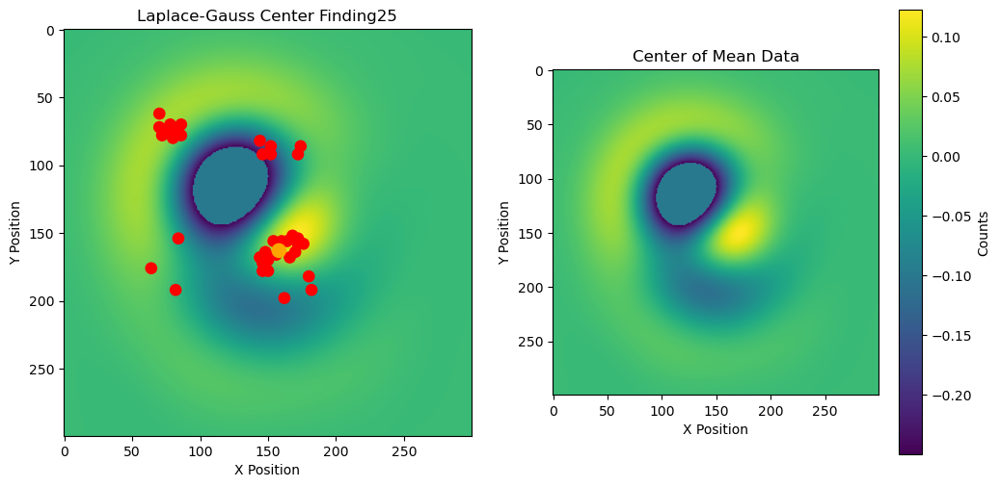

(474, 462)
484 470
0.53513503074646


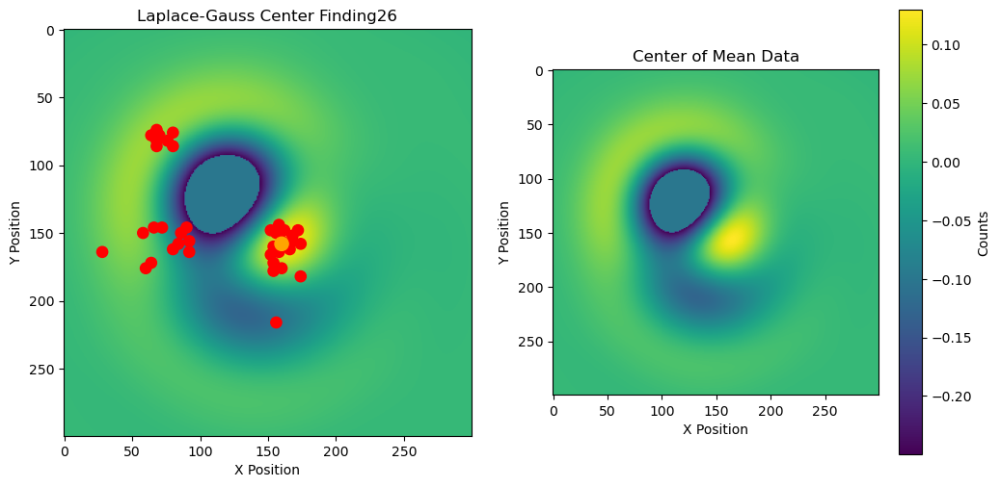

(474, 466)
484 477
0.5141329765319824


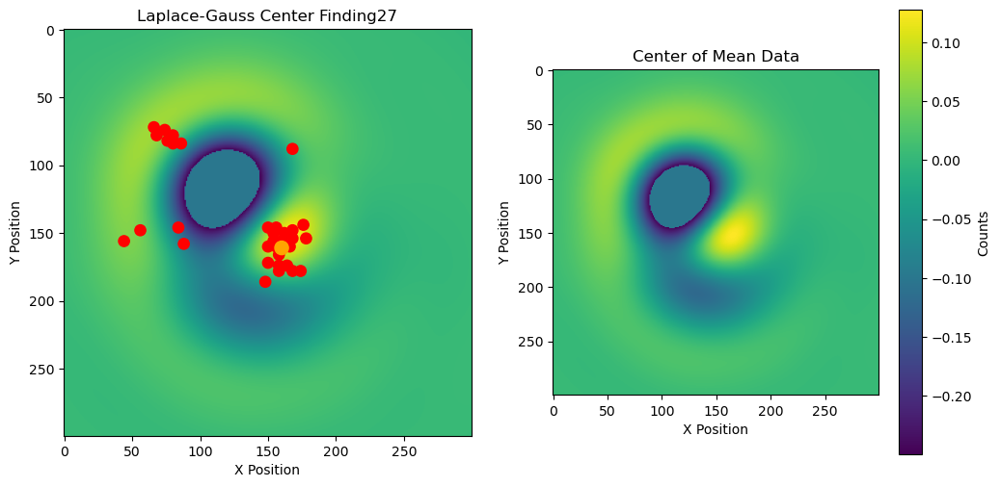

(466, 470)
474 484
0.528144121170044


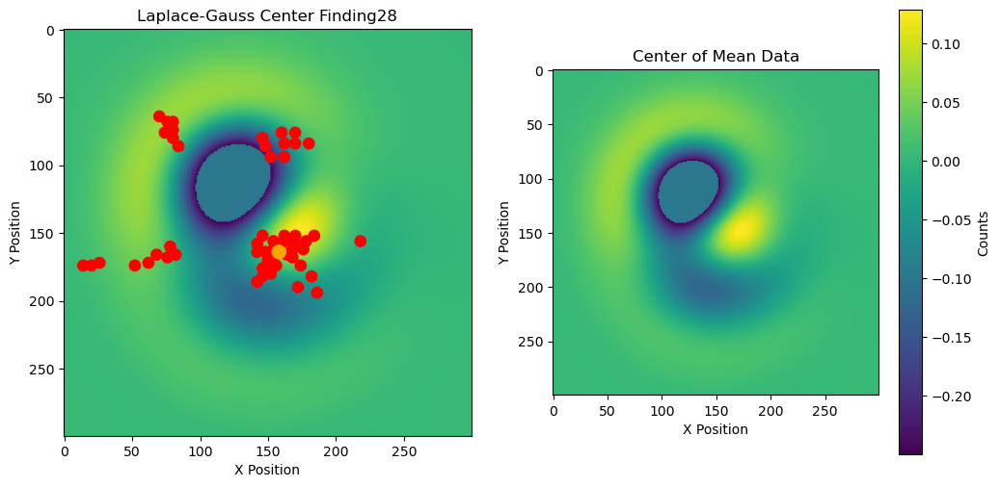

(468, 468)
479 480
0.5138149261474609


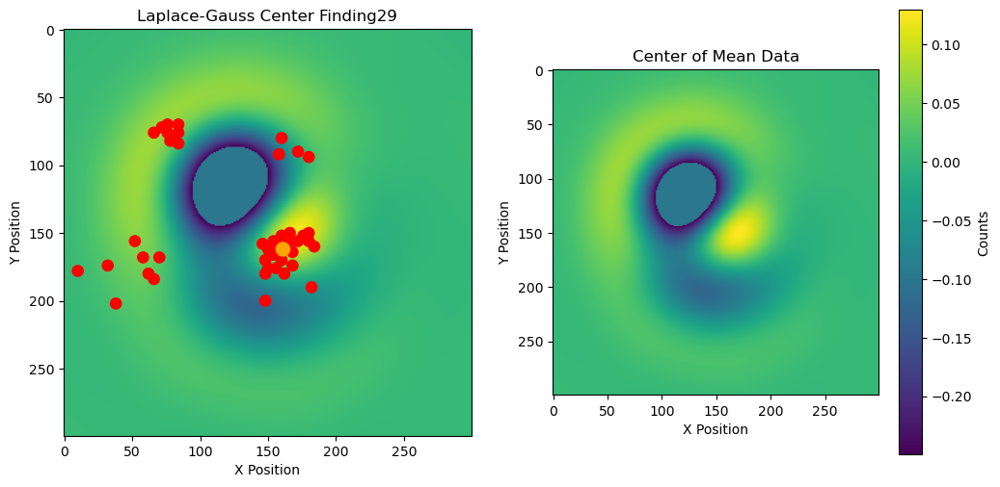

(470, 468)
481 478
0.5652039051055908


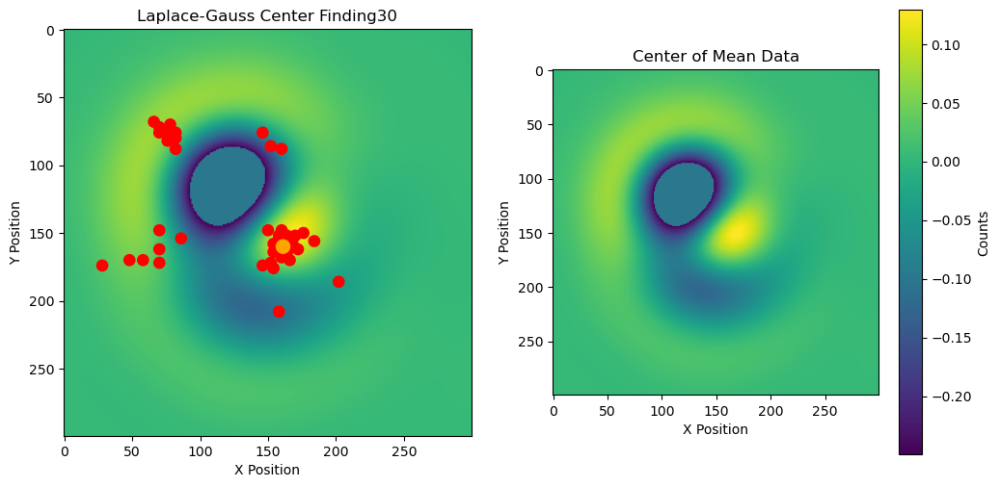

(476, 466)
488 476
0.5323591232299805


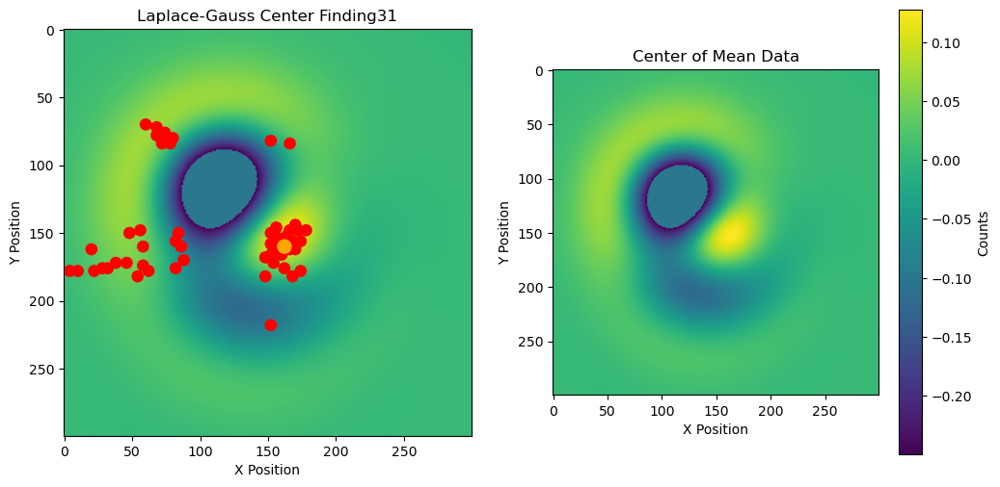

(472, 462)
486 470
0.5212759971618652


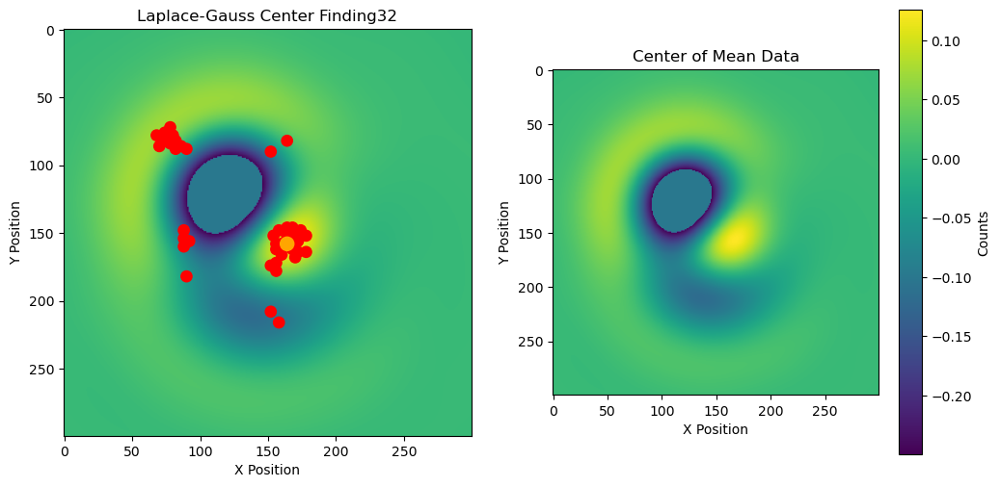

(472, 464)
483 476
0.5473670959472656


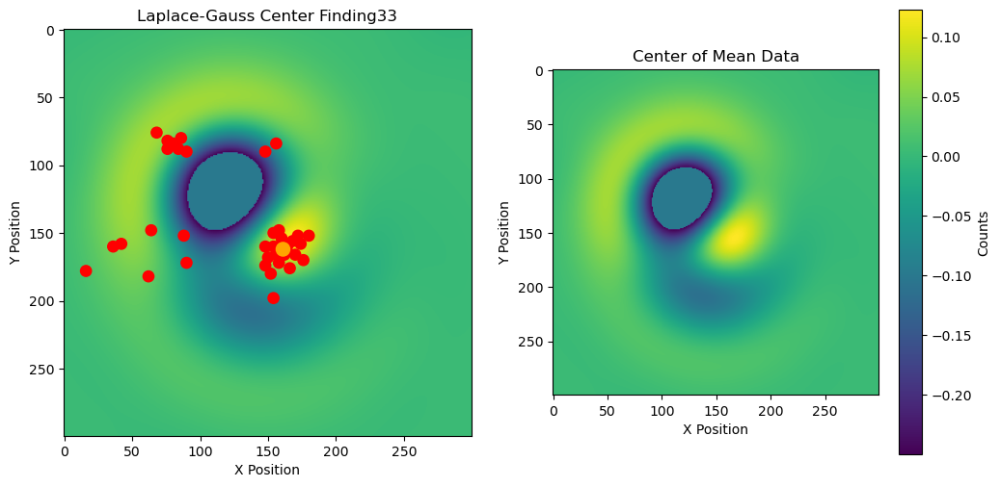

(474, 464)
486 471
0.5418329238891602


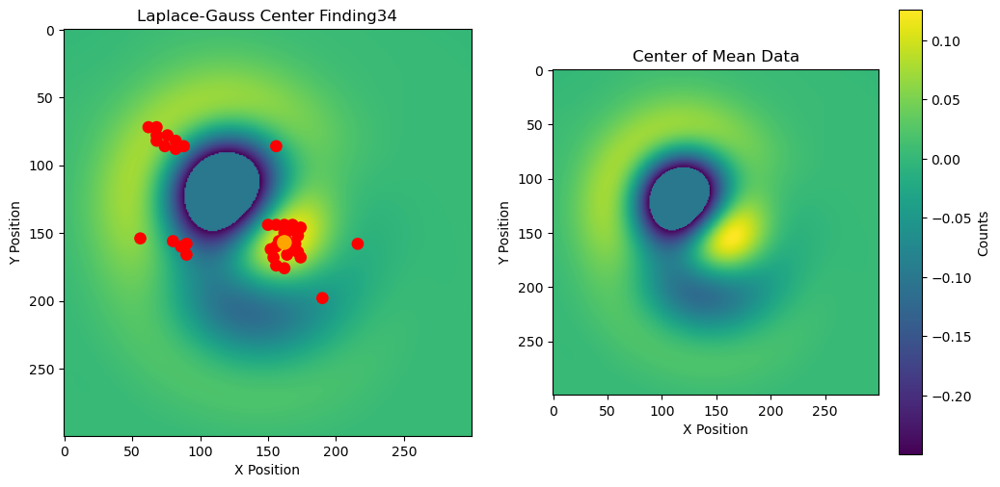

(464, 470)
481 482
0.523345947265625


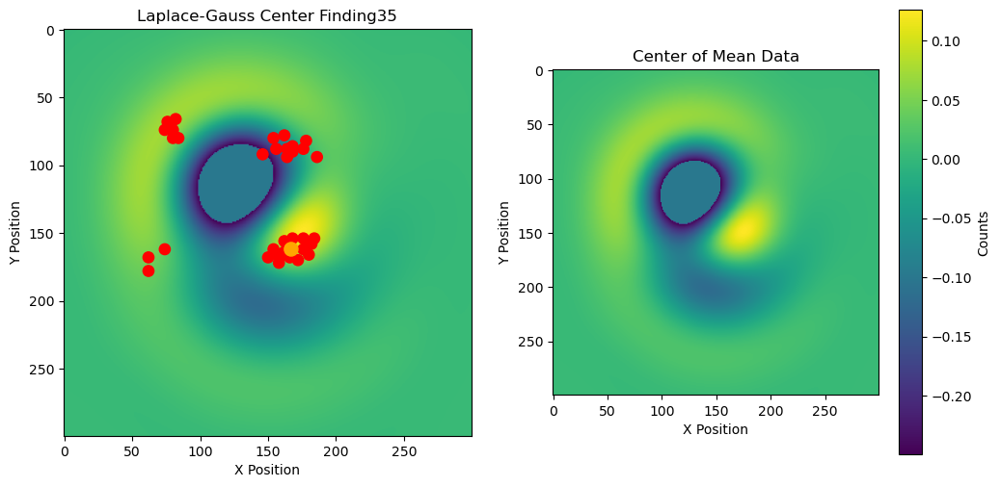

(476, 468)
485 476
0.531851053237915


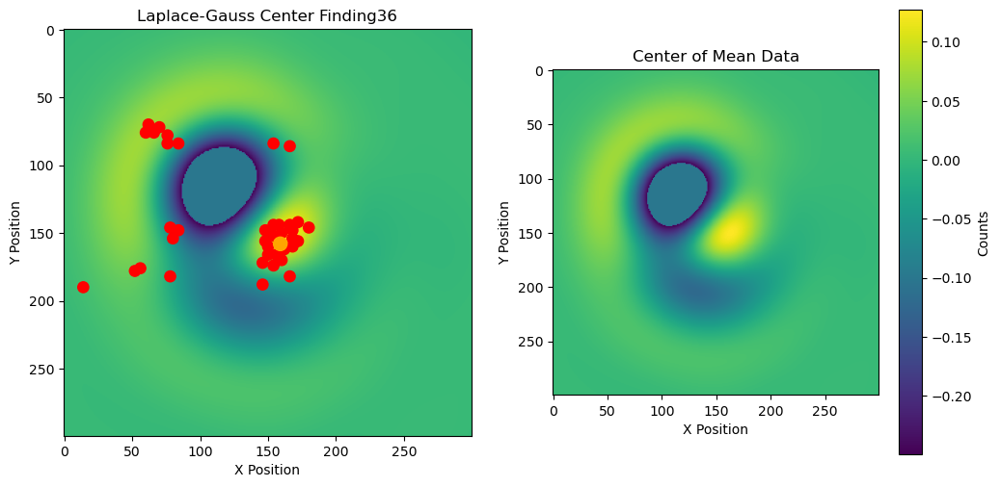

In [207]:
import time
import numpy as np
import cv2
import scipy.ndimage
import matplotlib.pyplot as plt

for i in range(len(mean_tester)):
    t0 = time.time()
    diffraction_image = mean_tester[i]
    diffraction_image = diffraction_image.astype(np.uint8)

    blurred_image = cv2.medianBlur(diffraction_image, ksize=51)

    normalized_image = cv2.normalize(blurred_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=5, maxRadius=100)

    if circles is not None:
        circles = np.round(circles[0]).astype(int)
        rough_center = (circles[0][0], circles[0][1])
    else:
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours) > 0:
            contour = max(contours, key=cv2.contourArea)
            moments = cv2.moments(contour)
            center_x = int(moments["m10"] / moments["m00"])
            center_y = int(moments["m01"] / moments["m00"])
            rough_center = (center_x, center_y)
        else:
            print("No contours found.")

    print(rough_center)

    # PART 2- MODIFIES WORK
    delta = 150
    LaplaceGauss = scipy.ndimage.gaussian_laplace(mean_tester[i], 33)[rough_center[1] - delta: rough_center[1] + delta,
                                                                  rough_center[0] - delta: rough_center[0] + delta, ]
    sigma = 3
    threshold = -0.25
    masked_coordinates = np.column_stack(np.where(LaplaceGauss < threshold))
    LaplaceGauss[LaplaceGauss < threshold] = -0.1

    LaplaceGauss.astype(np.uint8)
    normalized_image = cv2.normalize(LaplaceGauss, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    circles = cv2.HoughCircles(normalized_image, cv2.HOUGH_GRADIENT, dp=1, minDist=5, param1=30, param2=10, minRadius=5, maxRadius=100)

    if circles is not None:
        circles = np.round(circles[0, :]).astype(int)
        filtered_circles = []
        for (circle_x, circle_y, rad) in circles:
            is_center_in_mask = np.any((circle_x, circle_y) == masked_coordinates, axis=1)
            if not np.any(is_center_in_mask):
                filtered_circles.append((circle_x, circle_y, rad))

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        ax = axes[0]
        ax.imshow(LaplaceGauss)
        ax.set_title(f'Laplace-Gauss Center Finding{i}')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        for (x, y, r) in filtered_circles:
            ax.add_patch(plt.Circle((x, y), 4, color='red', fill=True, linewidth=1))

        distances = np.sqrt((np.array(filtered_circles)[:, 0] - (delta)) ** 2 +
                            (np.array(filtered_circles)[:, 1] - delta) ** 2)

        within_40_pixels_indices = np.where(distances < 40)[0]

        original_image_coordinates = np.array(filtered_circles)[within_40_pixels_indices] + np.array(
            [rough_center[0] - delta, rough_center[1] - delta, 0])

        within_40_pixels_values = [mean_tester[i][int(y), int(x)] for (x, y, _) in original_image_coordinates]

        x_values = original_image_coordinates[:, 0]
        y_values = original_image_coordinates[:, 1]
        mean_x_values = int(np.mean(x_values))
        mean_y_values = int(np.mean(y_values))
        print(mean_x_values, mean_y_values)
        ax = axes[0]
        ax.add_patch(plt.Circle((mean_x_values - (rough_center[0] - delta), mean_y_values - (rough_center[1] - delta)), 5, color='orange', fill=True, linewidth=1))


        print(time.time() - t0)
        ax = axes[1]
        im = ax.imshow(LaplaceGauss)
        ax.set_title('Center of Mean Data')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        plt.colorbar(im, ax=ax, label='Counts')
        plt.show()

# Add this line outside the loop to ensure the plot remains open after the loop ends
plt.show()


In [ ]:
# Notes from matlab code

# findCenter finds the center of diffraction images by fitting circles to
# pixels of identical intensity. Found centers are used as a start guess
# for another center finding iteration. Iterations stop when convergence is
# reached or the maximum number of iterations is reached.
#
# inputs:
# img - diffraction image
# cIsoRng - range of radii to which circles are fit (radii between 150 and 
# 250 are ideal)
# dbg - set to 1 to get output images for debug purposes
#
# outputs:
# cMean - mean of centers found by over the range of radii
# cMean - standard deviation of centers found by over the range of radii

In [158]:

from sklearn.cluster import KMeans
from skimage import io, color
from scipy.optimize import curve_fit


In [172]:
# num_clusters = 10
# kmeans = KMeans(n_clusters=num_clusters, random_state=0)
# print(kmeans.fit(mean_tester[11]))

# labels = kmeans.labels_

# clustered_img = np.zeros_like(mean_tester[11])


# for i in range(num_clusters):
#     cluster_mask = labels == i
#     cluster_img = mean_tester[11].copy()
#     cluster_img[~cluster_mask] = 0
#     clustered_img += cluster_img

# centers = []
# for i in range(num_clusters):
#     cluster_mask = clustered_img == i
#     cluster_y, cluster_x = np.where(cluster_mask)
#     print(cluster_y)
#     xy = np.column_stack((cluster_x, cluster_y))
#     print(xy)
#     c_x, c_y, r = circ_fit(xy)
#     centers.append((c_x, c_y))


KMeans(n_clusters=10, random_state=0)
[ 511  512  513  514  515  516  517  518  519  520  521  522  523  524
  525  526  527  528  529  530  531  532  533  534  535  536  537  538
  539  540  541  542  543  544  545  546  547  548  549  550  551  552
  553  554  555  556  557  558  559  560  561  562  563  564  565  566
  567  568  569  570  571  572  573  574  575  576  577  578  579  580
  581  582  583  584  585  586  587  588  589  590  591  592  593  594
  595  596  597  598  599  600  601  602  603  604  605  606  607  608
  609  610  611  612  613  614  615  616  617  618  619  620  621  622
  623  624  625  626  627  628  629  630  631  632  633  634  635  636
  637  638  639  640  641  642  643  644  645  646  647  648  649  650
  651  652  653  654  655  656  657  658  659  660  661  662  663  664
  665  666  667  668  669  670  671  672  673  674  675  676  677  678
  679  680  681  682  683  684  685  686  687  688  689  690  691  692
  693  694  695  696  697  698  699  70

/Users/caidanm612/opt/anaconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


ValueError: `ydata` must not be empty!

In [ ]:
find_center(mean_tester[113], (10,150))

Center converged to (0.00, 0.00) after 1 iterations


(array([0., 0.]), array([0., 0.]))

# Remove Radial Outliers

In [ ]:
def azimuthal_integration(data_array, center, correction_factor=3): #threshold value
    """
    Performs azimuthal integration over the data set, removing radial outliers as it performs the integration. 
    Function coverts to polar coordinates, the calculates the mean and std at every radial distance (distances are
    previously round to the nearest positive integer and grouped by integer). Returns the azimuthal integration data
    and the azimuthal error.
    
    Arguments:
    
    data_array (np.ndarray): Two dimensional numpy array containing the diffraction image. 
    center (tuple): Tuple containing the integer coordinates of the image center.
    correction_factor (int, optional): Number of standard deviations set as threshold. Preset to 3.
    
    Return: (azi_dat, azi_err)
    
    azi_dat (np.ndarray): Array containing the integrated data.
    azi_err (np.ndarray): Array containing the error of the integrated data.
    
    Example:
    
    sample_array = np.random.rand(100,100)
    center = (40,40)
    
    >>> azimuthal_integration(sample_array, center, correction_factor = 2)
        azi_dat, azi_err
    """
    
    assert isinstance(data_array, np.ndarray), "data_array must be a NumPy array."
    assert len(data_array.shape) == 2, "data_array must be a 2D array."
    if not isinstance(center, tuple) or len(center) != 2 or type(center[0]) != int or type(center[1]) != int:
        raise ValueError("center must be a tuple of length 2 containing the x and y coordinates (int) of the image center.")
    if not isinstance(correction_factor, (int,float)) or correction_factor <= 0:
        raise TypeError("Correction_factor must be a positive float or integer")
    
    x_mat, y_mat = np.meshgrid(np.arange(0,data_array.shape[1],1)-center[1],np.arange(0,data_array.shape[0],1)-center[0])
    #rmat, _ = cart2pol(xmat, ymat)
    
    r_mat = np.sqrt(x_mat**2 + y_mat**2)
    #phi = np.arctan2(y_mat,x_mat)
                               
    rmat = np.around(r_mat)
    data_array = data_array.astype(float)
    data_array[data_array==0] = np.nan
    x_length = int(np.amax([np.amax(abs(x_mat)),np.amax(abs(y_mat))]))
    azi_dat = np.zeros(x_length)
    azi_err = np.copy(azi_dat)
    for i in range(x_length):
        roi = data_array[r_mat==int(i+1)].astype(float)
        #print(roi)
        if len(roi)==0:
            break
        std = np.nanstd(roi)
        idxx = np.logical_and(roi <= np.nanmean(roi)+correction_factor*std,roi >=np.nanmean(roi)-correction_factor*std)
        idxx = util.invert(idxx)
        roi[idxx] = np.nan
        
        azi_dat[i] = np.nanmean(roi)
        azi_err[i] = np.nanstd(roi)/np.sqrt(abs(np.nansum(roi)))
    return azi_dat, azi_err

azi_dat, azi_err = azimuthal_integration(ring_mask_data, (433, 440))

plt.plot(azi_dat)
plt.title("Radially Averaged GUED Data")
plt.xlabel("Radial Position")
plt.ylabel("Counts")

## $\frac{\Delta I}{I}$

Here, this can largely be controlled with inputs. We need to input the unique stage positions and this will get scaled down.

In [ ]:
# meany = np.mean( np.mean(groups[0:5], axis = 1), axis = 0)
# print(np.shape(meany))
# delta_I = (mean_tester[5:37] - meany / meany)
# #uniq_Delta_I = (cleanUniqData - mean) / mean
# np.shape(delta_I)
# #np.shape(uniq_Delta_I)
# plt.plot(delta_I)
# def delta_I(data_array, ref_data = None, return_mean_data = False):
#     """
#     Takes in the complete data array and theref data and calculates (Delta I)/I.
    
#     Arguments: 
    
#     data_array (np.ndarray): 3D numpy array containing the diffraction data. 
#     mean_data (optional, np.ndarray): 2D numpy array containing the mean of the diffraction data.
    
#     """

def delta_I(mean_tester):
    temp_mean = np.mean( np.mean(groups[0:5], axis = 1), axis = 0)
    delta_I = (mean_tester - temp_mean) / mean_tester
    return delta_I
    
print(delta_I(mean_tester))

## Failed Canny

In [ ]:
import matplotlib.patches as patches
from skimage.transform  import hough_circle, hough_circle_peaks
from skimage.feature    import canny
from PIL import Image

In [ ]:
#path = "/Users/caidanm612/Desktop/Nebraska Summer Research/Python Model/20180823/scan4/images-ANDOR1/ANDOR1_Delay-031-108.6700_0001.tif"
#Basic stuff that works for now
#im = Image.open(path)
#dat = np.array(im)

#Initialize the values
sigma = 3
threshold_min = 1000
threshold_max = 3000
radius_min = 50
radius_max = 150
radius_step = 1
num_of_peaks = 10


edges = canny(mean_tester[0])
hough_radii = np.arange(radius_min, radius_max, radius_step)
hough_res   = hough_circle(edges, hough_radii)
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks = num_of_peaks)
#print(accums, cx, cy)
center = (np.int64(round(sum(cx)/len(cx))), np.int64(round(sum(cy)/len(cy))))
center = np.array(center)
print('center: ',center)

# fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 10))
# ax1.imshow(edges)
# ax2.imshow(dat)
# for center_y, center_x, radius in zip(cy, cx, radii):
#     circ = patches.Circle((center_x, center_y), radius, linewidth = 2, edgecolor = "r", facecolor = "none")
#     ax2.add_patch(circ)
# for ax in (ax1, ax2):
#     ax.get_xaxis().set_visible(False)
#     ax.get_yaxis().set_visible(False)
# ax1.set_title("edge detection", fontsize = 20)
# ax2.set_title("center of reference image [X = " + str(center[0]) + ", Y = " + str(center[1]) + "]", fontsize = 20)
# plt.tight_layout()
# plt.show()

## Form Factors

In [20]:
xyz_file_path = "/Users/caidanm612/Desktop/Nebraska Summer Research/Matlab Files/First Program Attempts/Edited01/nitrophenol.xyz"

def generateMoleculeData(xyz_file_path, print_key = True):
    """
    Takes in an xyz file containing the molecular data of a molecule. Returns the names
    of the atoms, their corresponding atom id values,  a list containing the unique atoms,
    the generated id number (int) associated with each type of atom, and the coordinates of
    the atom.
    
    Arguments:
    
    xyz_file_path (str): String containing the path to the molecule. Must be an xyz file.
    print_key (bool): Boolean value. When set to true, the function will print out the atom,
                        type, atom id integer, and the coordinates for all atoms in the 
                        molecule. Initialized to True.
    
    Returns: (names, molecule_id, uniq_names, atom_id, coordinates)
    
    names (list): List containing the atomic symbols of all atoms in the xyz file.
    molecule_id (np.ndarray): Numpy array containing the atomic id integers of each atom in
                                the molecule.
    uniq_names (list): List containing the unique atoms in the molecule.
    atom_id (np.ndarray): Numpy array containing the atom id numbers used. The index of the
                            atom corresponds to the index of the atom it is associated with in
                            uniq_names.
    coordinates (np.ndarray): Two dimensional numpy array containing the  coordinates of each
                                atom in the molecule. The row corresponds to the atom's index in
                                names/molecule_id. The columns represent the x, y, and z 
                                coordinates respectively.
    
    
                        
    """
    if not isinstance(xyz_file_path, str):
        raise ValueError("xyz_file_path must be a string.")
    
    if not xyz_file_path.lower().endswith(".xyz"):
        raise ValueError("xyz_file_path must end in '.xyz'")
    try:
        raw_file = np.genfromtxt(xyz_file_path, dtype='str')
    except Exception as error_message:
        raise IOError(f"Error from reading in xyz_file_path: {error_message}")
    if raw_file.shape[1] < 4:
        raise ValueError("""xyz_file_path must have four columns. Column 0 contains the names. Columns 1,2, and 3 
                         contain the coordinates.""")
    
    if not isinstance(print_key, bool):
        raise ValueError("print_key must be a bool.")

    names = raw_file[:, 0]
    
    if len(names) == 0:
        raise ValueError("Read in file is empty (no names found).")

    
    coordinates = raw_file[:, 1:].astype(float)

    if coordinates.shape[1] != 3:
        raise ValueError("File needs three columns for x, y, and z coordinates.")
    
    uniq_names = np.unique(names)
    atom_id_key = np.arange(len(uniq_names))
    molecule_id = np.where(names[:, np.newaxis] == uniq_names)[1]

    if print_key:
        for i in range(len(molecule_id)):
            print(names[i], molecule_id[i], coordinates[i, :])

    return names, molecule_id, uniq_names, atom_id_key, coordinates

names, molecule_id, uniq_names, atom_id_key, coordinates = generateMoleculeData(xyz_file_path)

H 1 [ 1.74859 -1.25066  2.07946]
C 0 [ 1.19218 -1.32486  1.13938]
C 0 [ 1.87676 -1.40756 -0.06788]
H 1 [ 2.97118 -1.39836 -0.07728]
C 0 [ 1.17275 -1.50209 -1.26551]
H 1 [ 1.71671 -1.56694 -2.21368]
C 0 [-0.21541 -1.51492 -1.26882]
H 1 [-0.77139 -1.58927 -2.20999]
C 0 [-0.89758 -1.43107 -0.0467 ]
C 0 [-0.1975  -1.33561  1.16312]
N 2 [-0.73008 -1.26997  2.11857]
O 3 [-2.26417 -1.44868 -0.11762]
H 1 [-2.60238 -1.38651  0.76697]
O 3 [-0.22422 -1.20337  2.96054]
O 3 [-1.71441 -1.2776   2.13498]


In [21]:
ff_path = "/Users/caidanm612/Desktop/Nebraska Summer Research/form factors.xlsx"

def readFormFactors(ff_path, uniq_names, molecule_id, energy):
    """
    Function reads in an xlsx file and and creates Numpy arrays containing the atomic form factors data in the file.
    
    Arguments:
    
    ff_path (str): File path containing the xlsx containing the form factors data.
    uniq_names (list): List containing the unique atom names stored as strings. Each atom name should correspond with 
                        a name of a sheet in the xlsx file. 
    molecule_id (np.ndarray): Numpy array containing the integer keys corresponding to their index position in uniq_names.
    energy (int): Integer value for the energy level of the data in eV. Acceptable values are 10_000, 40_000, 60_000,
                    90_000, and 3_700_000 eV.
    
    Returns: (f_arr_tot, eta_arr_tot, f_arr_uniq, eta_arr_uniq)
    
    f_arr_tot (np.ndarray): Two dimensional numpy array containing the scattering intensity of each atom in the molecule.
                            Rows correspond to the index in molecule_id, columns correspond to the intensity data.
                            
    eta_arr_tot (np.ndarray): Two dimensional numpy array containing the phase shift of each atom in the molecule.
                            Rows correspond to the index in molecule_id, columns correspond to the phase shift data.               
    f_arr_uniq (np.ndarray): Two dimensional numpy array containing the scattering intensity of each unique atom in the molecule.
                            Rows correspond to the index in uniq_names, columns correspond to the intensity data.
    eta_arr_tot (np.ndarray): Two dimensional numpy array containing the phase shift of each atom in the molecule.
                            Rows correspond to the index in uniq_names, columns correspond to the phase shift data.                
    """
    temp_array = np.empty((0,2))
    f_arr = []
    eta_arr = []

    if not isinstance(ff_path, str) or not ff_path:
        raise ValueError("ff_path must be a string (and it needs to exist as well).")
    if not ff_path.lower().endswith('.xlsx'):
        raise ValueError("ff_path must be an xlsx file ending in 'xlsx'.")
    # if not isinstance(uniq_names, list) or not uniq_names:
    #     raise ValueError("uniq_names must be a list containing names for each unique atom.")
    for name in uniq_names:
        if not isinstance(name, str) or not name:
            raise ValueError("Each element in uniq_names must be the name of a sheet in the file.")
    if not isinstance(molecule_id, np.ndarray) or len(molecule_id) == 0:
        raise ValueError("""molecule_id must be a non-empty numpy array containing integer values. If this error is raised,
                         check the values to ensure that each value is an integer.""")
    allowed_energies = [10_000, 40_000, 60_000, 90_000, 3_700_000]
    assert energy in allowed_energies, f"{e} not an acceptable value. Allowed values: 10_000, 40_000, 60_000, 90_000, 3_700_000."
    
    
    
    
    for atom in range(len(uniq_names)):
        if energy == 10_000:
            df = pd.read_excel(ff_path, sheet_name = uniq_names[atom], usecols=[1, 2], skiprows = 1)
            array = df.values
            temp_array = np.concatenate((temp_array, array), axis=0)
            f_arr.append(temp_array[:,0])
            eta_arr.append(temp_array[:,1])
            temp_array = np.empty((0,2))
        elif energy == 40_000:
            df = pd.read_excel(ff_path, sheet_name = uniq_names[atom], usecols=[3, 4], skiprows = 1)
            array = df.values
            temp_array = np.concatenate((temp_array, array), axis=0)
            f_arr.append(temp_array[:,0])
            eta_arr.append(temp_array[:,1])
            temp_array = np.empty((0,2))
        elif energy == 60_000:
            df = pd.read_excel(ff_path, sheet_name = uniq_names[atom], usecols=[5, 6], skiprows = 1)
            array = df.values
            temp_array = np.concatenate((temp_array, array), axis=0)
            f_arr.append(temp_array[:,0])
            eta_arr.append(temp_array[:,1])
            temp_array = np.empty((0,2))
        elif energy == 90_000:
            df = pd.read_excel(ff_path, sheet_name = uniq_names[atom], usecols=[7, 8], skiprows=1)
            array = df.values
            temp_array = np.concatenate((temp_array, array), axis=0)
            f_arr.append(temp_array[:,0])
            eta_arr.append(temp_array[:,1])
            temp_array = np.empty((0,2))
        elif energy == 3_700_000:
            df = pd.read_excel(ff_path, sheet_name = uniq_names[atom], usecols=[9, 10], skiprows = 1)
            array = df.values
            temp_array = np.concatenate((temp_array, array), axis=0)
            f_arr.append(temp_array[:,0])
            eta_arr.append(temp_array[:,1])
            temp_array = np.empty((0,2))
        else:
            print("""Invalid energy: Only values of 10,000, 40,000, 90,000, and 3,700,000 eV are eligible. \n
            If you have scattering data for different energies, read in this function as seen on GitHub and add in a new elif \n
            statement that properly retrieves the indices of your data""")
    
    f_arr_uniq = np.array(f_arr, dtype = object)
    eta_arr_uniq = np.array(eta_arr, dtype = object)
    f_arr_tot = np.array(f_arr_uniq[molecule_id])
    eta_arr_tot = np.array(eta_arr_uniq[molecule_id])
    
    return f_arr_tot, eta_arr_tot, f_arr_uniq, eta_arr_uniq

f_arr_tot, eta_arr_tot, f_arr_uniq, eta_arr_uniq = readFormFactors(ff_path, uniq_names, molecule_id, energy = 90000)




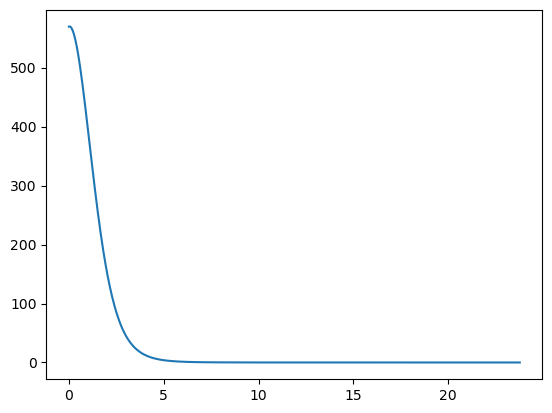

In [22]:
def I_atomic(f_arr_uniq, molecule_id, s_new_scale, plot_I_atomic = False):
    """
    Takes the atomic scattering data and generates I_atomic term of the molecular scattering equation.
    
    Arguments:
    
    f_arr_uniq (np.ndarray): Two dimensional numpy array containing the scattering intensity of each unique atom in the molecule.
                            Rows correspond to the index in uniq_names, columns correspond to the intensity data.
    molecule_id (np.ndarray): Numpy array containing the atomic id integers of each atom in
                                the molecule.
    s_new_scale (float or int): Scalar value for the interpolation step size.
    
    Returns: (I_atomic, s_new, interp_vals_amp, interp_vals_phase)
    
    I_atomic (np.ndarray): Numpy array containing the atomic scattering intensity data over the interval of s_new.
    s_new (np.ndarray): Numpy array containing the s interval/values where I_atomic is evaluated.
    interp_vals_amp (np.ndarray): Two dimensional numpy array containing the interpolated scattering amplitude of
                                    each atom in the molecule.
    interp_vals_phase (np.ndarray): Two dimensional numpy array containing the interpolated scattering amplitude of
                                    each atom in the molecule.
    """
    func_list_amps = []
    func_list_phase = []
    interp_vals_amp = []
    interp_vals_phase = []
    scat_dat = []

    for atom in range(len(molecule_id)):
        #print(atom)
        s_vals_interp = np.arange(len(f_arr_uniq[molecule_id[atom]]))
        spline_amps = interp.InterpolatedUnivariateSpline(s_vals_interp, f_arr_uniq[molecule_id[atom]])
        spline_phase = interp.InterpolatedUnivariateSpline(s_vals_interp, eta_arr_uniq[molecule_id[atom]])
        func_list_amps.append(spline_amps)
        func_list_phase.append(spline_phase)
    
        s_new = np.arange(0, 1000 * s_new_scale, s_new_scale)
        interp_res_amps = spline_amps(s_new)
        interp_res_phase = spline_phase(s_new)
    
        interp_vals_amp.append(interp_res_amps)
        interp_vals_phase.append(interp_res_phase)
    
        scat_dat.append(np.abs(interp_res_amps) ** 2) #CHECK THIS

    scat_dat = np.array(scat_dat)
    I_atomic = np.sum(scat_dat**2, axis=0)  # CHECK THIS
    if plot_I_atomic:
        plt.plot(s_new, I_atomic)
    
    return I_atomic, s_new, interp_vals_amp, interp_vals_phase

I_atomic, s_new, interp_vals_amp, interp_vals_phase = I_atomic(f_arr_uniq, molecule_id, 0.0238, plot_I_atomic = True)



In [258]:
#Canny Suckz
for i in range(len(mean_tester)):
    edges = cv2.Canny(mean_tester[i].astype(np.uint8), 100, 200)
    
    _, binary_image = cv2.threshold(edges, 100, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) > 0:
        contour = max(contours, key=cv2.contourArea) 
        moments = cv2.moments(contour)
        center_x = int(moments["m10"] / moments["m00"])
        center_y = int(moments["m01"] / moments["m00"])
        center = (center_x, center_y)
        print(center)


        center_image = mean_tester[i].copy() 
        cv2.circle(center_image, center, 5, 255, -1)

        
        # plt.imshow(center_image)
        # plt.title(f"Canny mean_tester[{i}]")
        # plt.show()

    else:
        print(f"No contours found in mean_tester[{i}].")


(756, 753)
(886, 555)
(821, 863)
(227, 130)
(775, 443)
(98, 736)
(567, 806)
(379, 917)
(899, 869)
(157, 698)
(420, 856)
(254, 675)
(189, 919)
(882, 259)
(860, 896)
(990, 985)
(106, 88)
(75, 407)
(849, 306)
(726, 208)
(308, 785)
(67, 857)
(985, 770)
(722, 856)
(148, 685)
(128, 785)
(665, 234)
(940, 742)
(858, 512)
(787, 800)
(863, 734)
(399, 74)
(670, 41)
(105, 544)
(65, 92)
(88, 741)
(658, 868)


In [ ]:
#Sobel Method


for i in range(len(mean_tester)):
    
    sobel_x = cv2.Sobel(mean_tester[i], cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(mean_tester[i], cv2.CV_64F, 0, 1, ksize=3)

    edges = np.sqrt(sobel_x**2 + sobel_y**2)
    edges = np.uint8(np.clip(edges, 0, 255))

    _, binary_image = cv2.threshold(edges, 100, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) > 0:
        contour = max(contours, key=cv2.contourArea)  # Find the largest contour (if there are multiple)
        moments = cv2.moments(contour)
        center_x = int(moments["m10"] / moments["m00"])
        center_y = int(moments["m01"] / moments["m00"])
        center = (center_x, center_y)
        print(center)

       
        center_image = mean_tester[i].copy()  # Create a copy to draw on
        cv2.circle(center_image, center, 5, 255, -1)

        # Display the image with the center point marked using matplotlib
        # plt.figure()
        # plt.imshow(center_image, cmap='gray')
        # plt.title(f"mean_tester[{i}]")
        # plt.show()

    else:
        print(f"No contours found in mean_tester[{i}].")


(461, 488)
(462, 485)
(465, 484)
(466, 490)
(467, 490)
(463, 486)
(458, 484)
(463, 486)
(461, 488)
(463, 483)
(464, 486)
(458, 485)
(464, 484)
(464, 488)
(461, 484)
(462, 483)
(463, 487)
(465, 484)
(463, 484)
(465, 482)
(461, 490)
(461, 484)
(463, 488)
(461, 484)
(463, 484)
(465, 488)
(465, 485)
(463, 492)
(459, 488)
(466, 483)
(461, 485)
(464, 485)
(458, 487)
(462, 482)
(465, 483)
(462, 488)
(463, 489)


In [259]:
radial_range = np.arange(150,250+1)
threshold = 0.1
center_guess = (512,512)

def findCenter(image, max_iter, center_guess = (512,512)):

    max_iter = 100
    center_guesses = np.empty((2, max_iter))
    center_std = np.empty(max_iter)
    results = []
    for i in range(max_iter):
        c_x, c_y = findCenterIso(image, center_guess, radial_range)
        results.append((c_x, c_y))
        print(results[-1])
        center_guesses[0,i] = c_x
        center_guesses[1,i] = c_y
        #center_std[i] = c_std
        
        if i > 1:
            if (np.all(center_guesses[:,i] - center_guesses[:,i-1]) < threshold):
                print(f"Center found on iteration{i}")
                return (center_guesses[:,i])#std?
        if (i-1) == max_iter:
            print(f"Max iterations ({max_iter}) reached.")
            return (center_guesses[:,i]) #std?

def findCenterIso(image, center_guess, radial_range = np.arange(150,251), n_iso_pxl=5000):
    
    shape_x, shape_y = np.shape(image)
    xx, yy = np.meshgrid(np.arange(shape_x)-center_guess[0], np.arange(shape_y)-center_guess[1])
    r_matrix = np.vectorize(np.hypot)(xx, yy)
    n_iso_lines = radial_range[-1] - radial_range[0] + 1
    found_center = np.empty(n_iso_lines)
    found_std = np.empty(n_iso_lines)
    c_x_array = []
    c_y_array = []
    for i in range(n_iso_lines):
        iso_idx_temp = (r_matrix >= radial_range[i] - 0.5) & (r_matrix <= radial_range[i] + 0.5)
        iso_mean = np.nanmean(image[iso_idx_temp])
        iso_std = np.nanstd(image[iso_idx_temp])
        
        iso_idx = (image > iso_mean - iso_std) & (image < iso_mean + iso_std)
        iso_y, iso_x = np.where(iso_idx)
        
        if len(iso_y) < n_iso_pxl:
            n_iso_pxl = len(iso_y)
        idx_rand = np.random.choice(len(iso_y), n_iso_pxl, replace=False)
        iso_xy = np.column_stack((iso_x[idx_rand], iso_y[idx_rand]))
        c_x, c_y, r = circFitBucher(iso_xy)
        c_x_array.append(c_x)
        c_y_array.append(c_y)
    c_x = np.mean(c_x_array)
    c_y = np.mean(c_y_array)
    return c_x, c_y

def circFitBucher(iso_xy):
    
    x = iso_xy[:, 0]
    y = iso_xy[:, 1]

    A = np.column_stack((2 * x, 2 * y, np.ones_like(x)))
    b = -(x**2 + y**2)

    a = np.linalg.lstsq(A, b, rcond=None)[0]

    x_c = -0.5 * a[0]
    y_c = -0.5 * a[1]
    r = np.sqrt((a[0]**2 + a[1]**2) / 4 - a[2])

    return x_c, y_c, r

In [260]:
print(findCenter(mean_tester[11], 100))

/var/folders/8h/n_4wfdcd1p56hg3y1lh5x5gc0000gn/T/ipykernel_45275/182021936.py:68: RuntimeWarning: invalid value encountered in sqrt
  r = np.sqrt((a[0]**2 + a[1]**2) / 4 - a[2])


(256.02452598233583, 353.7199155009356)
(256.2353765443386, 353.4538542031033)
(256.14449662996105, 353.49785405643297)
(256.0838772491369, 353.346566432088)
(256.42131045677974, 353.22426846272344)
(256.1248734204971, 353.62900966253795)
(256.1416720945972, 353.2212879359056)
(256.20585698009484, 353.54051114062173)
(256.0796865613399, 353.40844104336975)
(256.126920561536, 353.36997053206676)
(256.23032478496947, 353.5535215814913)
(256.200939027966, 353.0309752640783)
(256.35239425032063, 353.3378916548605)
(255.87559448937284, 353.45152461082097)
(256.3450994415506, 353.25871483628265)
(256.35459624021325, 353.7524074506268)
(256.2614270983925, 353.51186066968324)
(256.01666815152356, 353.8657055061259)
(256.0312955096187, 353.06534641962475)
(256.3839852430902, 353.31742816113257)
(256.339252060363, 353.58402577626345)
(256.0941647384101, 353.94567743983015)
(256.04309371810297, 353.45929276536606)
(256.1118822790468, 353.3354550653557)
(256.0312773984177, 353.87569881829825)
(256